# `meanderpy` River Example

This notebook focuses on using the `meanderpy` package to generate synthetic river networks that will be used to test `WigglyRivers` functionallity on detecting meanders and calculating metrics. 

`meanderpy` is a Python package that produces meandering rivers using a simple kinematic model presented in Howard & Knutson (1984) (Sylvester, Z., 2023). The package GitHub repository can be found [here](https://github.com/zsylvester/meanderpy) and can be installed using the following command:

```bash
pip install meanderpy
```

To start this example we first import the packages necessary to run the code.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib ipympl

In [3]:
# Importing Packages
import os
import copy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display, HTML
from IPython.display import display
from scipy.spatial import Delaunay
from scipy.spatial.distance import euclidean
from scipy import interpolate
import statsmodels.api as sm

import meanderpy as mp

# Importing WigglyRivers Packages
from WigglyRivers import RiverDatasets, RiverTransect
from WigglyRivers import RiverFunctions as RF
from WigglyRivers import ExtractNHDPlusHRData as NHD
from WigglyRivers.utilities import utilities as utl
from WigglyRivers.utilities import filesManagement as FM
from WigglyRivers import Logger
from WigglyRivers import WaveletTreeFunctions as WTFunc
from WigglyRivers import iwavelet

# Set seed for numpy
np.random.seed(0)

In [19]:
# ------------------------------
# Functions
# ------------------------------
def plot_complete_values(river, only_significant=True):
    # Extract Information
    x = river.x
    y = river.y
    s = river.s
    angle = river.angle
    c = river.c
    wavelen_c = river.cwt_wavelength_c
    wavelen_angle = river.cwt_wavelength_angle
    power_c = copy.deepcopy(river.cwt_power_c)
    coi_c = river.cwt_coi_c
    power_angle = copy.deepcopy(river.cwt_power_angle)
    coi_angle = river.cwt_coi_angle
    gws_c = river.cwt_gws_c
    gws_angle = river.cwt_gws_angle
    sawp_c = river.cwt_sawp_c
    sawp_angle = river.cwt_sawp_angle

    if only_significant:
        power_c = river.cwt_power_c_sig
        gws_c = river.cwt_gws_c_sig
        sawp_c = river.cwt_sawp_c_sig
        power_angle = river.cwt_power_angle_sig
        gws_angle = river.cwt_gws_angle_sig
        sawp_angle = river.cwt_sawp_angle_sig

    fig, ax = plt.subplots(7, 1, figsize=(8, 10))
    ax = ax.ravel()
    # Planimetry Coordinate
    i_d = 0
    ax[i_d].plot(x, y, 'k', linewidth=1.5)
    ax[i_d].set_aspect('equal')
    # Extend y axis
    ax[i_d].set_ylim([np.min(y)-np.std(y), np.max(y)+np.std(y)])
    ax[i_d].set_xticks([])
    ax[i_d].set_yticks([])
    # Remove axis lines
    ax[i_d].spines['top'].set_visible(False)
    ax[i_d].spines['right'].set_visible(False)
    ax[i_d].spines['bottom'].set_visible(False)
    ax[i_d].spines['left'].set_visible(False)
    ax[i_d].set_title('River Planimetry')

    # Curvature
    i_d = 1
    ax[i_d].plot(s, c, 'k', linewidth=0.5)
    ax[i_d].set_xlim([np.min(s), np.max(s)])
    # ax[i_d].set_xticklabels([])
    ax[i_d].set_ylabel(r'$c$')
    ax[i_d].set_title('Curvature')

    # Power Curvature
    i_d = 2
    im_c = ax[i_d].pcolormesh(s, wavelen_c, power_c, shading='auto', cmap='Blues')
    # Plot COI
    ax[i_d].fill_between(s, coi_c*0+wavelen_c[-1], coi_c, facecolor='none',
                        edgecolor='#00000040', hatch='x')
    ax[i_d].set_yscale('log')
    ax[i_d].set_ylim([np.max(wavelen_c), np.min(wavelen_c)])
    ax[i_d].set_xlim([np.min(s), np.max(s)])
    ax[i_d].set_yticklabels([])
    # for peak in gws_peak_wavelen_c:
    #     ax[i_d].axhline(peak, color='r', linestyle='--')
    # ax[i_d].set_xticklabels([])
    # Move Figure

    # SAWP
    i_d = 3
    ax[i_d].plot(s, sawp_c, 'k', linewidth=0.5)
    ax[i_d].set_xlim([np.min(s), np.max(s)])
    ax[i_d].set_xlabel('Distance (m)')
    ax[i_d].set_ylabel('SAWP')

    # Angle
    i_d = 4
    ax[i_d].plot(s, angle, 'k', linewidth=0.5)
    ax[i_d].set_xlim([np.min(s), np.max(s)])
    ax[i_d].set_ylabel(f'$\\theta$')
    ax[i_d].set_title('Direction Angle')

    # Power Curvature
    i_d = 5
    im_angle = ax[i_d].pcolormesh(s, wavelen_angle, power_angle, shading='auto', cmap='Blues')
    ax[i_d].fill_between(s, coi_angle*0+wavelen_angle[-1], coi_angle, facecolor='none',
                        edgecolor='#00000040', hatch='x')
    ax[i_d].set_yscale('log')
    ax[i_d].set_ylim([np.max(wavelen_angle), np.min(wavelen_angle)])
    ax[i_d].set_xlim([np.min(s), np.max(s)])
    ax[i_d].set_yticklabels([])
    # for peak in gws_peak_wavelen_angle:
    #     ax[i_d].axhline(peak, color='r', linestyle='--')
    # SAWP
    i_d = 6
    ax[i_d].plot(s, sawp_angle, 'k', linewidth=0.5)
    ax[i_d].set_xlim([np.min(s), np.max(s)])
    ax[i_d].set_ylabel('SAWP')
    ax[i_d].set_xlabel('Distance (m)')

    plt.tight_layout()
    fig.subplots_adjust(left=0.25, right=0.90)
    # Add GWS c
    pos = ax[2].get_position()
    ax_gws_c = fig.add_axes([0.1, pos.y0, 0.135, pos.height])
    ax_gws_c.plot(gws_c, wavelen_c, 'k', linewidth=0.5)
    ax_gws_c.set_yscale('log')
    ax_gws_c.set_ylim([np.max(wavelen_c), np.min(wavelen_c)])
    ax_gws_c.set_ylabel(f'$\lambda$ (m)')
    ax_gws_c.set_xlabel('Power (m$^2$)')
    ax_gws_c.set_title('GWS')
    # for peak in gws_peak_wavelen_c:
    #     ax_gws_c.axhline(peak, color='r', linestyle='--')

    pos = ax[5].get_position()
    ax_gws_angle = fig.add_axes([0.1, pos.y0, 0.135, pos.height])
    ax_gws_angle.plot(gws_angle, wavelen_angle, 'k', linewidth=0.5)
    ax_gws_angle.set_yscale('log')
    ax_gws_angle.set_ylim([np.max(wavelen_angle), np.min(wavelen_angle)])
    ax_gws_angle.set_ylabel(f'$\lambda$ (m)')
    ax_gws_angle.set_xlabel('Power (m$^2$)')
    ax_gws_angle.set_title('GWS')
    # for peak in gws_peak_wavelen_angle:
    #     ax_gws_angle.axhline(peak, color='r', linestyle='--')

    return


In [5]:
# Start Logger
logger = Logger(console=True)

2023-11-20 13:35:34,400[INFO] set_logger: Starting log


## Synthetic River Networks Analysis

### Generate Synthetic Rivers

We use the example in the `meanderpy` repository to generate a series of synthetic rivers that will be used in our analysis. The code below will generate and save four meandering rivers with multiple complexities. From the simple sinuos-like river to the more complex river with multiple bends and loops. Keep in mind that the model will take some time to run.

In [31]:
# ------------------------------
# Create River with meanderpy
# ------------------------------
nit = 1500                   # number of iterations
W = 200                      # channel width (m)
D = 6.0                     # channel depth (m)
depths = D * np.ones((nit,))  # channel depths for different iterations
pad = 100                    # padding (number of nodepoints along centerline)
deltas = 50.0                # sampling distance along centerline
Cfs = 0.011 * np.ones((nit,)) # dimensionless Chezy friction factor
crdist = 2 * W               # threshold distance at which cutoffs occur
kl = 60.0/(365*24*60*60.0)   # migration rate constant (m/s)
kv =  1.0e-12               # vertical slope-dependent erosion rate constant (m/s)
dt = 2*0.05*365*24*60*60.0     # time step (s)
dens = 1000                  # density of water (kg/m3)
saved_ts = 20                # which time steps will be saved
n_bends = 100                 # approximate number of bends you want to model
Sl = 0.0                     # initial slope (matters more for submarine channels than rivers)
t1 = 500                    # time step when incision starts
t2 = 700                    # time step when lateral migration starts
t3 = 1200                    # time step when aggradation starts
aggr_factor = 2e-9         # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3)

ch = mp.generate_initial_channel(W, depths[0], Sl, deltas, pad, n_bends) # initialize channel
chb = mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[]) # create channel belt object

chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration
# migrate an additional 1000 iterations and plot results
chb.migrate(1000,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor)

# ------------------------------
# Save Dataset
# ------------------------------
n_channels = len(chb.channels)
channels_to_save = [50, 80, 100, 123]
data = {}
for i, i_ch in enumerate(channels_to_save):
    x_ch = chb.channels[i_ch].x
    y_ch = chb.channels[i_ch].y
    data[str(i)] = {'x': x_ch, 'y': y_ch}

FM.save_data(data, path_output='synthetic_rivers/',
             file_name='synthetic_rivers_meanderpy.hdf5')
print('Synthetic Rivers Generated and Saved Succesfully')

100%|██████████| 1000/1000 [07:36<00:00,  2.19it/s]

Synthetic Rivers Generated and Saved Succesfully


Let's look at the meandering channels generated by `meanderpy`:

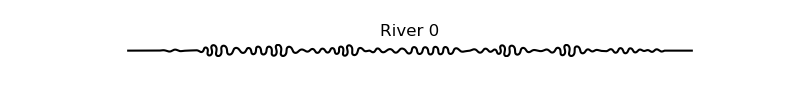

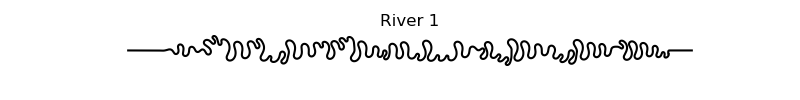

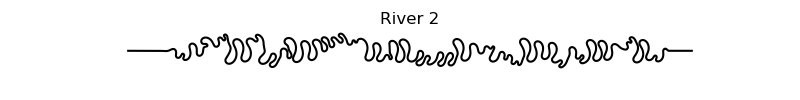

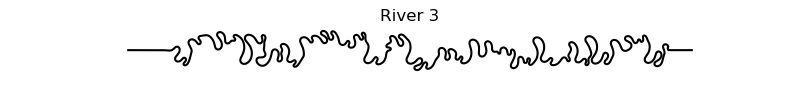

In [6]:
data = FM.load_data('synthetic_rivers/synthetic_rivers_meanderpy.hdf5')
river_ids = list(data.keys())
plt.close('all')
for river_id in river_ids:
    x_ch = data[river_id]['x']
    y_ch = data[river_id]['y']
    plt.figure(figsize=(8, 1))
    plt.plot(x_ch, y_ch, '-k')
    # plt.plot(x_ch, y_ch, 'ob')
    plt.title(f'River {river_id}')
    plt.gca().set_aspect('equal', adjustable='box')
    # Remove ticks
    plt.xticks([])
    plt.yticks([])
    # Remove axis lines
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['bottom'].set_visible(False)
    plt.gca().spines['left'].set_visible(False)
    utl.cr_folder('synthetic_rivers/results')
    plt.savefig(f'synthetic_rivers/results/river_{river_id}.png', dpi=300)
    plt.show()


### Adding Noise to the River

To reflect real data samples, we added noise into the synthetic rivers and included that information into the data for comparison. We also perform the numerical computation of the curvature of the original coordiates to have a comparison to the ones calculated by `WigglyRivers`.


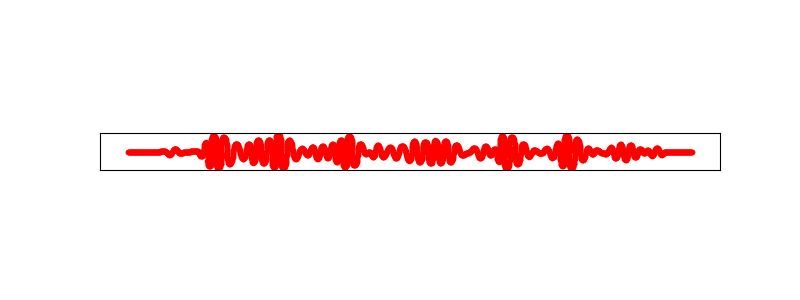

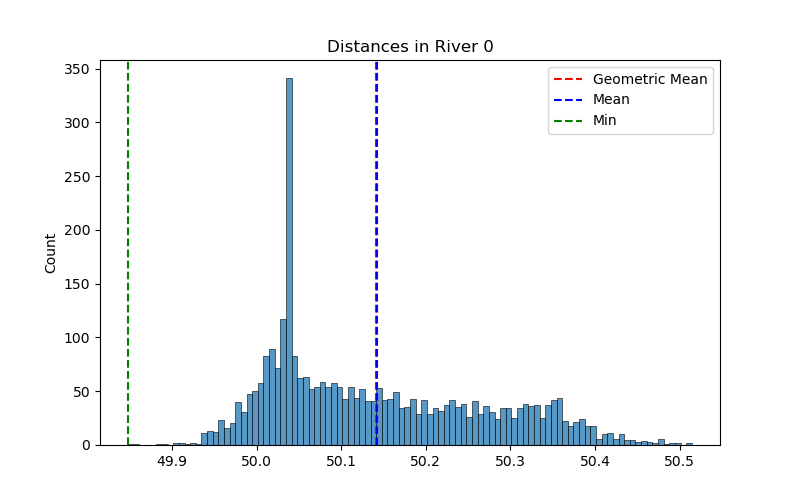

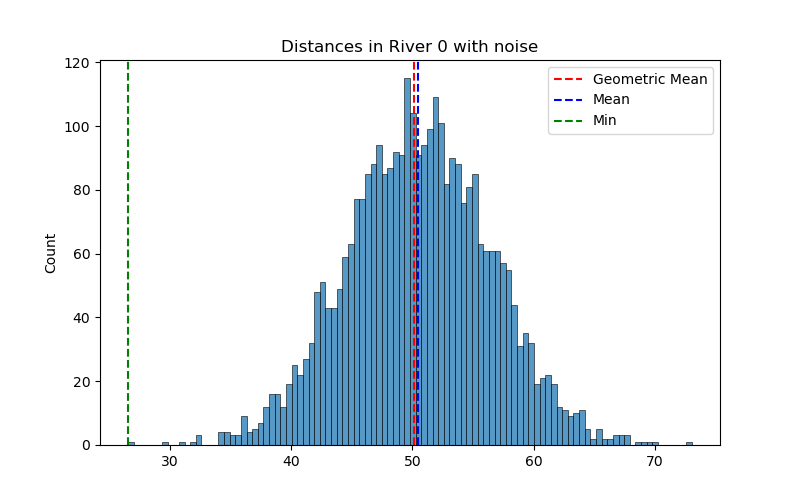

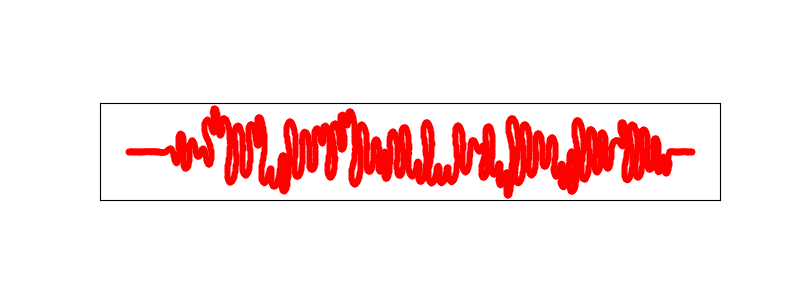

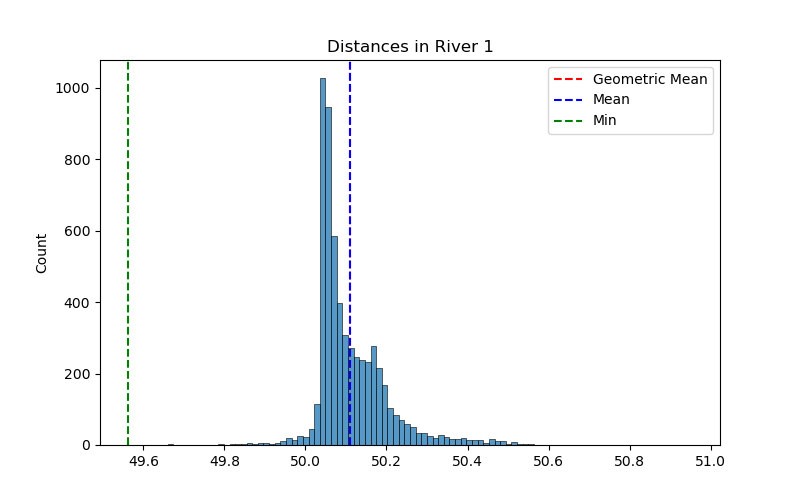

...

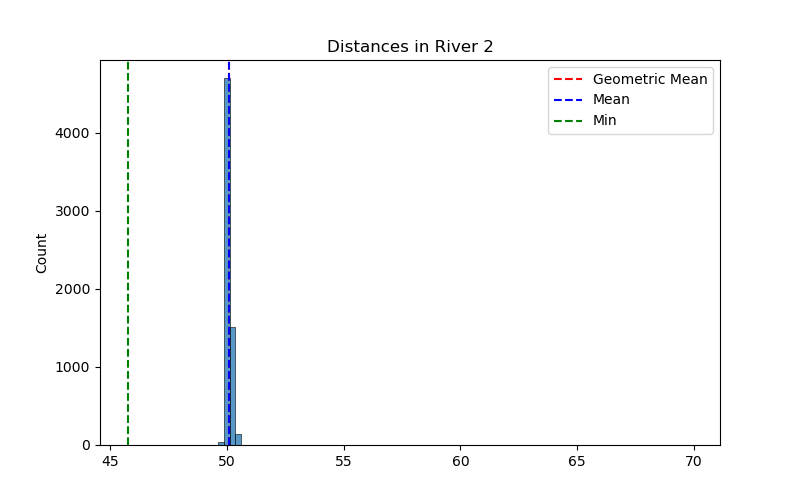

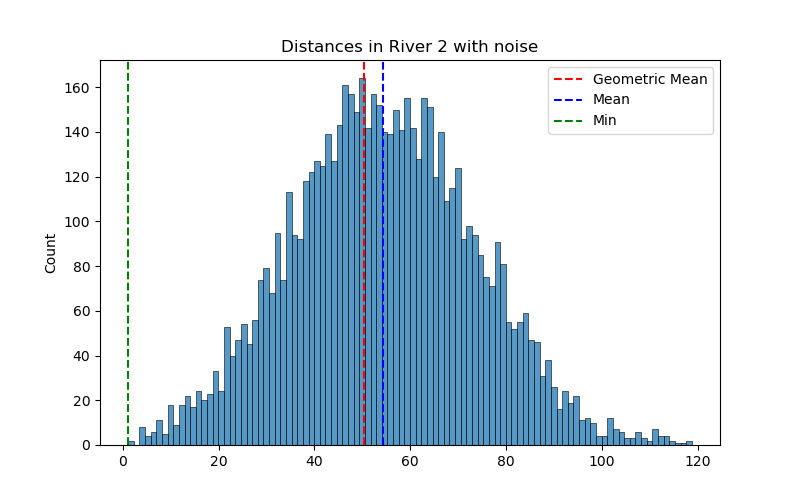

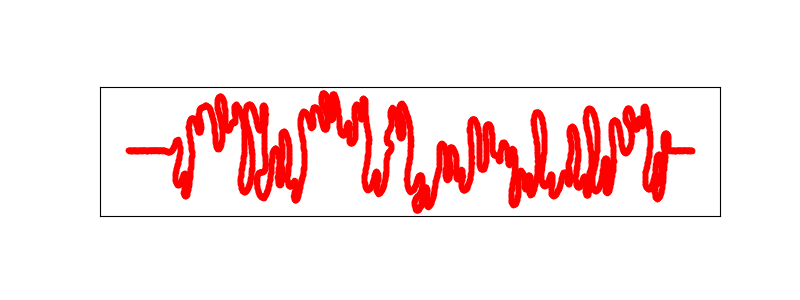

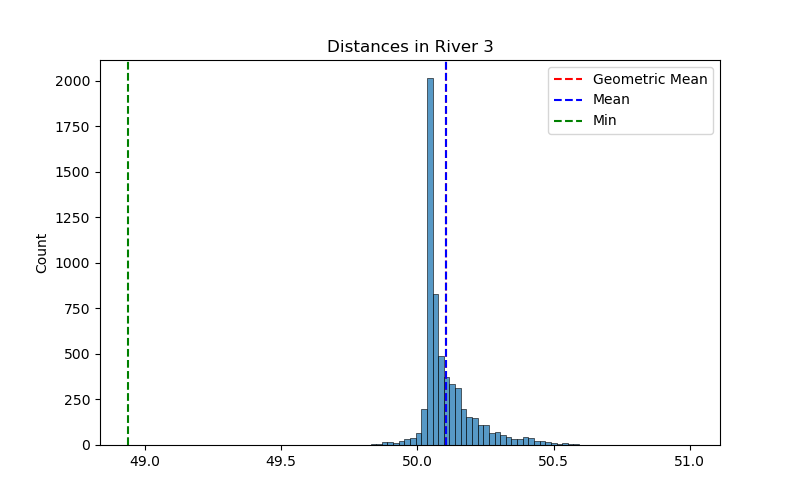

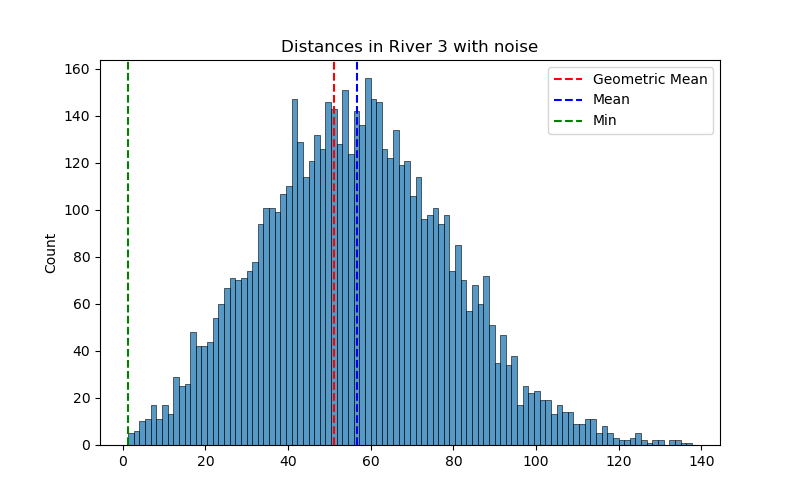

In [7]:
# Load river data
data = FM.load_data('synthetic_rivers/synthetic_rivers_meanderpy.hdf5')
river_ids = list(data.keys())

utl.cr_folder('synthetic_rivers/results')

plt.close('all')

# Loop throug the rivers
for id_river_general in river_ids:
    # ------------------------------
    # Select River to perform analysis
    # ------------------------------
    x_ch = data[id_river_general]['x']
    y_ch = data[id_river_general]['y']
    coords = np.array([x_ch, y_ch]).T
    s_ch = RF.get_reach_distances(coords)
    ds = np.diff(s_ch)
    ds = np.append(ds[0], ds)
    # Curvature original data
    _, c_ch, _ = RF.calculate_curvature(s_ch, x_ch, y_ch)

    # ------------------------------
    # Noise
    # ------------------------------
    # Use a linear model to get a sense of the added noise
    line_model = sm.OLS(y_ch, x_ch).fit()
    sd_resid = np.std(line_model.resid)
    sigma = sd_resid/100
    # Add noise to the coordiantes
    x_ch_noise = x_ch + np.random.normal(0, sigma, size=len(x_ch))
    y_ch_noise = y_ch + np.random.normal(0, sigma, size=len(y_ch))
    coords = np.array([x_ch_noise, y_ch_noise]).T
    s_ch_noise = RF.get_reach_distances(coords)
    ds_noise = np.diff(s_ch_noise)
    ds_noise = np.append(ds_noise[0], ds_noise)

    # ------------------------------
    # Calculate additional variables
    # ------------------------------
    # Width
    w_m = np.ones_like(x_ch) * 200.0

    w_m_gm = 10**np.mean(np.log10(w_m))
    geometric_mean_value = 10**np.mean(np.log10(ds))
    mean_value = np.mean(ds)
    min_value = np.min(ds)

    gm_noise = 10**np.mean(np.log10(ds_noise))
    mean_noise = np.mean(ds_noise)
    min_noise = np.min(ds_noise)
    # ------------------------------
    # Save noisy data
    # ------------------------------
    data[id_river_general]['c'] = c_ch
    data[id_river_general]['s'] = s_ch
    data[id_river_general]['ds'] = ds
    data[id_river_general]['x_noise'] = x_ch_noise
    data[id_river_general]['y_noise'] = y_ch_noise
    data[id_river_general]['s_noise'] = s_ch_noise
    data[id_river_general]['w_m'] = w_m

    # ------------------------------
    # Plots
    # ------------------------------
    plt.figure(figsize=(8, 3))
    plt.plot(x_ch, y_ch, '-k')
    plt.plot(x_ch_noise, y_ch_noise, '.r')
    plt.gca().set_aspect(3, adjustable='box')
    plt.xticks([])
    plt.yticks([])
    plt.show()

    data_df = pd.DataFrame({'x': x_ch, 'y': y_ch, 's': s_ch, 'ds': ds,
                            'x_noise': x_ch_noise, 'y_noise': y_ch_noise,
                            's_noise': s_ch_noise, 'c': c_ch,
                            'ds_noise': ds_noise, 'w_m': w_m})
    plt.figure(figsize=(8, 5))
    plt.title(f'Distances in River {id_river_general}')
    sns.histplot(x=ds, bins=100)
    # plt.axvline(w_m_gm, color='k', linestyle='--',
    #             label='Width Geometric Mean')
    plt.axvline(geometric_mean_value, color='r', linestyle='--',
                label='Geometric Mean')
    plt.axvline(mean_value, color='b', linestyle='--', label='Mean')
    plt.axvline(min_value, color='g', linestyle='--', label='Min')
    plt.legend()
    plt.savefig(
        f'synthetic_rivers/results/dist_hist_river_{id_river_general}.png',
        dpi=300)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.title(f'Distances in River {id_river_general} with noise')
    sns.histplot(x=ds_noise, bins=100)
    # plt.axvline(w_m_gm, color='k', linestyle='--',
    #             label='Width Geometric Mean')
    plt.axvline(gm_noise, color='r', linestyle='--',
                label='Geometric Mean')
    plt.axvline(mean_noise, color='b', linestyle='--', label='Mean')
    plt.axvline(min_noise, color='g', linestyle='--', label='Min')
    plt.legend()
    plt.show()


# Save data
FM.save_data(data, path_output='synthetic_rivers/',
             file_name='synthetic_rivers_w_noise.hdf5')

### Create River Class

We load the coordinates to the `Rivers` class. We use the the geometric mean of the distance to resample the river.

2023-11-20 13:39:21,765[INFO] info: Start Logger in RiverDatasets
2023-11-20 13:39:21,809[INFO] info: Resample calculated with `River.calculate_spline()`
2023-11-20 13:39:21,842[INFO] info: Resample calculated with `River.calculate_spline()`
2023-11-20 13:39:21,890[INFO] info: Resample calculated with `River.calculate_spline()`
2023-11-20 13:39:21,929[INFO] info: Resample calculated with `River.calculate_spline()`
2023-11-20 13:39:21,996[INFO] info: Resample calculated with `River.calculate_spline()`
2023-11-20 13:39:22,048[INFO] info: Resample calculated with `River.calculate_spline()`
2023-11-20 13:39:22,117[INFO] info: Resample calculated with `River.calculate_spline()`
2023-11-20 13:39:22,167[INFO] info: Resample calculated with `River.calculate_spline()`


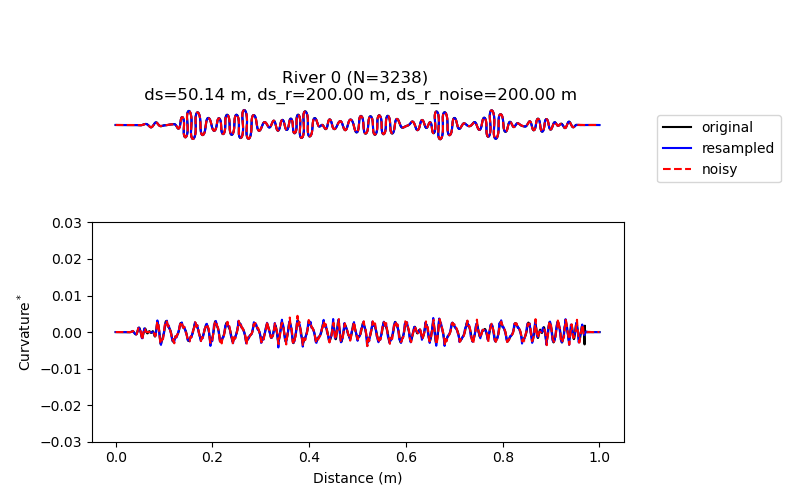

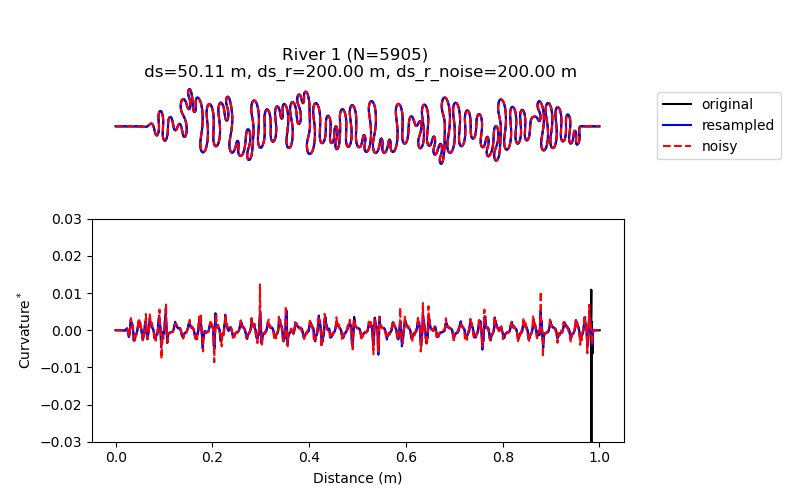

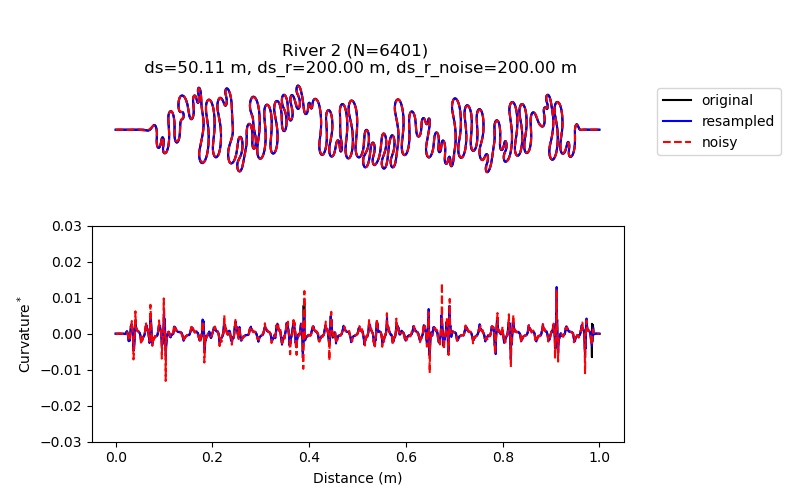

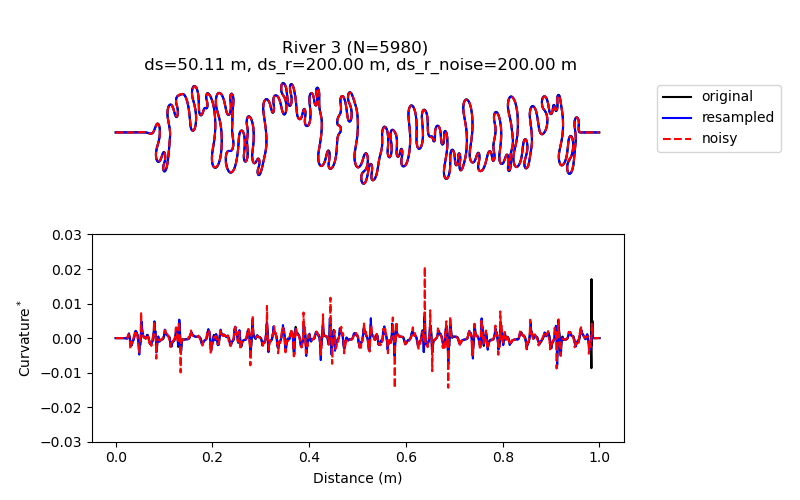

In [14]:
# Reset Figures
plt.close('all')
# Load river data
data = FM.load_data('synthetic_rivers/synthetic_rivers_w_noise.hdf5')
river_ids = list(data.keys())
# ------------------------------
# Arguments for the noise data
# ------------------------------
kwargs_resample = {
    '0':{'smooth': 1e2},
    '1':{'smooth': 1e2},
    '2':{'smooth': 1e2},
    '3':{'smooth': 1e2},
    '0_noise':{'smooth': 1e2},
    '1_noise':{'smooth': 1e3},
    '2_noise':{'smooth': 1e3},
    '3_noise':{'smooth': 1e3},
    }

# ------------------------------
# Create Rivers class
# ------------------------------
rivers = RiverDatasets(logger=logger)
# ------------------------------
# Add Rives into class
# ------------------------------
i = 0
for river_id in river_ids:
    # ------------------------------
    # Add original river 
    # ------------------------------
    x_ch = data[river_id]['x']
    y_ch = data[river_id]['y']
    w_m = data[river_id]['w_m']
    rivers.add_river(river_id, x_ch, y_ch, w_m=w_m, resample_flag=True,
                     kwargs_resample=kwargs_resample[river_id],
                     scale_by_width=False)
    # Calculate curvature
    rivers[river_id].calculate_curvature()
    # ------------------------------
    # Add noisy river 
    # ------------------------------
    x_ch_noise = data[river_id]['x_noise']
    y_ch_noise = data[river_id]['y_noise']
    w_m = data[river_id]['w_m']
    rivers.add_river(
        f'{river_id}_noise', x_ch_noise, y_ch_noise, w_m=w_m,
        resample_flag=True,
        kwargs_resample=kwargs_resample[f'{river_id}_noise'],
        scale_by_width=False)
    # Calculate cuvature
    rivers[f'{river_id}_noise'].calculate_curvature()

for river_id in river_ids:
    # ------------------------------
    # Plot
    # ------------------------------
    x_ch = data[river_id]['x']
    y_ch = data[river_id]['y']
    c_ch = data[river_id]['c']
    s_ch = data[river_id]['s']
    ds_ch = data[river_id]['ds']
    x = rivers[river_id].x
    y = rivers[river_id].y
    c = rivers[river_id].c
    s = rivers[river_id].s
    ds = rivers[river_id].ds
    x_noise = rivers[f'{river_id}_noise'].x
    y_noise = rivers[f'{river_id}_noise'].y
    c_noise = rivers[f'{river_id}_noise'].c
    s_noise = rivers[f'{river_id}_noise'].s
    ds_noise = rivers[f'{river_id}_noise'].ds

    f, ax = plt.subplots(2, 1, figsize=(8, 5))
    # Plot river
    ax[0].plot(x_ch, y_ch, '-k', label='original')
    ax[0].plot(x, y, '-b', label='resampled')
    ax[0].plot(x_noise, y_noise, '--r', label='noisy')
    ax[0].set_aspect(3, adjustable='box')
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].set_title(
        f'River {river_id} (N={len(x_ch)}) \n ds={np.mean(ds_ch):.2f} m, '
        f'ds_r={ds:.2f} m, '
        f'ds_r_noise={ds_noise:.2f} m')
    # Remove axis lines
    ax[0].spines['top'].set_visible(False)
    ax[0].spines['right'].set_visible(False)
    ax[0].spines['bottom'].set_visible(False)
    ax[0].spines['left'].set_visible(False)
    ax[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Curvature
    ax[1].plot(s_ch/np.max(s_ch), c_ch, '-k', label='original')
    # ax[1].plot(s_ch/np.max(s_ch), c_ch*w_m_gm, '-k', label='original')
    ax[1].plot(s/np.max(s), c, '-b', label='resampled')
    ax[1].plot(s_noise/np.max(s_noise), c_noise, '--r', label='noisy')
    # if river_id == '0':
    ax[1].set_ylim([-0.03, 0.03])
    # ax[1].set_ylim([-3, 3])
    ax[1].set_xlabel('Distance (m)')
    ax[1].set_ylabel(r'Curvature$^*$')
    plt.tight_layout()
    utl.cr_folder('synthetic_rivers/results/')
    plt.savefig(f'synthetic_rivers/results/river_{river_id}_curvature.png',
                dpi=300)
    plt.show()

# ------------------------------
# Save Rivers
# ------------------------------
# rivers.save_rivers(
#     f'synthetic_rivers/rivers_class/',
#     'river_network.hdf5', save_cwt_info=True)


 ### Multiscale Characterization

 Let's estimate the spectral variables using the Morlet mother vavelet functions...



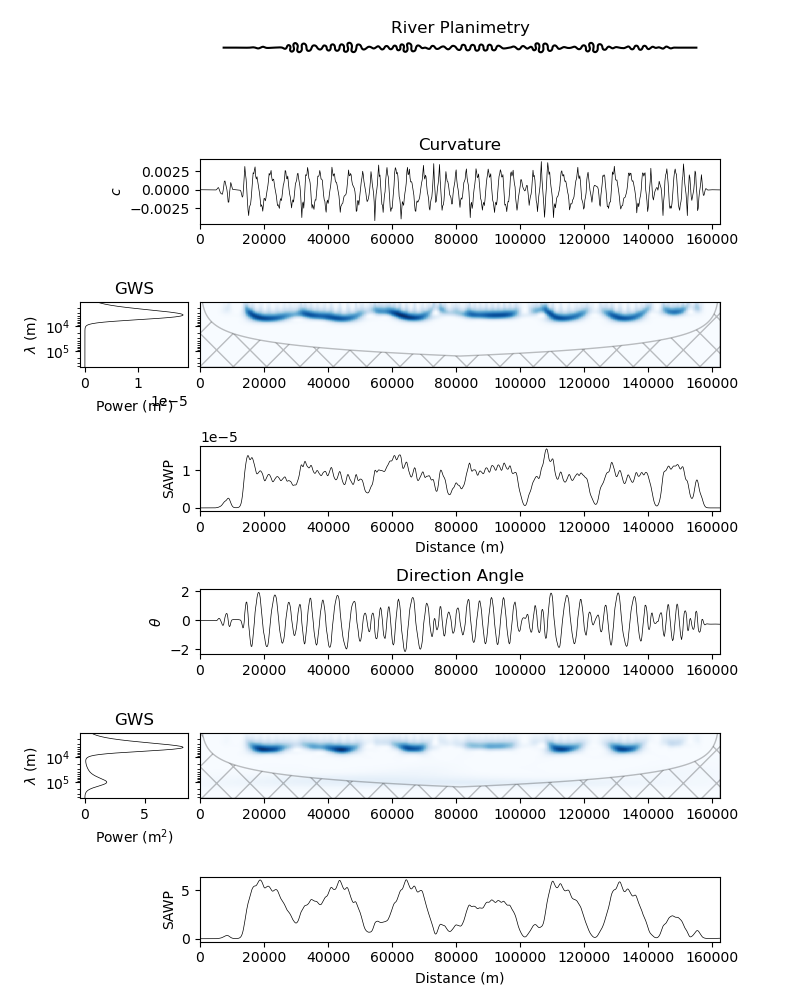

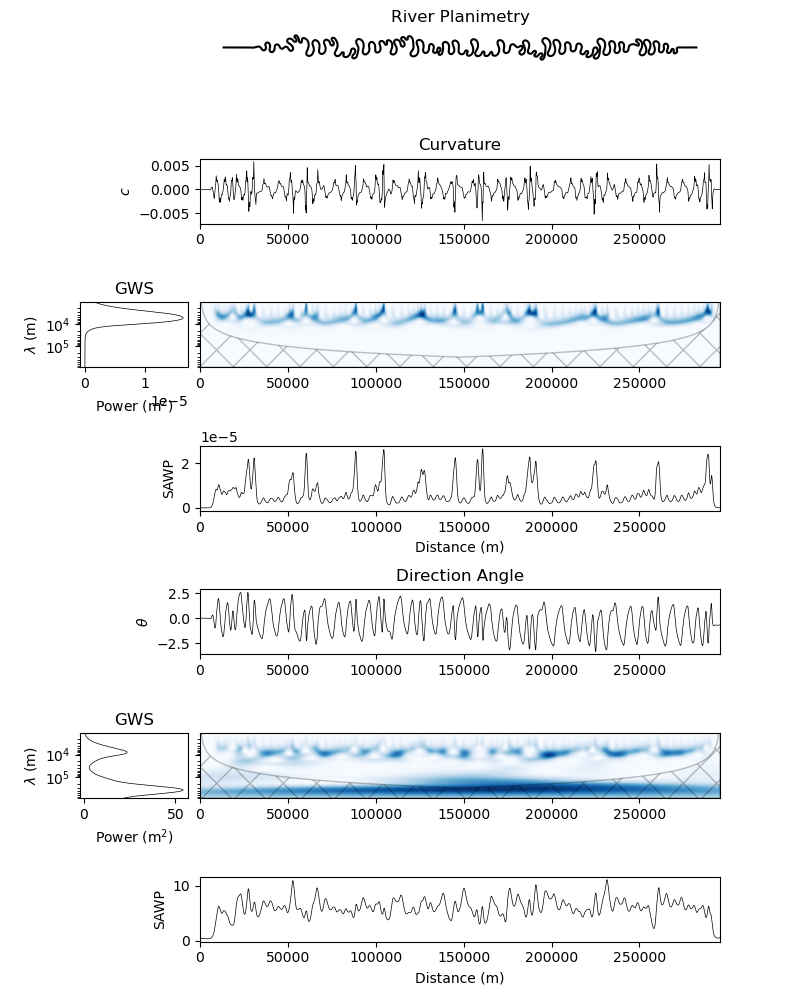

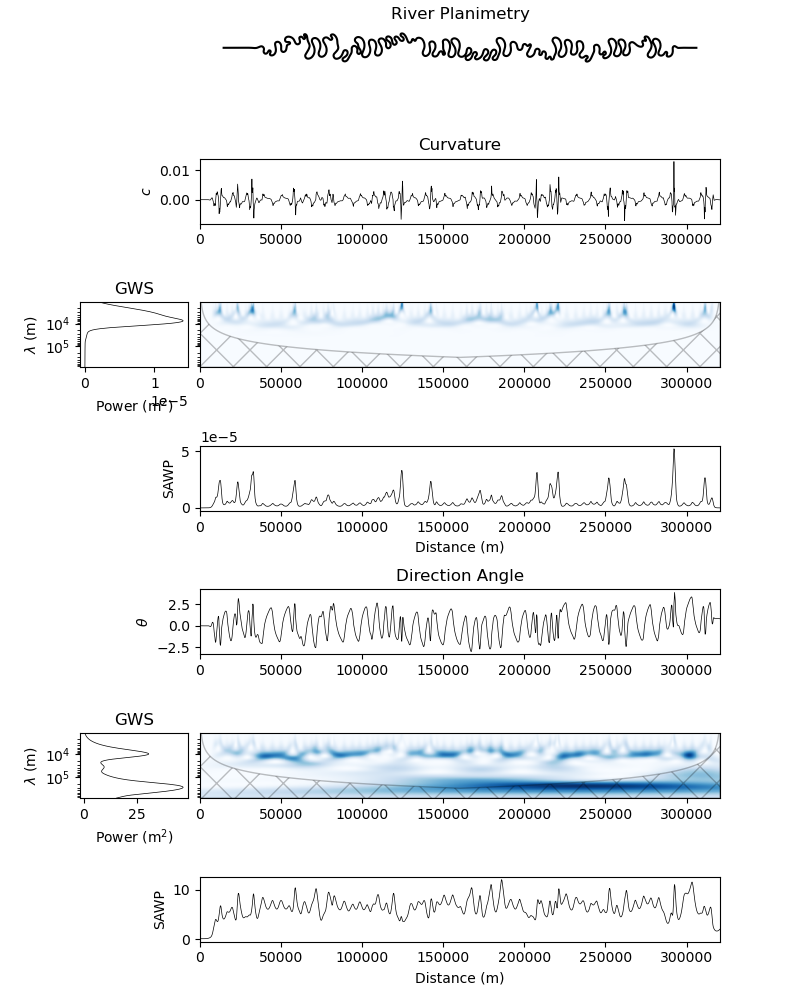

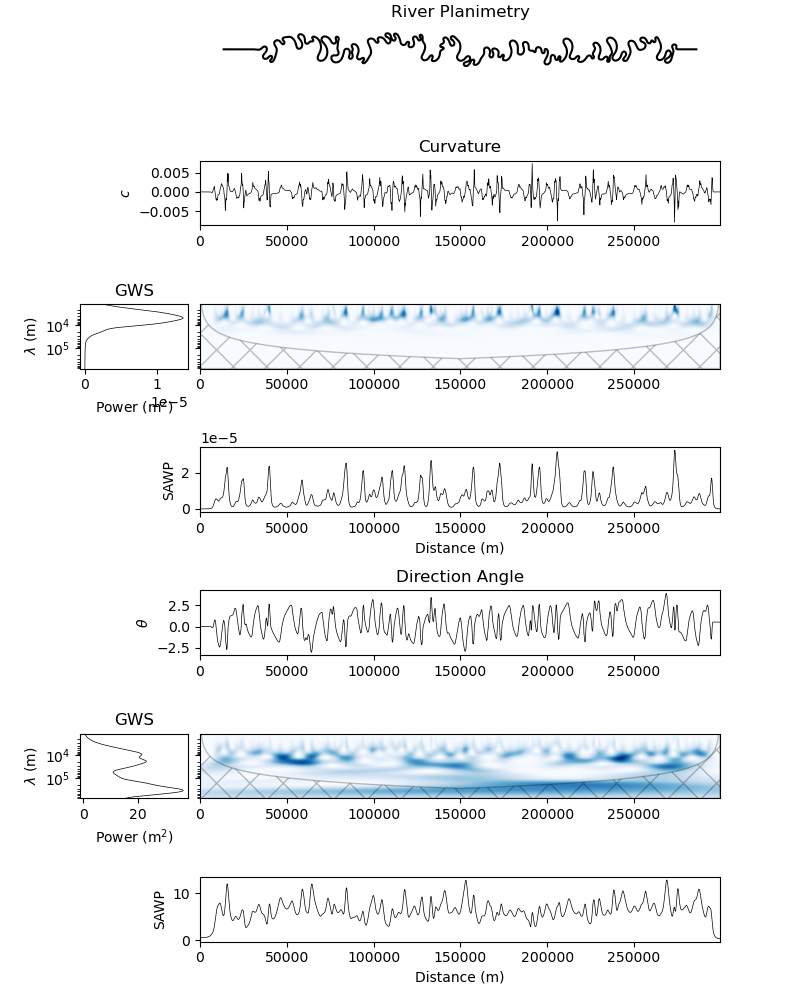

In [20]:
for river_id in river_ids:
    # Calculate curvature
    rivers[river_id].calculate_curvature()
    # Calculate CWT
    rivers[river_id].get_cwt_curvature(mother='MORLET')
    rivers[river_id].get_cwt_angle(mother='MORLET')
    plot_complete_values(rivers[river_id], only_significant=False)
    plt.show()


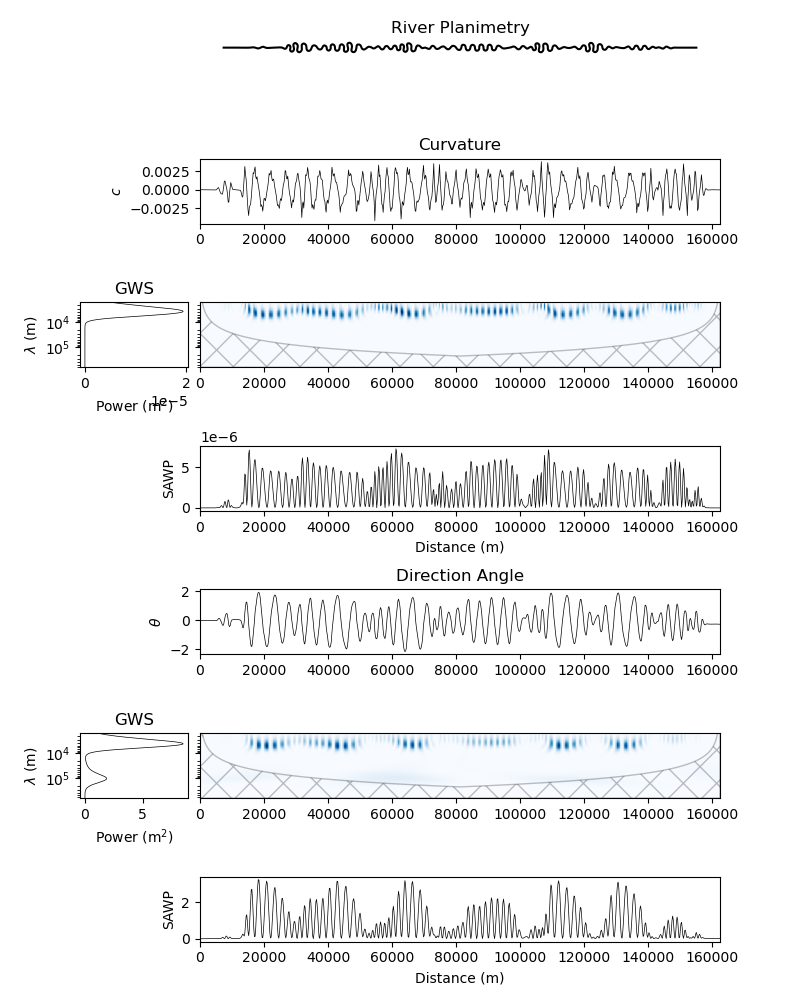

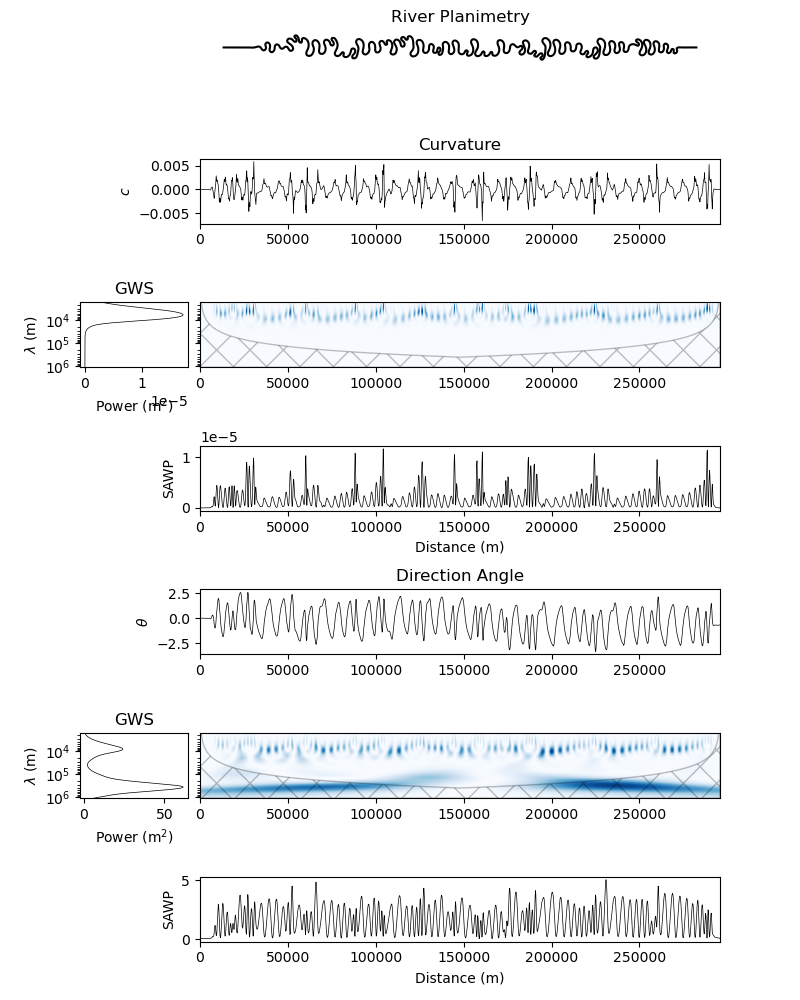

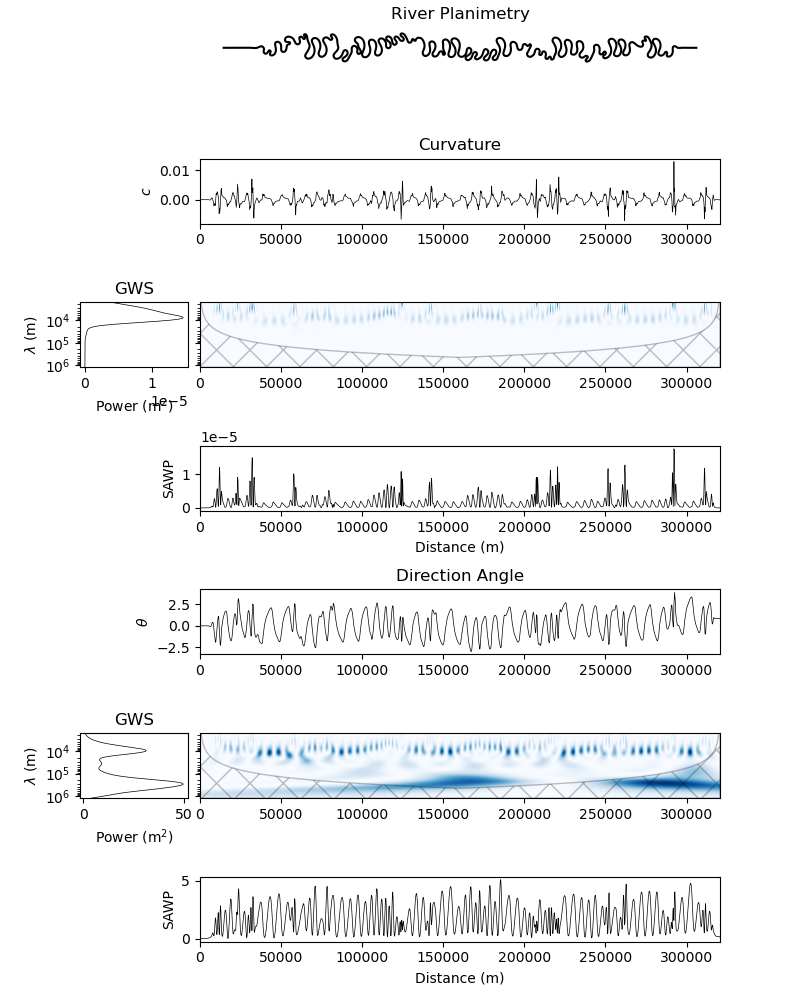

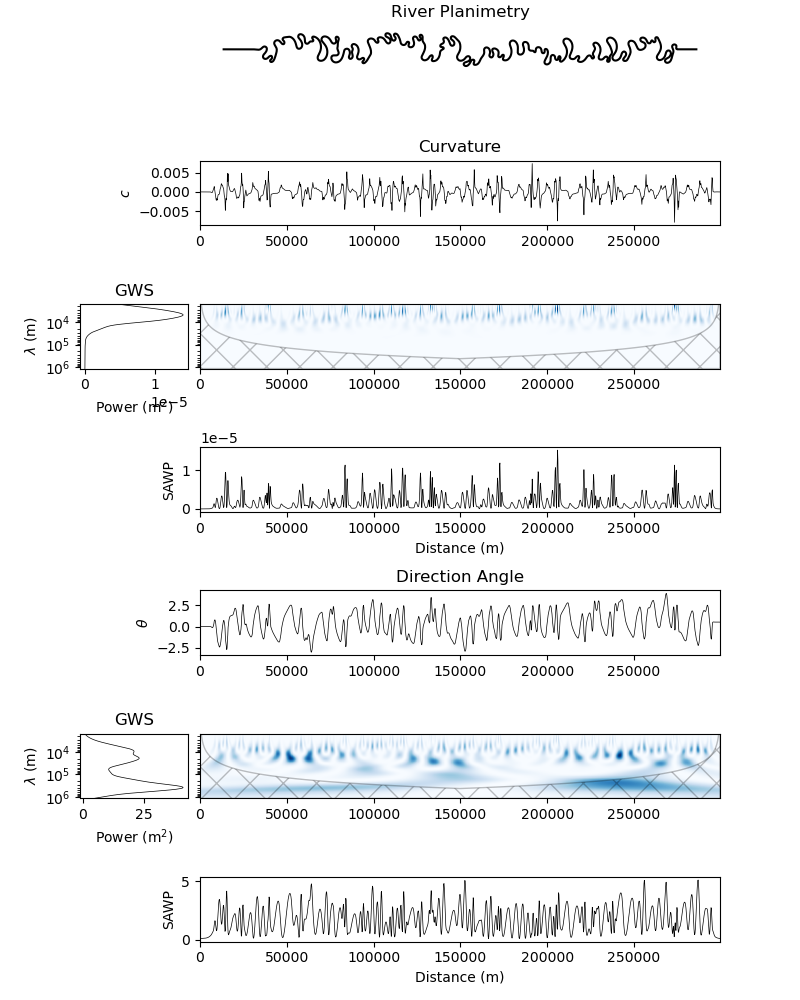

In [21]:
for river_id in river_ids:
    # Calculate curvature
    rivers[river_id].calculate_curvature()
    # Calculate CWT
    rivers[river_id].get_cwt_curvature(mother='DOG')
    rivers[river_id].get_cwt_angle(mother='DOG')
    plot_complete_values(rivers[river_id], only_significant=False)
    plt.show()


 ### Extract meanders

 Now that we have a `RiverDatasets` class we can go ahead perform the automated extraction of meanders on the synthetic rivers.

In [10]:
data_to_save = {}
# =================================
# Extract Meanders
# =================================
for river_id in river_ids:
    # =================================
    # Extract Meanders
    # =================================
    # --------------------
    # Calculate CWT
    # --------------------
    rivers[f'{river_id}'].extract_cwt_tree()
    rivers[f'{river_id}_noise'].extract_cwt_tree()
    # -----------------------------
    # Prune by peak power
    # -----------------------------
    rivers[f'{river_id}'].prune_tree_by_peak_power()
    rivers[f'{river_id}_noise'].prune_tree_by_peak_power()
    # -----------------------------
    # Prune by sinuosity
    # -----------------------------
    rivers[f'{river_id}'].prune_tree_by_sinuosity(1.05)
    rivers[f'{river_id}_noise'].prune_tree_by_sinuosity(1.05)
    # -----------------------------
    # Add meander to database
    # -----------------------------
    rivers[f'{river_id}'].add_meanders_from_tree_scales(overwrite=True, clip='downstream')
    rivers[f'{river_id}_noise'].add_meanders_from_tree_scales(overwrite=True, clip='downstream')
    # ---------------------------
    # Calculate reach sinuosity
    # ---------------------------
    rivers[f'{river_id}'].calculate_reach_metrics()
    rivers[f'{river_id}_noise'].calculate_reach_metrics()


# ------------------------------
# Save Rivers
# ------------------------------
rivers.save_rivers(
    f'synthetic_rivers/rivers_class_cwt/',
    'river_network.hdf5', save_cwt_info=True)



2023-11-20 13:36:18,674[INFO] info:   Running CWT...
2023-11-20 13:36:18,709[INFO] info:   Getting the scale tree...
2023-11-20 13:36:19,007[INFO] info:   Finding peaks in CWT...
2023-11-20 13:36:19,048[INFO] info:   Detecting meanders...
2023-11-20 13:36:19,065[INFO] info:   Projecting tree in planimetry...
2023-11-20 13:36:19,490[INFO] info:   Running CWT...
2023-11-20 13:36:19,519[INFO] info:   Getting the scale tree...
2023-11-20 13:36:19,814[INFO] info:   Finding peaks in CWT...
2023-11-20 13:36:19,852[INFO] info:   Detecting meanders...
2023-11-20 13:36:19,869[INFO] info:   Projecting tree in planimetry...
2023-11-20 13:36:20,843[INFO] info:   Running CWT...
2023-11-20 13:36:20,899[INFO] info:   Getting the scale tree...
2023-11-20 13:36:21,906[INFO] info:   Finding peaks in CWT...
2023-11-20 13:36:22,031[INFO] info:   Detecting meanders...
2023-11-20 13:36:22,056[INFO] info:   Projecting tree in planimetry...
2023-11-20 13:36:22,627[INFO] info:   Running CWT...
2023-11-20 13:36:

### Explore the Network

In the following code blocks we will show how to explore the current network with the information gathered from the characterization of meanders. Let's start by loading the information and looking at the tree structure found in the spectrum of the curvature of the river network.

In [8]:
# Load Last Rivers obtained
rivers = RiverDatasets(logger=logger)
path_to_load = f'synthetic_rivers/rivers_class_cwt/'
rivers.load_river_network(
    f'{path_to_load}river_network.hdf5',
    fn_tree_scales=f'{path_to_load}tree_scales.p',
    fn_meanders_database=f'{path_to_load}meander_database.csv',
    resample_flag=True)

2023-10-26 09:57:09,961[INFO] info: Start Logger in Rivers
2023-10-26 09:57:10,298[INFO] info: Resample calculated with `River.calculate_spline()`
2023-10-26 09:57:10,614[INFO] info: Resample calculated with `River.calculate_spline()`
2023-10-26 09:57:10,961[INFO] info: Resample calculated with `River.calculate_spline()`
2023-10-26 09:57:11,365[INFO] info: Resample calculated with `River.calculate_spline()`
2023-10-26 09:57:11,811[INFO] info: Resample calculated with `River.calculate_spline()`
2023-10-26 09:57:12,231[INFO] info: Resample calculated with `River.calculate_spline()`
2023-10-26 09:57:12,903[INFO] info: Resample calculated with `River.calculate_spline()`
2023-10-26 09:57:13,400[INFO] info: Resample calculated with `River.calculate_spline()`


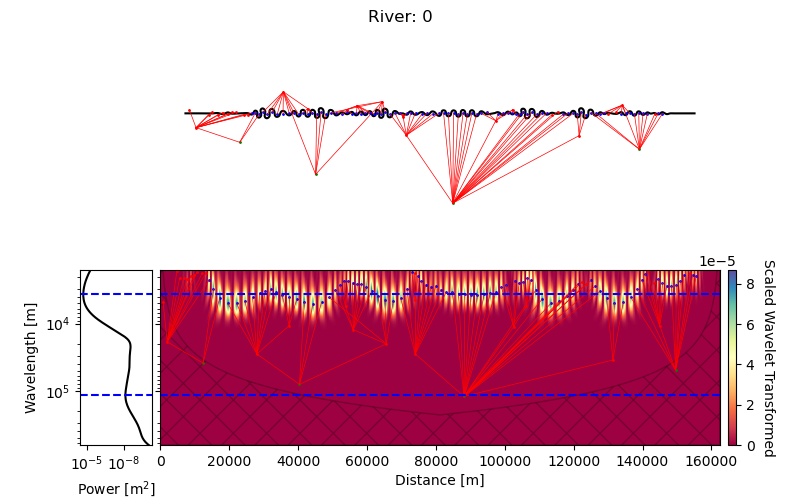

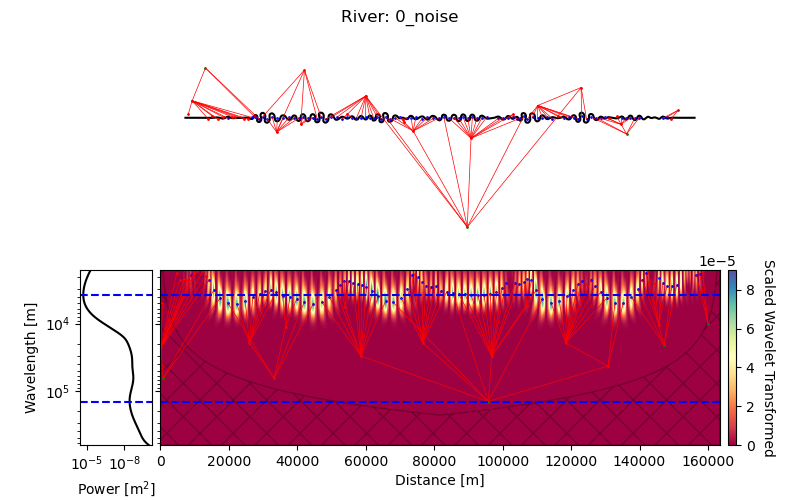

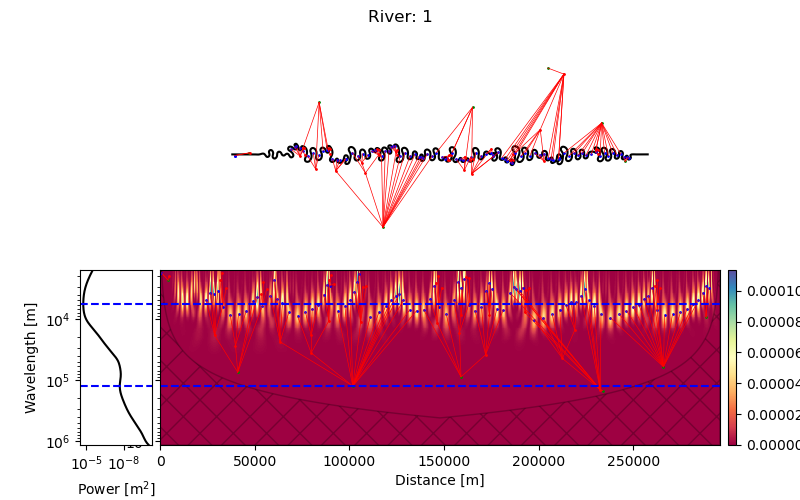

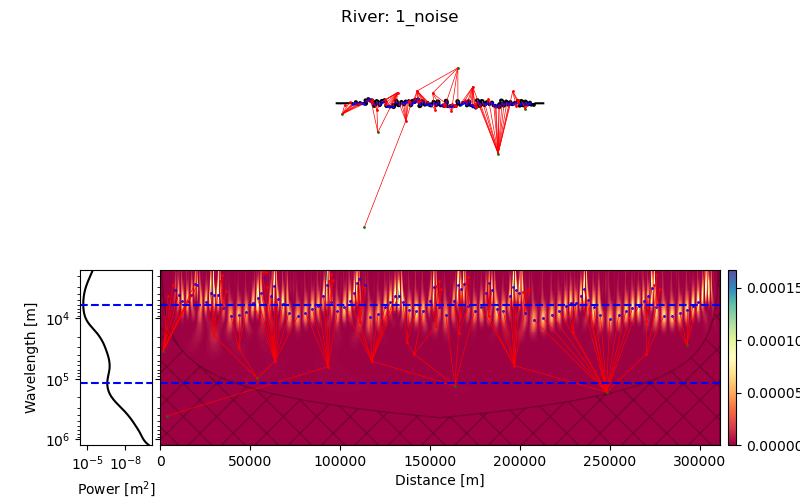

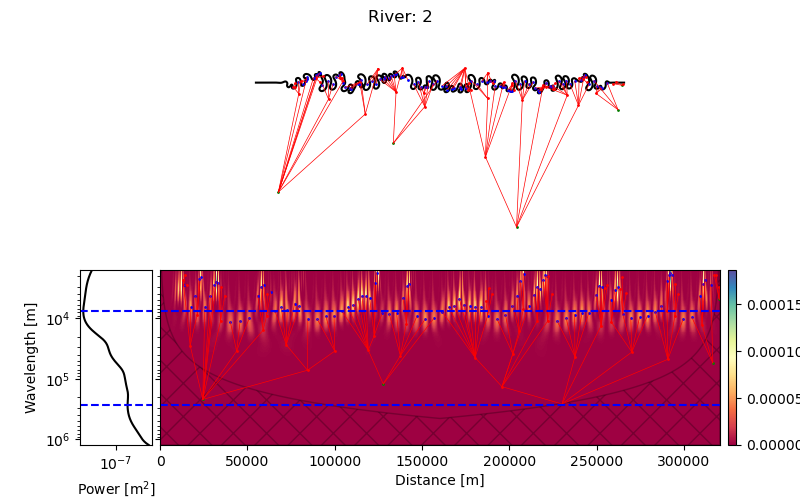

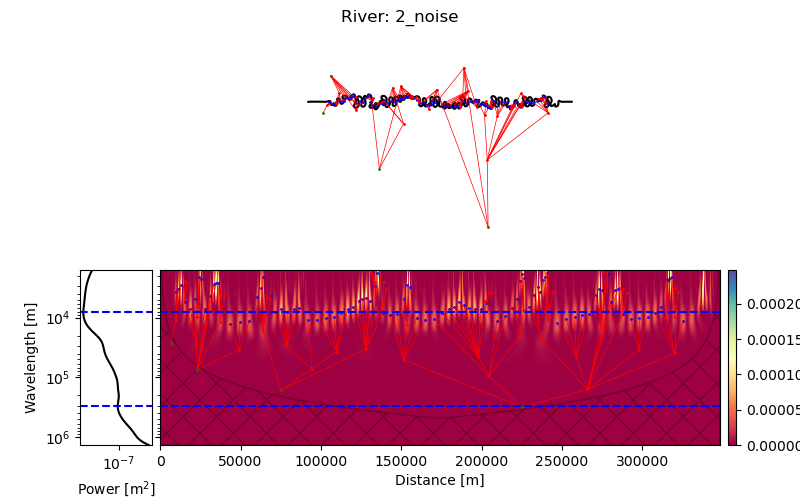

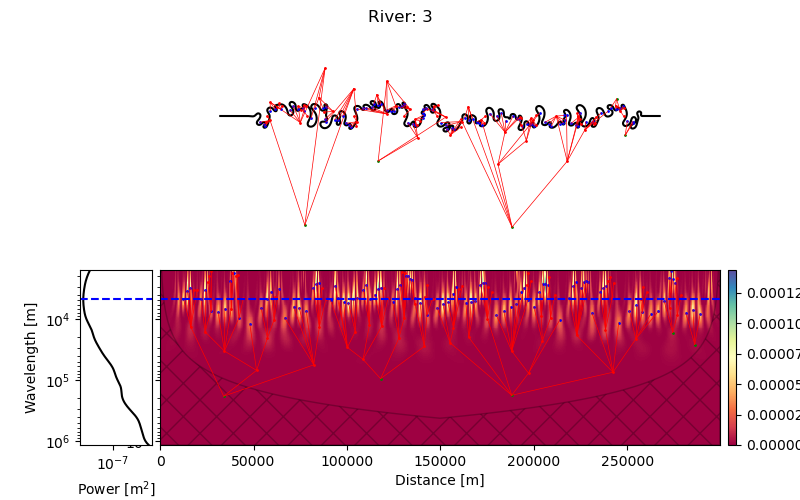

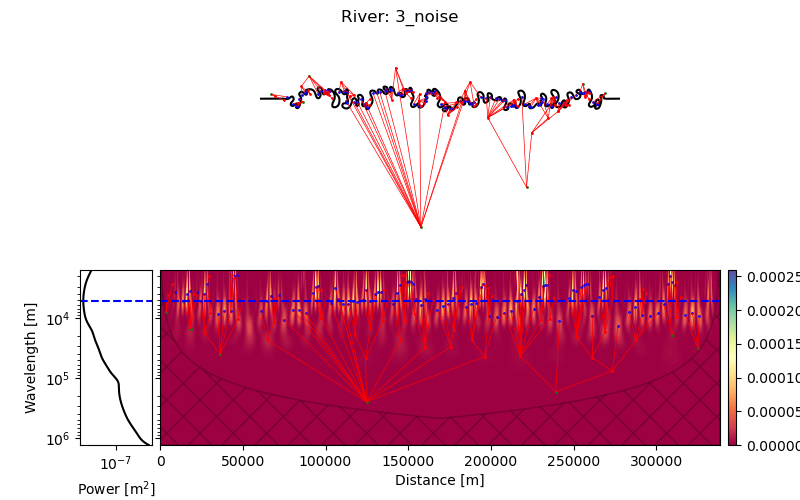

In [13]:
# Plor Rivers node tree
plt.close('all')
river_ids = rivers['id_values']
river_ids = np.sort(river_ids)
for river_id in river_ids:
    rivers[river_id].plot_tree_nodes(markersize=1, linewidth=0.5)
    utl.cr_folder('synthetic_rivers/results/cwt/')
    plt.savefig(f'synthetic_rivers/results/cwt/river_{river_id}_all.png',
                dpi=300)
    plt.show()


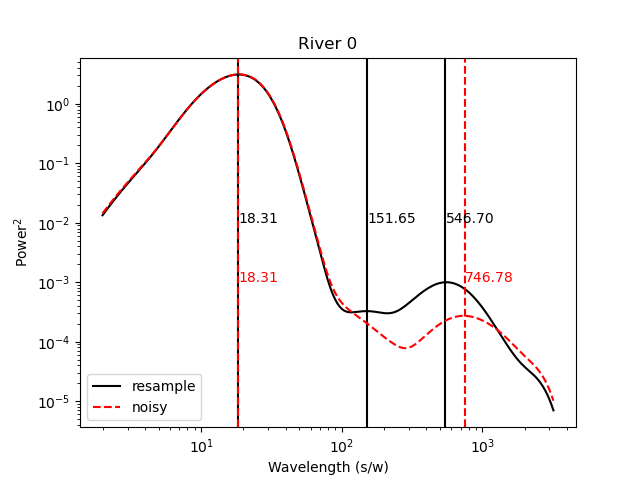

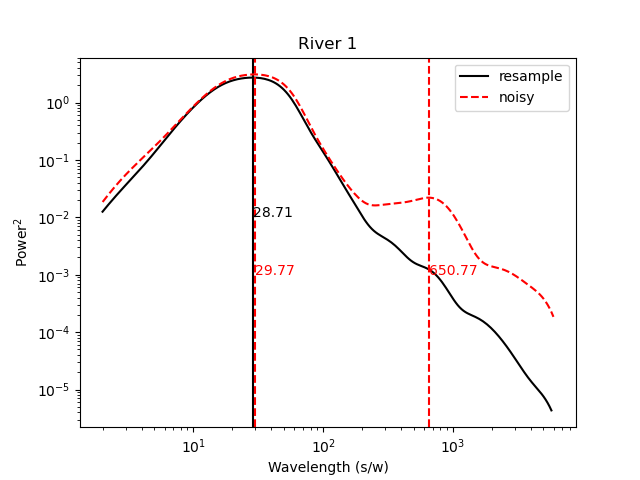

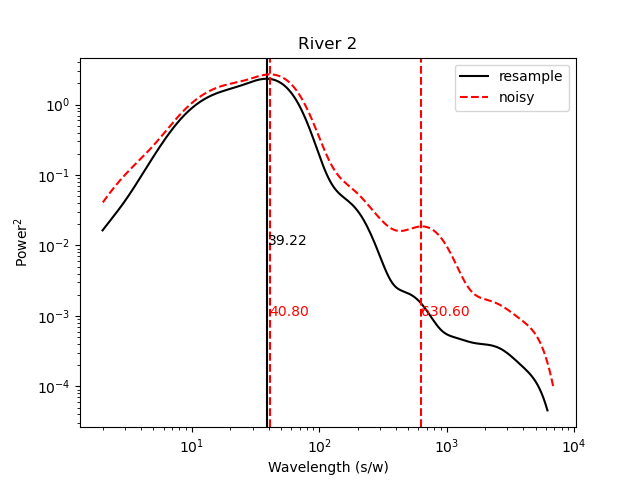

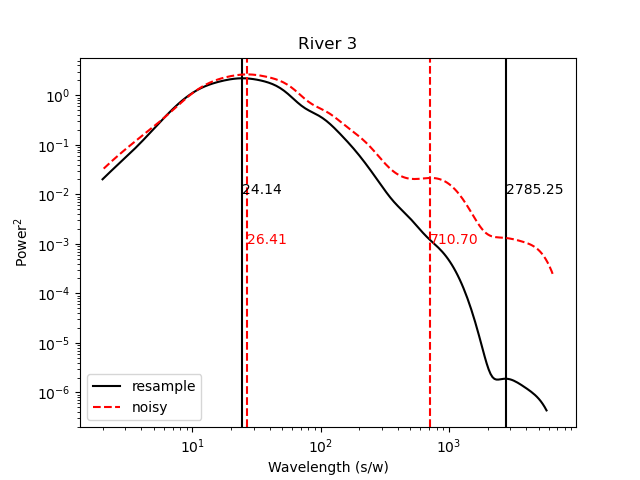

In [9]:
# Plot comparison of GWS
river_ids_2 = ['0', '1', '2', '3']
for river_id in river_ids_2:
    gws = rivers[river_id].cwt_gws
    peak_gws_wavelength = rivers[river_id].cwt_gws_peak_wavelength
    gws_noise = rivers[f'{river_id}_noise'].cwt_gws
    peak_gws_wavelength_noise = rivers[f'{river_id}_noise'].cwt_gws_peak_wavelength
    wavelength = rivers[river_id].cwt_wavelength
    wavelength_noise = rivers[f'{river_id}_noise'].cwt_wavelength
    plt.figure()
    plt.title(f'River {river_id}')
    plt.plot(wavelength, gws, '-k', label='resample')
    for peak in peak_gws_wavelength:
        plt.axvline(peak, color='k', linestyle='-')
        # Annotate peak value
        plt.annotate(f'{peak:.2f}', (peak, 1e-2))
    plt.plot(wavelength_noise, gws_noise, '--r', label='noisy')
    for peak in peak_gws_wavelength_noise:
        plt.axvline(peak, color='r', linestyle='--')
        # annotate peak value
        plt.annotate(f'{peak:.2f}', (peak, 1e-3), color='r')
    plt.xlabel('Wavelength (s/w)')
    plt.ylabel(f'Power$^2$')
    plt.gca().set_xscale('log')
    plt.gca().set_yscale('log')
    plt.legend()
    utl.cr_folder('synthetic_rivers/results/cwt/')
    plt.savefig(f'synthetic_rivers/results/cwt/river_{river_id}_gws.png',
                dpi=300)
    plt.show()

### Analysis per tree


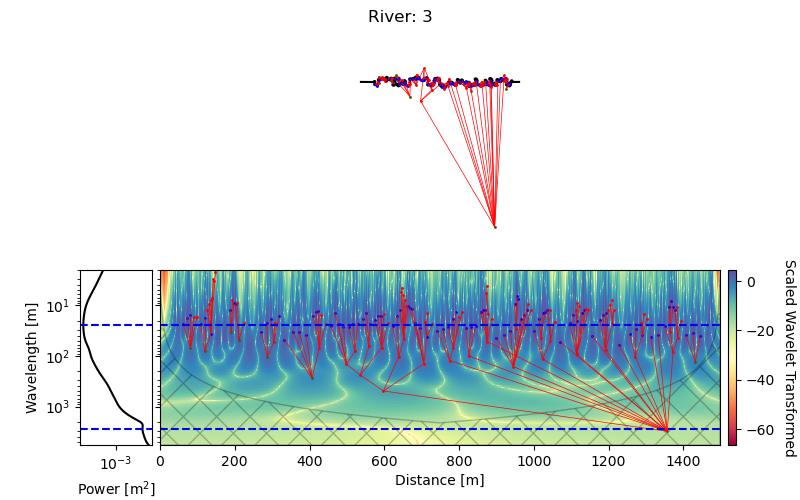

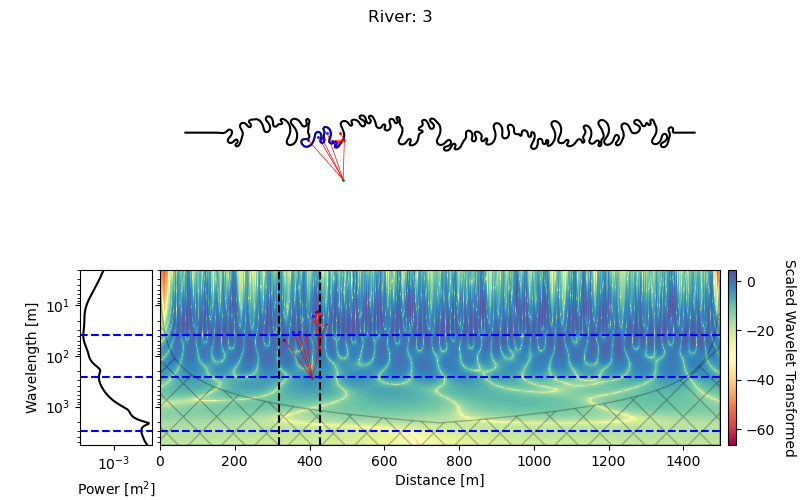

In [5]:
rivers['3'].plot_tree_nodes(markersize=1, linewidth=0.5)
rivers['3'].plot_tree_nodes(tree_ids=1, markersize=1, linewidth=0.5)

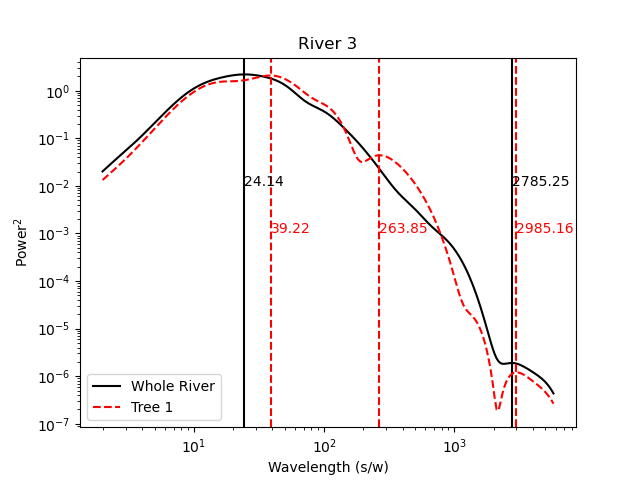

In [14]:
river_id = '3'
tree_id = 1

gws = rivers[river_id].cwt_gws
peak_gws_wavelength = rivers[river_id].cwt_gws_peak_wavelength
gws_noise = rivers[f'{river_id}'].tree_scales[tree_id].gws
peak_gws_wavelength_noise = rivers[f'{river_id}'].tree_scales[tree_id].gws_peak_wavelength
wavelength = rivers[river_id].cwt_wavelength
plt.figure()
plt.title(f'River {river_id}')
plt.plot(wavelength, gws, '-k', label='Whole River')
for peak in peak_gws_wavelength:
    plt.axvline(peak, color='k', linestyle='-')
    # Annotate peak value
    plt.annotate(f'{peak:.2f}', (peak, 1e-2))
plt.plot(wavelength, gws_noise, '--r', label=f'Tree {tree_id}')
for peak in peak_gws_wavelength_noise:
    plt.axvline(peak, color='r', linestyle='--')
    # annotate peak value
    plt.annotate(f'{peak:.2f}', (peak, 1e-3), color='r')
plt.xlabel('Wavelength (s/w)')
plt.ylabel(f'Power$^2$')
plt.gca().set_xscale('log')
plt.gca().set_yscale('log')
plt.legend()
utl.cr_folder('synthetic_rivers/results/closer_look/')
plt.savefig(f'synthetic_rivers/results/closer_look/river_{river_id}_gws.png',
            dpi=300)
plt.show()

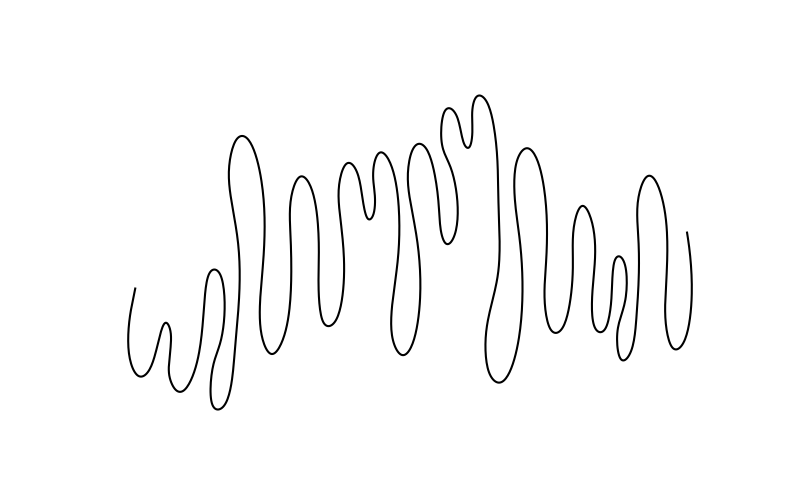

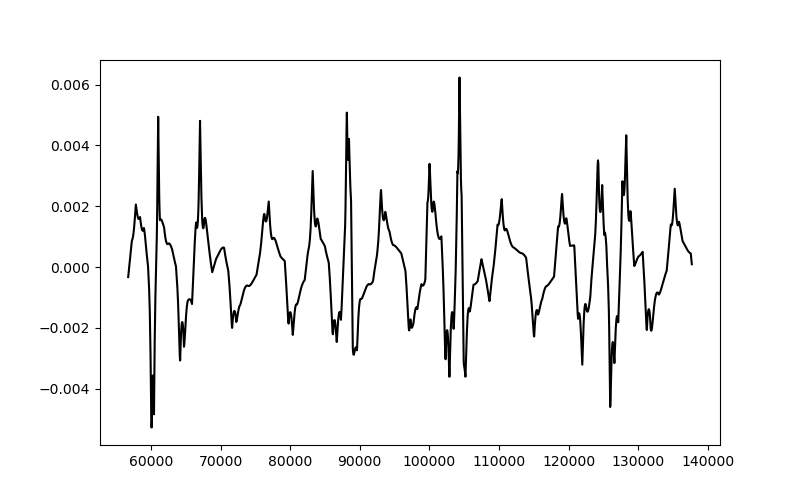

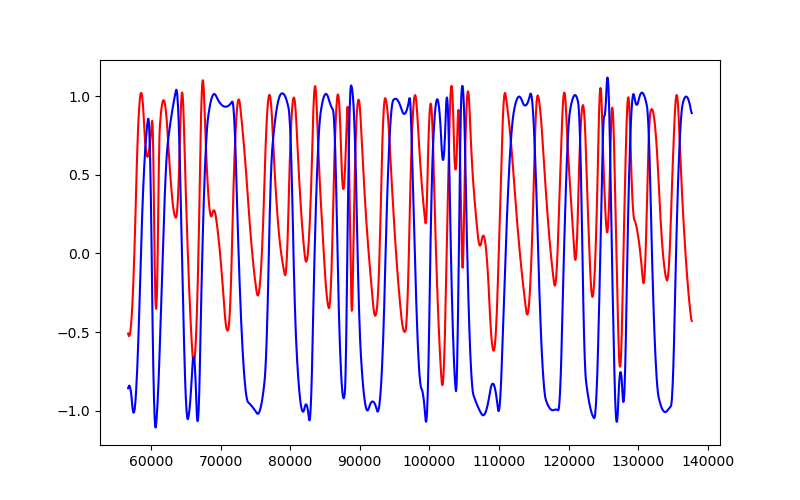

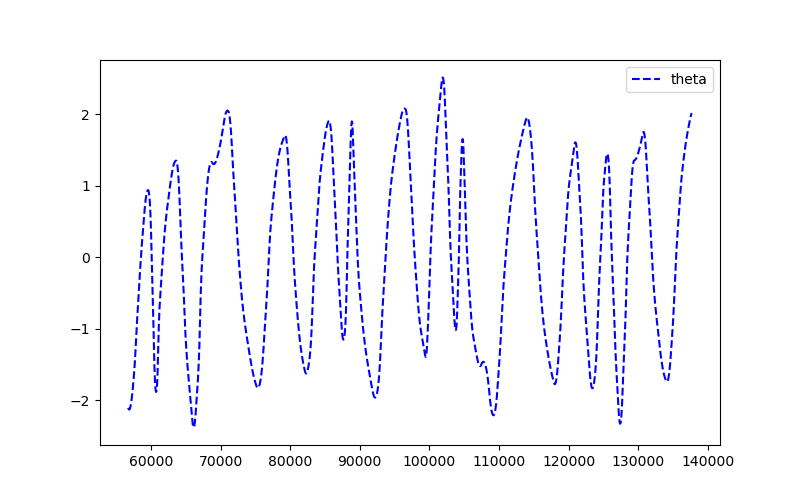

In [40]:
# Calculate the angle based on the coordinates
# river_id = '0'
river_id = '1'
tree_id = 1
x_all = rivers[river_id].x
y_all = rivers[river_id].y
x = rivers[river_id].x
y = rivers[river_id].y
c = rivers[river_id].c
s_all = rivers[river_id].s

root_node = rivers[river_id].tree_scales[tree_id]
idx_st = root_node.idx_leaf_start
idx_end = root_node.idx_leaf_end
x = x[idx_st:idx_end]
y = y[idx_st:idx_end]
c = c[idx_st:idx_end]
s_all = s_all[idx_st:idx_end]

derivatives = rivers[river_id].planimetry_derivatives
dxds = derivatives['dxds'][idx_st: idx_end]
dyds = derivatives['dyds'][idx_st: idx_end]

alpha = np.arctan(dyds/dxds)
alpha_abs = np.arctan(np.abs(dyds/dxds))
# cond = (dyds > 0) & (dxds < 0)
# alpha_abs[cond] = -alpha_abs[cond]

theta = np.arctan(dyds/dxds)
cond = (dyds > 0) & (dxds < 0)
theta[cond] = np.pi + theta[cond]
cond = (dyds < 0) & (dxds < 0)
theta[cond] = - np.pi + theta[cond]
# cond = (dyds < 0) & (dxds > 0)
# alpha_3[cond] = - alpha_3[cond]


# theta = copy.deepcopy(alpha_abs)
# cond = (dyds > 0) & (dxds < 0)
# theta[cond] = np.pi - alpha_abs[cond]
# cond = (dyds < 0) & (dxds < 0)
# theta[cond] = - np.pi + alpha_abs[cond]
# cond = (dyds < 0) & (dxds > 0)
# theta[cond] = - alpha_abs[cond]


plt.figure(figsize=(8, 5))
plt.plot(x, y, '-k')
plt.gca().set_aspect(3, adjustable='box')
plt.xticks([])
plt.yticks([])
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(s_all, c, '-k')
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(s_all, dxds, '-r')
plt.plot(s_all, dyds, '-b')
plt.show()

plt.figure(figsize=(8, 5))
# plt.plot(s_all, alpha, '-r', label='alpha')
plt.plot(s_all, theta, '--b', label='theta')
# plt.plot(s_all, alpha_3, '-.g', label='alpha_3')
plt.legend()
plt.show()



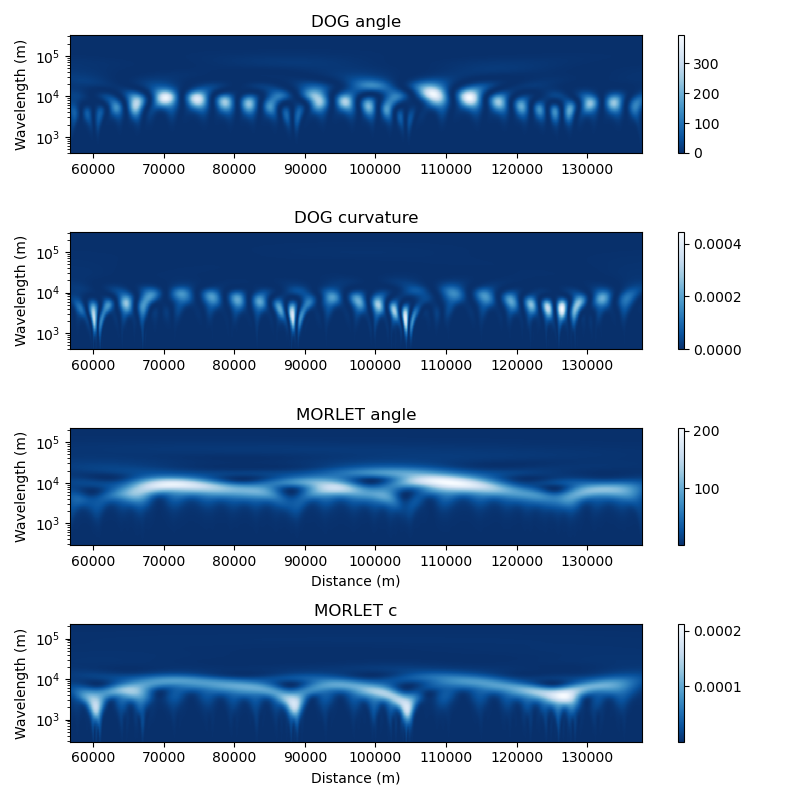

In [41]:
# Caluclate  Wavelet on angle

cwt_dog, wavelen_dog, scales_dog, gws_dog, _, coi_dog, params = WTFunc.calculate_cwt(theta, ds, mother='DOG')
power_dog = np.abs(cwt_dog)**2
cwt_morlet, wavelen_morlet, scales_morlet, gws_morlet, _, coi_morlet, params = WTFunc.calculate_cwt(theta, ds, mother='MORLET')
power_morlet = np.abs(cwt_morlet)**2

cwt_dog_c, wavelen_dog_c, scales_dog, gws_dog, _, coi_dog, params = WTFunc.calculate_cwt(c, ds, mother='DOG')
power_dog_c = np.abs(cwt_dog_c)**2
cwt_morlet_c, wavelen_morlet_c, scales_morlet, gws_morlet, _, coi_morlet, params = WTFunc.calculate_cwt(c, ds, mother='MORLET')
power_morlet_c = np.abs(cwt_morlet_c)**2

f, axs = plt.subplots(4, 1, figsize=(8, 8))
im = axs[0].pcolormesh(s_all, wavelen_dog, power_dog, shading='auto', cmap='Blues_r')
axs[0].set_yscale('log')
axs[0].set_ylim([np.min(wavelen_dog), np.max(wavelen_dog)])
axs[0].set_ylabel('Wavelength (m)')
axs[0].set_title('DOG angle')
# add colorbar
f.colorbar(im, ax=axs[0])
im = axs[1].pcolormesh(s_all, wavelen_dog_c, power_dog_c, shading='auto', cmap='Blues_r')
axs[1].set_yscale('log')
axs[1].set_ylim([np.min(wavelen_dog), np.max(wavelen_dog)])
axs[1].set_ylabel('Wavelength (m)')
axs[1].set_title('DOG curvature')
# add colorbar
f.colorbar(im, ax=axs[1])
im = axs[2].pcolormesh(s_all, wavelen_morlet, power_morlet, shading='auto', cmap='Blues_r')
axs[2].set_yscale('log')
axs[2].set_ylim([np.min(wavelen_morlet), np.max(wavelen_morlet)])
axs[2].set_ylabel('Wavelength (m)')
axs[2].set_xlabel('Distance (m)')
axs[2].set_title('MORLET angle')
# add colorbar
f.colorbar(im, ax=axs[2])
im = axs[3].pcolormesh(s_all, wavelen_morlet_c, power_morlet_c, shading='auto', cmap='Blues_r')
axs[3].set_yscale('log')
axs[3].set_ylim([np.min(wavelen_morlet), np.max(wavelen_morlet)])
axs[3].set_ylabel('Wavelength (m)')
axs[3].set_xlabel('Distance (m)')
axs[3].set_title('MORLET c')
# add colorbar
f.colorbar(im, ax=axs[3])
plt.tight_layout()
plt.show()

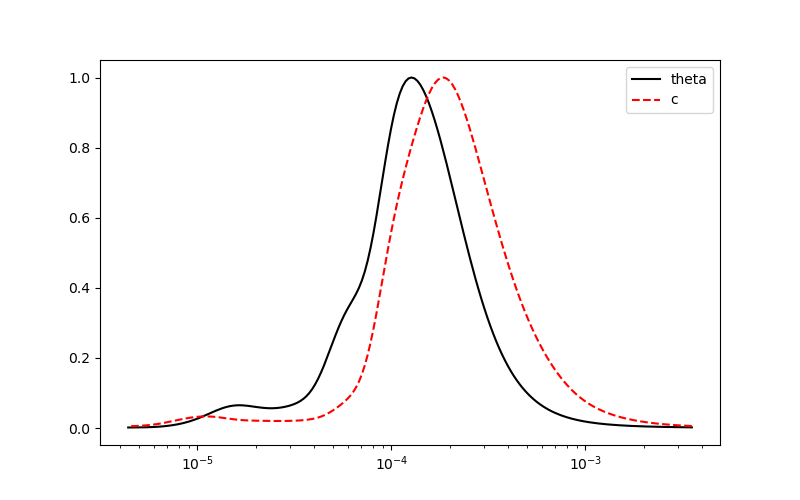

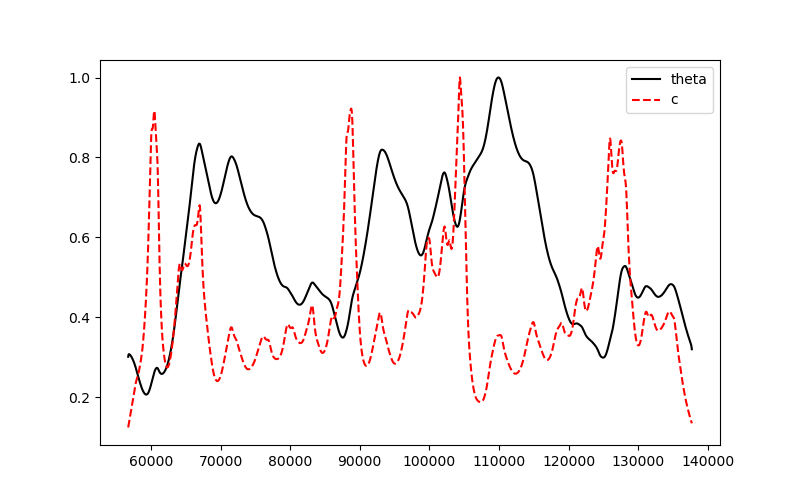

In [44]:
# Integration of the power spectrum

gws_angle = np.mean(power_morlet, axis=1)
gws_c = np.mean(power_morlet_c, axis=1)

sum_wave_angle = np.sum(power_morlet, axis=0)
sum_wave_c = np.sum(power_morlet_c, axis=0)

plt.figure(figsize=(8, 5))
plt.plot(1/wavelen_morlet, gws_angle/np.max(gws_angle), '-k', label='theta')
plt.plot(1/wavelen_morlet_c, gws_c/np.max(gws_c), '--r', label='c')
plt.gca().set_xscale('log')
plt.legend()
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(s_all, sum_wave_angle/np.max(sum_wave_angle), '-k', label='theta')
plt.plot(s_all, sum_wave_c/np.max(sum_wave_c), '--r', label='c')
plt.legend()
plt.show()


### Testing on Kinoshita Curves

2023-10-27 11:51:38,394[INFO] info: Start Logger in Rivers
2023-10-27 11:51:38,401[INFO] info: Resample calculated with `River.calculate_spline()`


0.65


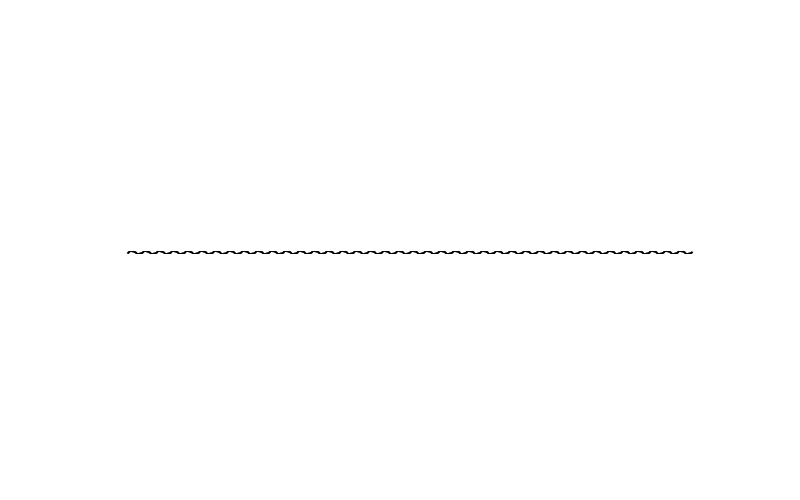

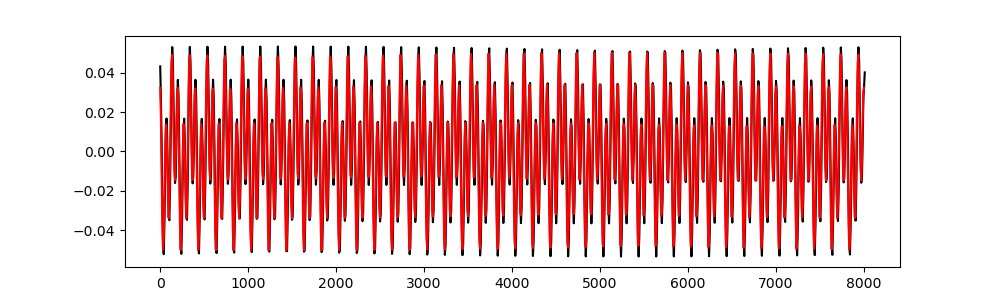

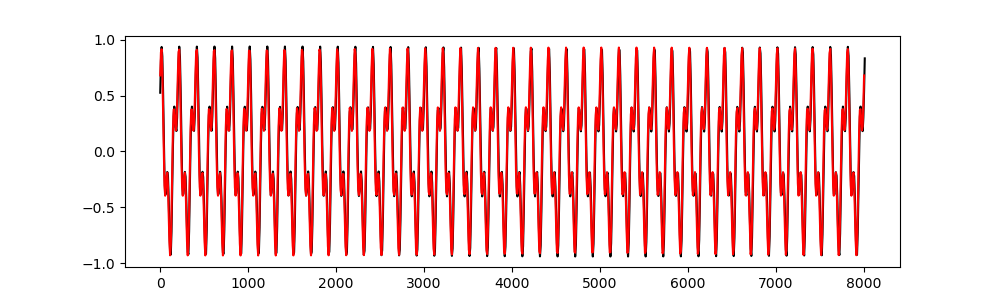

In [105]:
# Create Kinowhita Curve to test

# theta_0 = 115 * np.pi/180
# x_k, y_k, data = RF.kinoshita_curve(theta_0=1.65, lambda_value=500, j_s=0.344, j_f=0.031, n=2)
# theta_1 = 90 * np.pi/180
theta_1 = 0.65
print(theta_1)
x_k, y_k, data = RF.kinoshita_curve_zolezzi(
    theta_1=theta_1, lambda_value=200, theta_s=0.344, theta_f=0.031, n=40)

c_original = -data['c']
s_original = data['s']
theta_original = data['theta']*np.pi/180

w_m = np.ones_like(x_k)


# Create River Object
rivers_k = Rivers(logger=logger)
rivers_k.add_river('0', x_k, y_k, w_m=w_m, resample_flag=True,
                   kwargs_resample={}, scale_by_width=False)

# Calculate curvature
rivers_k['0'].calculate_curvature()

x_k = rivers_k['0'].x
y_k = rivers_k['0'].y
s_k = rivers_k['0'].s
c = rivers_k['0'].c
derivatives = rivers_k['0'].planimetry_derivatives
dxds = derivatives['dxds']
dyds = derivatives['dyds']

theta = np.arctan(dyds/dxds)
cond = (dyds > 0) & (dxds < 0)
theta[cond] = np.pi + theta[cond]
cond = (dyds < 0) & (dxds < 0)
theta[cond] = - np.pi + theta[cond]

plt.close('all')
plt.figure(figsize=(8, 5))
plt.plot(x_k, y_k, '-k')
plt.gca().set_aspect('equal', adjustable='box')
plt.xticks([])
plt.yticks([])
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.show()

plt.figure(figsize=(10, 3))
plt.plot(s_k, c, '-k')
plt.plot(s_original, c_original, '-r')
plt.show()

plt.figure(figsize=(10, 3))
plt.plot(s_k, theta, '-k')
plt.plot(s_original, theta_original, '-r')
plt.show()

In [159]:
ds = np.diff(s_k)[0]
cwt_dog, wavelen_dog, scales_dog, gws_dog, _, coi_dog, params = WTFunc.calculate_cwt(theta, ds, mother='DOG')
power_dog = np.abs(cwt_dog)**2
cwt_morlet, wavelen_morlet, scales_morlet, gws_morlet, _, coi_morlet, params = WTFunc.calculate_cwt(theta, ds, mother='MORLET')
power_morlet = np.abs(cwt_morlet)**2

cwt_dog_c, wavelen_dog_c, scales_dog, gws_dog, _, coi_dog, params = WTFunc.calculate_cwt(c, ds, mother='DOG')
power_dog_c = np.abs(cwt_dog_c)**2
cwt_morlet_c, wavelen_morlet_c, scales_morlet, gws_morlet, _, coi_morlet, params = WTFunc.calculate_cwt(c, ds, mother='MORLET')
power_morlet_c = np.abs(cwt_morlet_c)**2

f, axs = plt.subplots(4, 1, figsize=(8, 8))
im = axs[0].pcolormesh(s_k, wavelen_dog, power_dog, shading='auto', cmap='Blues_r')
axs[0].set_yscale('log')
axs[0].set_ylim([np.min(wavelen_dog), np.max(wavelen_dog)])
axs[0].set_ylabel('Wavelength (m)')
axs[0].set_title('DOG angle')
# add colorbar
f.colorbar(im, ax=axs[0])
im = axs[1].pcolormesh(s_k, wavelen_dog_c, power_dog_c, shading='auto', cmap='Blues_r')
axs[1].set_yscale('log')
axs[1].set_ylim([np.min(wavelen_dog), np.max(wavelen_dog)])
axs[1].set_ylabel('Wavelength (m)')
axs[1].set_title('DOG curvature')
# add colorbar
f.colorbar(im, ax=axs[1])
im = axs[2].pcolormesh(s_k, wavelen_morlet, power_morlet, shading='auto', cmap='Blues_r')
axs[2].set_yscale('log')
axs[2].set_ylim([np.min(wavelen_morlet), np.max(wavelen_morlet)])
axs[2].set_ylabel('Wavelength (m)')
axs[2].set_xlabel('Distance (m)')
axs[2].set_title('MORLET angle')
# add colorbar
f.colorbar(im, ax=axs[2])
im = axs[3].pcolormesh(s_k, wavelen_morlet_c, power_morlet_c, shading='auto', cmap='Blues_r')
axs[3].set_yscale('log')
axs[3].set_ylim([np.min(wavelen_morlet), np.max(wavelen_morlet)])
axs[3].set_ylabel('Wavelength (m)')
axs[3].set_xlabel('Distance (m)')
axs[3].set_title('MORLET c')
# add colorbar
f.colorbar(im, ax=axs[3])
plt.tight_layout()
plt.show()


KeyboardInterrupt: 

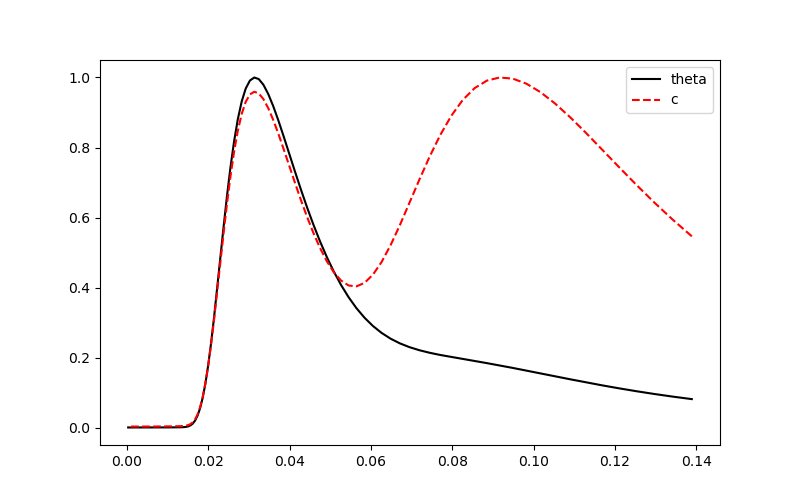

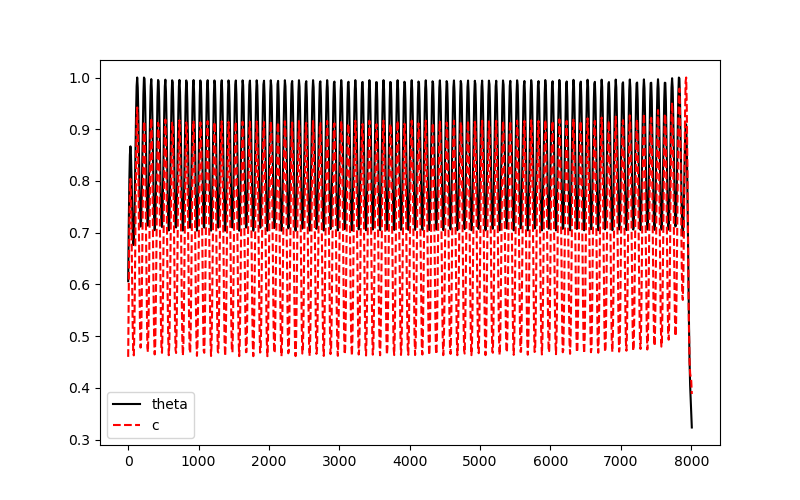

In [107]:
gws_angle = np.mean(power_morlet, axis=1)
gws_c = np.mean(power_morlet_c, axis=1)

sum_wave_angle = np.sum(power_morlet, axis=0)
sum_wave_c = np.sum(power_morlet_c, axis=0)

plt.figure(figsize=(8, 5))
plt.plot(2*np.pi/wavelen_morlet, gws_angle/np.max(gws_angle), '-k', label='theta')
plt.plot(2*np.pi/wavelen_morlet_c, gws_c/np.max(gws_c), '--r', label='c')
# plt.gca().set_xscale('log')
plt.legend()
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(s_k, sum_wave_angle/np.max(sum_wave_angle), '-k', label='theta')
plt.plot(s_k, sum_wave_c/np.max(sum_wave_c), '--r', label='c')
plt.legend()
plt.show()


In [179]:
# Function to explore kinoshita meanders

def explore_kinoshita(theta_1, lambda_value, theta_s, theta_f, n,
                      plot_flag=False):
    x_k, y_k, data = RF.kinoshita_curve_zolezzi(
        theta_1=theta_1, lambda_value=lambda_value, theta_s=theta_s,
        theta_f=theta_f, n=n)

    c_original = -data['c']
    s_original = data['s']
    theta_original = data['theta']*np.pi/180

    w_m = np.ones_like(x_k)

    # Create River Object
    rivers_k = Rivers(logger=logger)
    rivers_k.add_river('0', x_k, y_k, w_m=w_m, resample_flag=True,
                       kwargs_resample={}, scale_by_width=False)

    # Calculate curvature
    rivers_k['0'].calculate_curvature()

    x_k = rivers_k['0'].x
    y_k = rivers_k['0'].y
    s_k = rivers_k['0'].s
    c = rivers_k['0'].c
    derivatives = rivers_k['0'].planimetry_derivatives
    dxds = derivatives['dxds']
    dyds = derivatives['dyds']

    theta = np.arctan(dyds/dxds)
    cond = (dyds > 0) & (dxds < 0)
    theta[cond] = np.pi + theta[cond]
    cond = (dyds < 0) & (dxds < 0)
    theta[cond] = - np.pi + theta[cond]
    ds = np.diff(s_k)[0]

    # Characterize wavelets
    cwt_morlet_c, wavelen_morlet_c, scales_morlet, gws_morlet, _, coi_morlet,\
        params = WTFunc.calculate_cwt(c, ds, mother='MORLET')
    # Correct power by cone of influence
    for col in range(cwt_morlet_c.shape[1]):
        cond = (wavelen_morlet_c[:] > coi_morlet[col])
        cwt_morlet_c[cond, col] = np.nan
        
    power_morlet_c = np.abs(cwt_morlet_c)**2
    cwt_morlet, wavelen_morlet, scales_morlet, gws_morlet, _, coi_morlet,\
        params = WTFunc.calculate_cwt(theta, ds, mother='MORLET')
    # Correct power by cone of influence
    for col in range(cwt_morlet_c.shape[1]):
        cond = (wavelen_morlet[:] > coi_morlet[col])
        cwt_morlet[cond, col] = np.nan
    power_morlet = np.abs(cwt_morlet)**2
    
    gws_angle = np.nanmean(power_morlet, axis=1)
    gws_c = np.nanmean(power_morlet_c, axis=1)

    sum_wave_angle = np.sum(power_morlet, axis=0)
    sum_wave_c = np.sum(power_morlet_c, axis=0)

    results = {
        'rivers': rivers_k,
        's': s_k,
        'c': c,
        'theta': theta,
        'cwt_morlet_angle': cwt_morlet,
        'power_morlet_angle': power_morlet,
        'wavelen_morlet_angle': wavelen_morlet,
        'gws_angle': gws_angle,
        'sum_wave_angle': sum_wave_angle,
        'cwt_morlet_c': cwt_morlet_c,
        'power_morlet_c': power_morlet_c,
        'wavelen_morlet_c': wavelen_morlet_c,
        'gws_c': gws_c,
        'sum_wave_c': sum_wave_c,
    }

    return results


def plot_spectrum(idx, results, titles):
    plt.figure(figsize=(8, 5))
    plt.title(f'Angle, {titles[idx]}')
    plt.pcolormesh(results['s'][idx], results['wavelen_morlet_angle'][idx],
                results['power_morlet_angle'][idx], shading='auto',
                cmap='Blues_r')
    plt.gca().set_yscale('log')
    plt.xlabel('Distance (m)')
    plt.ylabel('Wavelength (m)')
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.title(f'Curvature, {titles[idx]}')
    plt.pcolormesh(results['s'][idx], results['wavelen_morlet_c'][idx],
                results['power_morlet_c'][idx], shading='auto',
                cmap='Blues_r')
    plt.gca().set_yscale('log')
    plt.xlabel('Distance (m)')
    plt.ylabel('Wavelength (m)')
    plt.show()
    return


2023-10-27 14:42:36,882[INFO] info: Start Logger in Rivers
2023-10-27 14:42:36,889[INFO] info: Resample calculated with `River.calculate_spline()`
/var/folders/95/jkdklw890b3f8qkmywrwkj280000gq/T/ipykernel_15739/1048273103.py:55: RuntimeWarning: Mean of empty slice
  gws_angle = np.nanmean(power_morlet, axis=1)
/var/folders/95/jkdklw890b3f8qkmywrwkj280000gq/T/ipykernel_15739/1048273103.py:56: RuntimeWarning: Mean of empty slice
  gws_c = np.nanmean(power_morlet_c, axis=1)
2023-10-27 14:42:36,953[INFO] info: Start Logger in Rivers
2023-10-27 14:42:36,958[INFO] info: Resample calculated with `River.calculate_spline()`


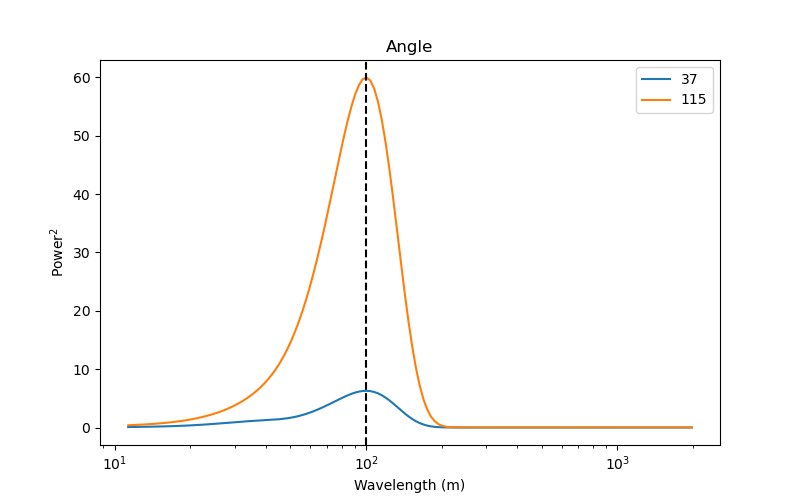

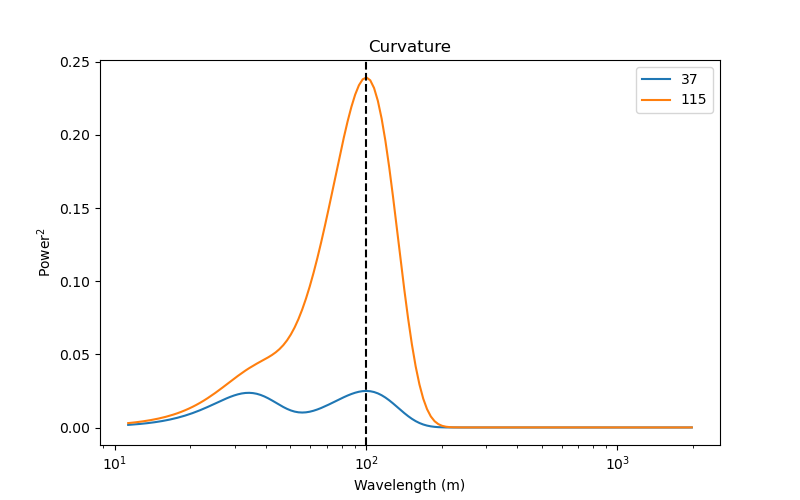

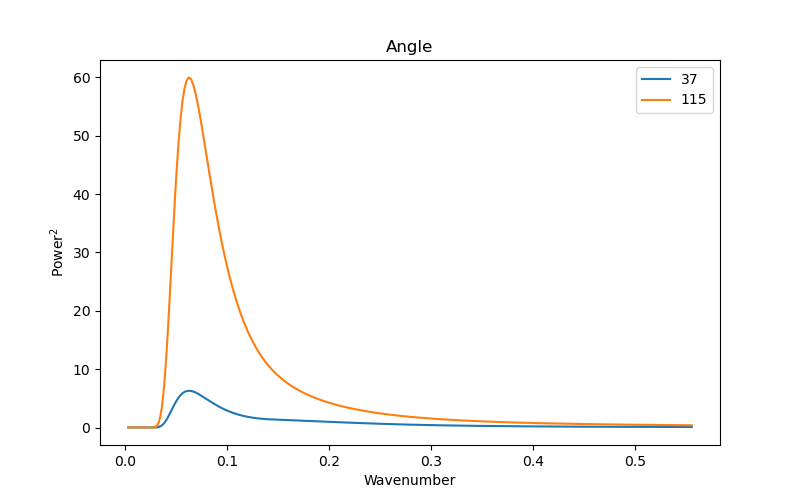

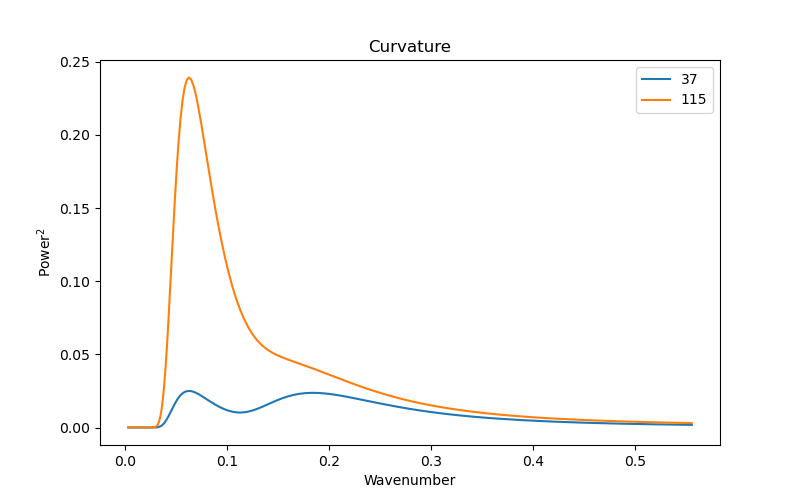

In [180]:
# -------------------------------
# Explore a handful of meanders
# -------------------------------
# Vary theta
# theta_1 = [37.24, 30, 60, 90, 115, 120]
theta_1 = [37.24, 115]
theta_s = 0.344
theta_f = 0.031
# theta_f = 0.31
# theta_f = 0
# theta_s = 0
lambda_value = 100
n = 20
variables = ['rivers', 's', 'c', 'theta', 'cwt_morlet_angle',
             'power_morlet_angle', 'wavelen_morlet_angle', 'gws_angle',
             'sum_wave_angle', 'cwt_morlet_c', 'power_morlet_c',
             'wavelen_morlet_c', 'gws_c', 'sum_wave_c']

results_theta_1 = {i: [] for i in variables}

for i in range(len(theta_1)):
    result = explore_kinoshita(
        theta_1[i]*np.pi/180, lambda_value, theta_s, theta_f, n)
    for var in variables:
        results_theta_1[var].append(result[var])

plt.close('all')
plt.figure(figsize=(8, 5))
plt.title('Angle')
for i in range(len(theta_1)):
    plt.plot(results_theta_1['wavelen_morlet_angle'][i],
             results_theta_1['gws_angle'][i],
             label=f'{theta_1[i]:.0f}')
plt.xlabel('Wavelength (m)')
plt.ylabel('Power$^2$')
plt.axvline(lambda_value, color='k', linestyle='--')
plt.gca().set_xscale('log')
plt.legend()
plt.show()

plt.figure(figsize=(8, 5))
plt.title('Curvature')
for i in range(len(theta_1)):
    plt.plot(results_theta_1['wavelen_morlet_c'][i],
             results_theta_1['gws_c'][i],
             label=f'{theta_1[i]:.0f}')
plt.xlabel('Wavelength (m)')
plt.axvline(lambda_value, color='k', linestyle='--')
plt.ylabel('Power$^2$')
plt.gca().set_xscale('log')
plt.legend()
plt.show()

plt.figure(figsize=(8, 5))
plt.title('Angle')
for i in range(len(theta_1)):
    plt.plot(2*np.pi/results_theta_1['wavelen_morlet_angle'][i],
             results_theta_1['gws_angle'][i],
             label=f'{theta_1[i]:.0f}')
plt.xlabel('Wavenumber')
plt.ylabel('Power$^2$')
plt.legend()
plt.show()

plt.figure(figsize=(8, 5))
plt.title('Curvature')
for i in range(len(theta_1)):
    plt.plot(2*np.pi/results_theta_1['wavelen_morlet_c'][i],
             results_theta_1['gws_c'][i],
             label=f'{theta_1[i]:.0f}')
plt.xlabel('Wavenumber')
plt.ylabel('Power$^2$')
plt.legend()
plt.show()

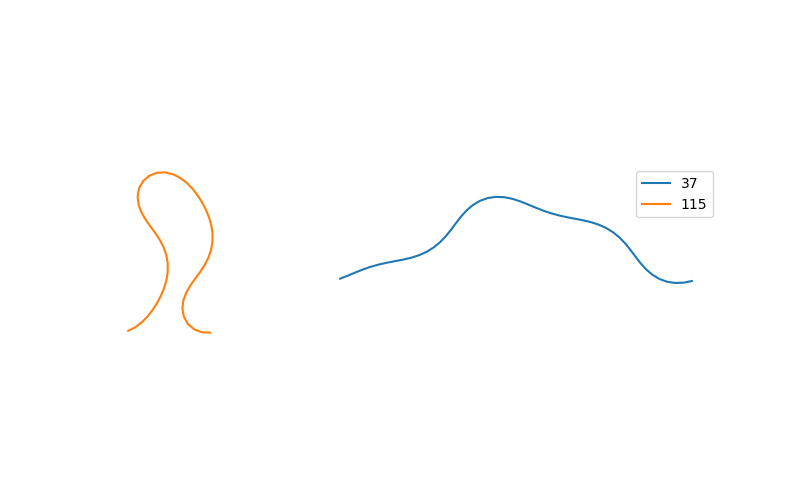

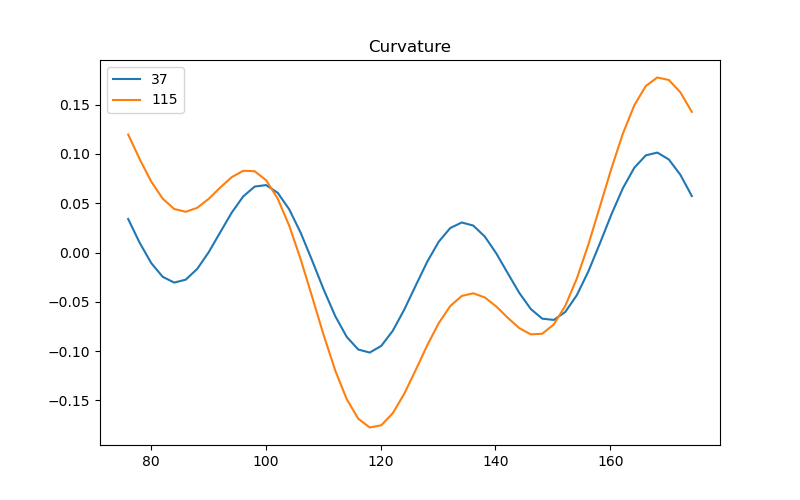

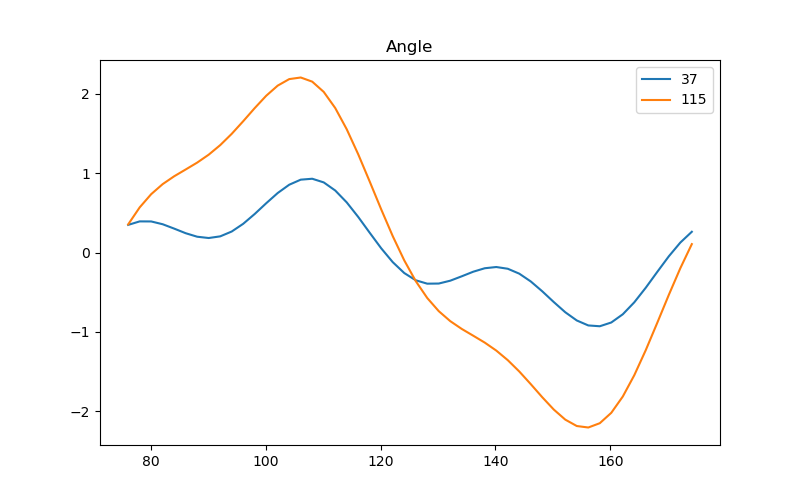

In [182]:
fraction = 0.75
results_theta_1['s'] = np.array(results_theta_1['s'])
in_meander = (results_theta_1['s'] > fraction*lambda_value) & (results_theta_1['s'] <(fraction + 1)*lambda_value)

plt.figure(figsize=(8, 5))
for i in range(len(theta_1)):
    plt.plot(results_theta_1['rivers'][i]['0'].x[in_meander[i]],
             results_theta_1['rivers'][i]['0'].y[in_meander[i]],
             label=f'{theta_1[i]:.0f}')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.xticks([])
    plt.yticks([])
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['bottom'].set_visible(False)
    plt.gca().spines['left'].set_visible(False)

plt.legend()
plt.show()

plt.figure(figsize=(8, 5))
plt.title('Curvature')
for i in range(len(theta_1)):
    plt.plot(results_theta_1['rivers'][i]['0'].s[in_meander[i]],
             results_theta_1['rivers'][i]['0'].c[in_meander[i]],
             label=f'{theta_1[i]:.0f}')
plt.legend()
plt.show()

plt.figure(figsize=(8, 5))
plt.title('Angle')
for i in range(len(theta_1)):
    plt.plot(results_theta_1['rivers'][i]['0'].s[in_meander[i]],
             results_theta_1['theta'][i][in_meander[i]],
             label=f'{theta_1[i]:.0f}')
plt.legend()
plt.show()


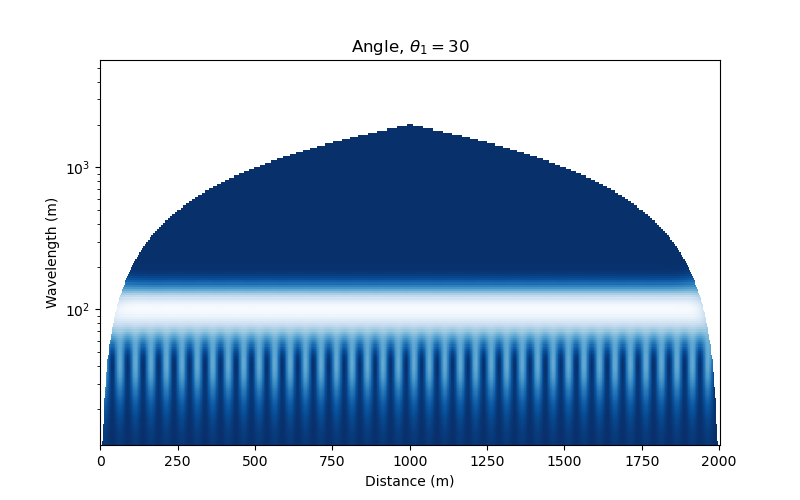

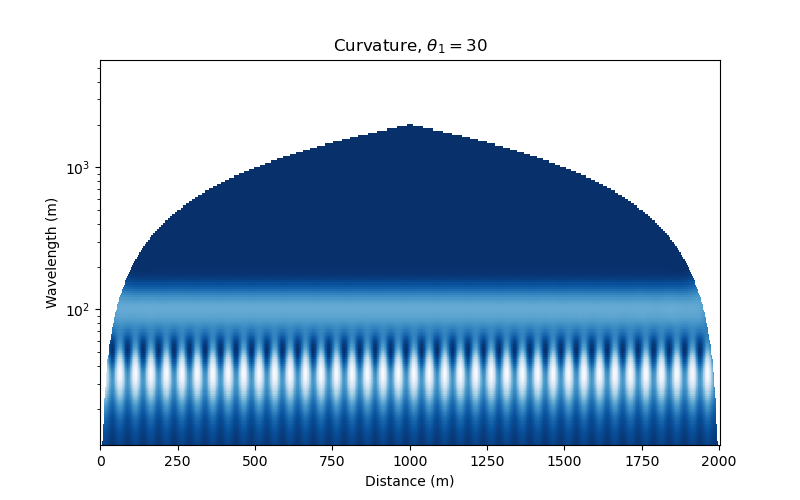

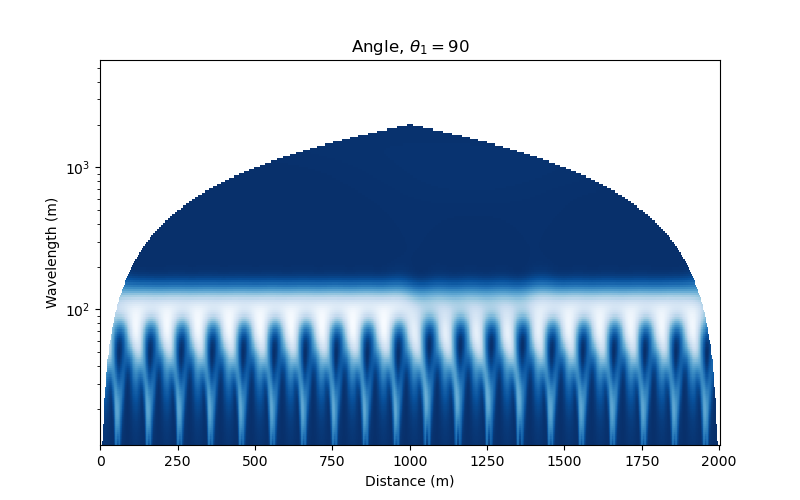

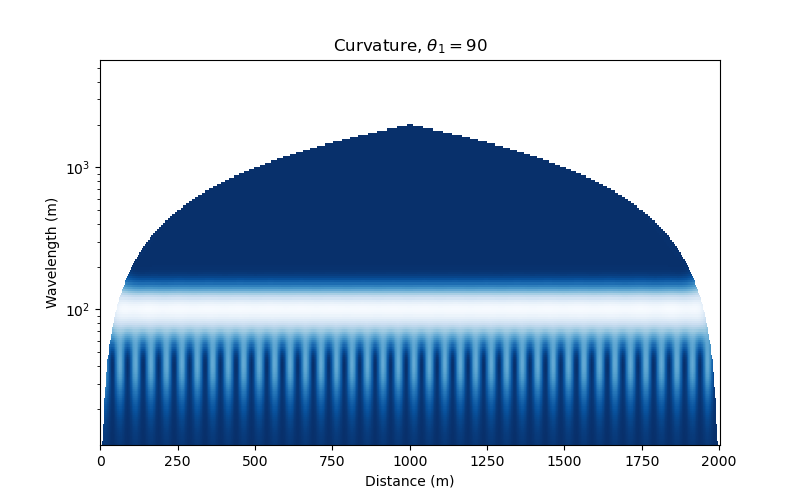

In [168]:
# Look at the power spectrums
theta_1_v = 30
idx = theta_1.index(theta_1_v)
titles = [f'$\\theta_1={theta_1[i]}$' for i in range(len(theta_1))]
plot_spectrum(idx, results_theta_1, titles)

theta_1_v = 90
idx = theta_1.index(theta_1_v)
titles = [f'$\\theta_1={theta_1[i]}$' for i in range(len(theta_1))]
plot_spectrum(idx, results_theta_1, titles)



2023-10-27 13:55:54,644[INFO] info: Start Logger in Rivers
2023-10-27 13:55:54,650[INFO] info: Resample calculated with `River.calculate_spline()`
2023-10-27 13:55:54,709[INFO] info: Start Logger in Rivers
2023-10-27 13:55:54,714[INFO] info: Resample calculated with `River.calculate_spline()`
2023-10-27 13:55:54,767[INFO] info: Start Logger in Rivers
2023-10-27 13:55:54,771[INFO] info: Resample calculated with `River.calculate_spline()`
2023-10-27 13:55:54,828[INFO] info: Start Logger in Rivers
2023-10-27 13:55:54,833[INFO] info: Resample calculated with `River.calculate_spline()`
2023-10-27 13:55:54,887[INFO] info: Start Logger in Rivers
2023-10-27 13:55:54,891[INFO] info: Resample calculated with `River.calculate_spline()`


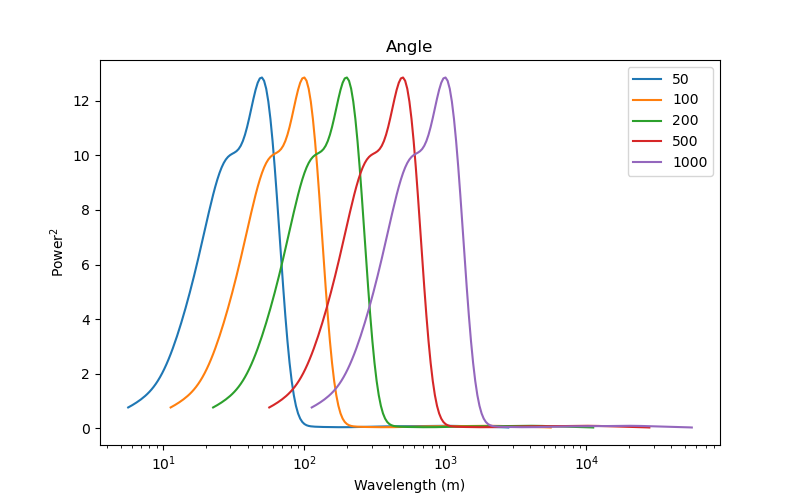

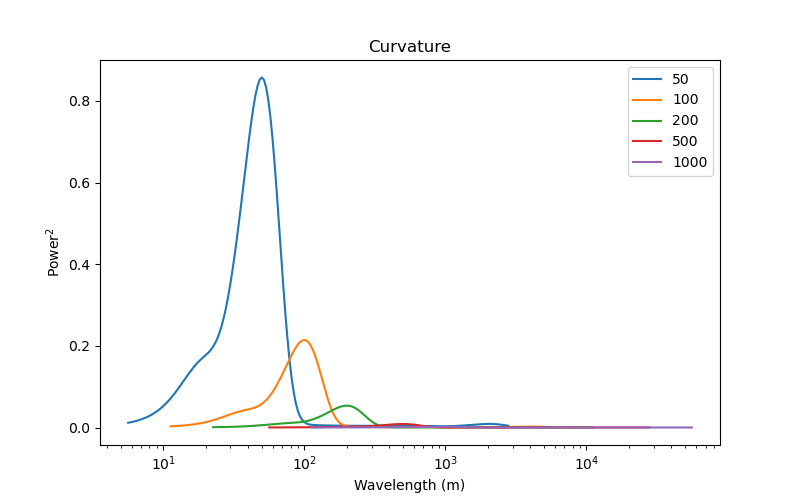

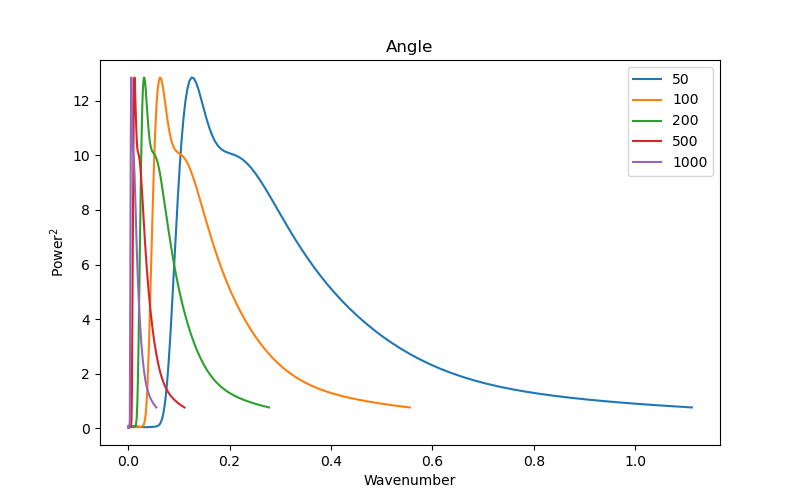

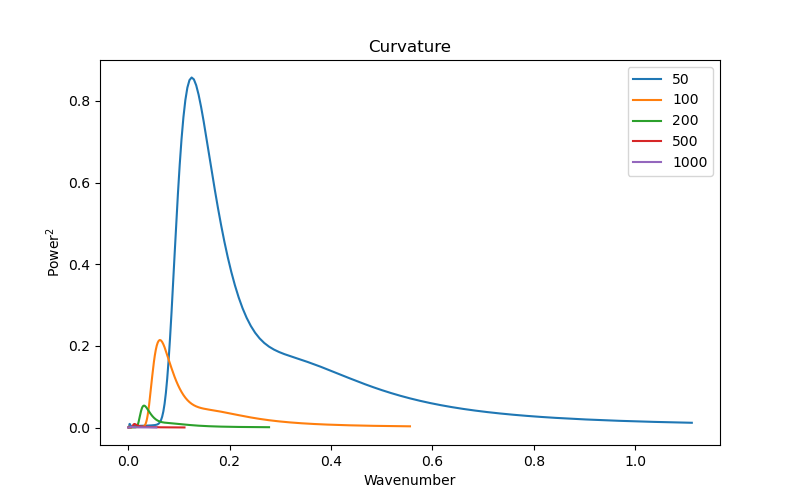

In [136]:
# Vary lambda
theta_1 = 110
theta_s = 0.344
theta_f = 0.031
lambda_value = [50, 100, 200, 500, 1000]
n = 20
variables = ['rivers', 's', 'c', 'theta', 'cwt_morlet_angle',
             'power_morlet_angle', 'wavelen_morlet_angle', 'gws_angle',
             'sum_wave_angle', 'cwt_morlet_c', 'power_morlet_c',
             'wavelen_morlet_c', 'gws_c', 'sum_wave_c']

results_lambda = {i: [] for i in variables}

for i in range(len(lambda_value)):
    result = explore_kinoshita(
        theta_1*np.pi/180, lambda_value[i], theta_s, theta_f, n)
    for var in variables:
        results_lambda[var].append(result[var])

plt.close('all')
plt.figure(figsize=(8, 5))
plt.title('Angle')
for i in range(len(lambda_value)):
    plt.plot(results_lambda['wavelen_morlet_angle'][i],
             results_lambda['gws_angle'][i],
             label=f'{lambda_value[i]:.0f}')
plt.xlabel('Wavelength (m)')
plt.ylabel('Power$^2$')
plt.gca().set_xscale('log')
plt.legend()
plt.show()

plt.figure(figsize=(8, 5))
plt.title('Curvature')
for i in range(len(lambda_value)):
    plt.plot(results_lambda['wavelen_morlet_c'][i],
             results_lambda['gws_c'][i],
             label=f'{lambda_value[i]:.0f}')
plt.xlabel('Wavelength (m)')
plt.ylabel('Power$^2$')
plt.gca().set_xscale('log')
plt.legend()
plt.show()

plt.figure(figsize=(8, 5))
plt.title('Angle')
for i in range(len(lambda_value)):
    plt.plot(2*np.pi/results_lambda['wavelen_morlet_angle'][i],
             results_lambda['gws_angle'][i],
             label=f'{lambda_value[i]:.0f}')
plt.xlabel('Wavenumber')
plt.ylabel('Power$^2$')
plt.legend()
plt.show()

plt.figure(figsize=(8, 5))
plt.title('Curvature')
for i in range(len(lambda_value)):
    plt.plot(2*np.pi/results_lambda['wavelen_morlet_c'][i],
             results_lambda['gws_c'][i],
             label=f'{lambda_value[i]:.0f}')
plt.xlabel('Wavenumber')
plt.ylabel('Power$^2$')
plt.legend()
plt.show()


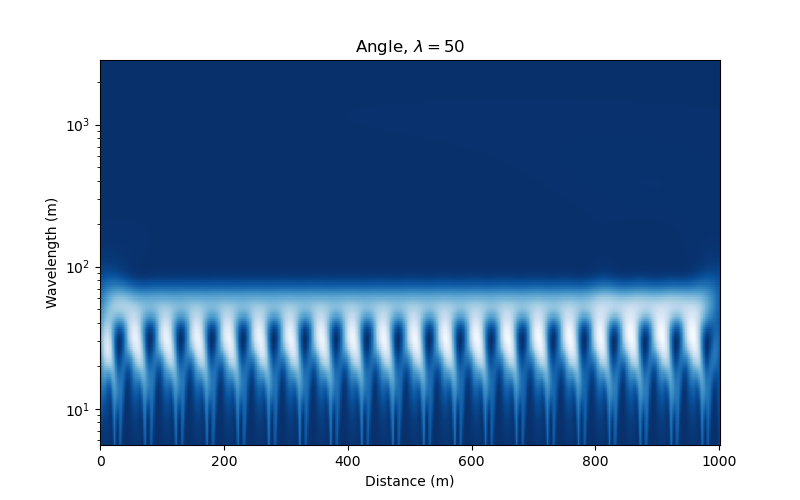

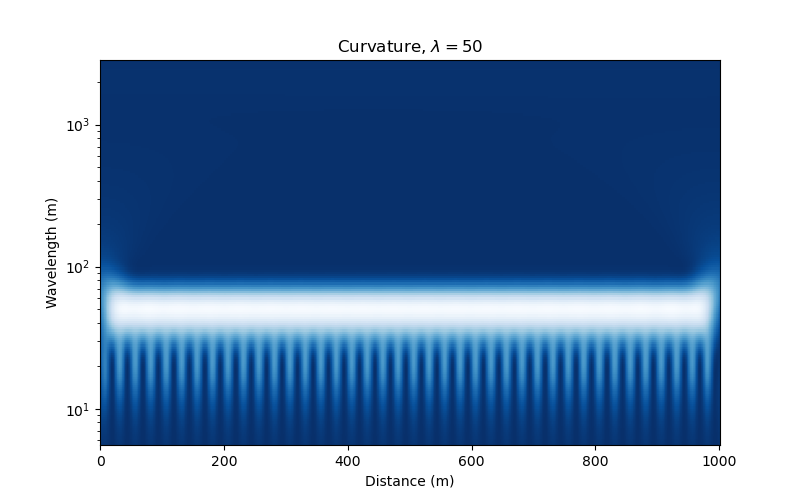

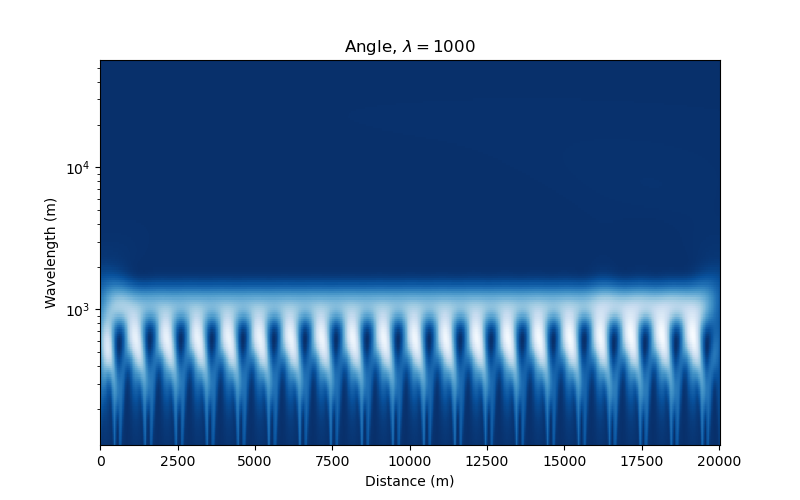

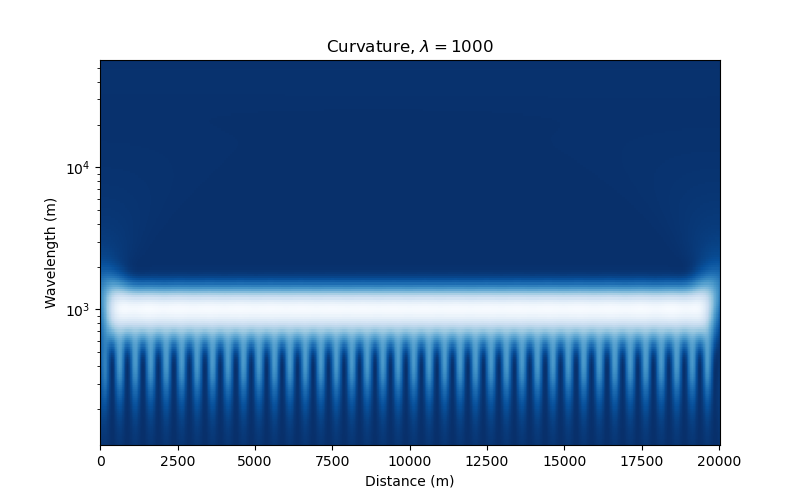

In [138]:
# Look at the power spectrums
lambda_v = 50
idx = lambda_value.index(lambda_v)
titles = [f'$\\lambda={lambda_value[i]}$' for i in range(len(lambda_value))]
plot_spectrum(idx, results_lambda, titles)

lambda_v = 1000
idx = lambda_value.index(lambda_v)
plot_spectrum(idx, results_lambda, titles)

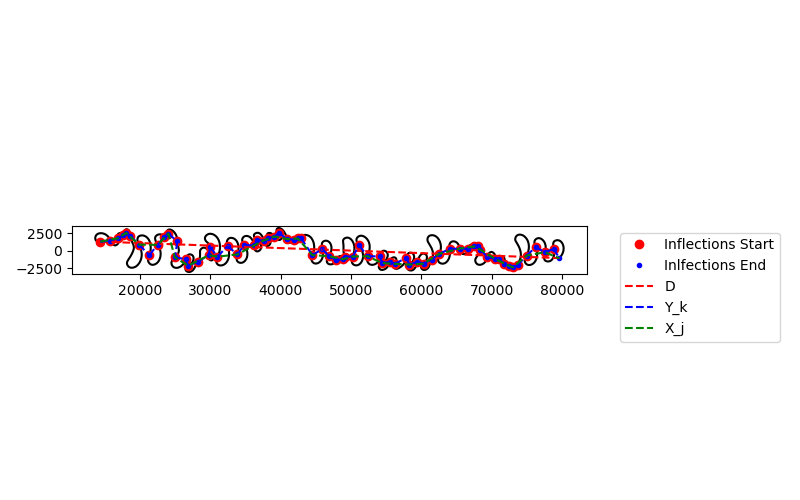

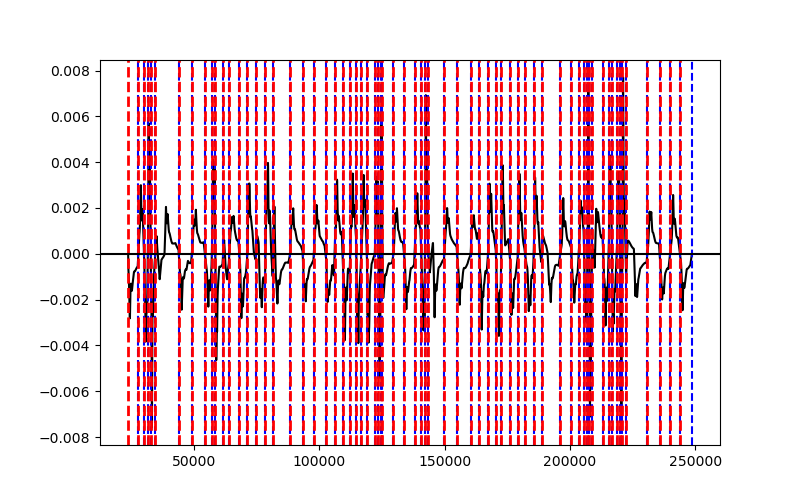

In [51]:
# Plot tree with inflection points
river_id = '2'
# river_id = '3'
tree_id = 1
x_all = rivers[river_id].x
y_all = rivers[river_id].y
x = rivers[river_id].x
y = rivers[river_id].y
c = rivers[river_id].c
s_all = rivers[river_id].s
root_node = rivers[river_id].tree_scales[tree_id]
idx_st = root_node.idx_leaf_start
idx_end = root_node.idx_leaf_end
x = x[idx_st:idx_end]
y = y[idx_st:idx_end]
c = c[idx_st:idx_end]
s = s_all[idx_st:idx_end]
# database = rivers[river_id].tree_scales_database_meanders
# subdatabase = database[database['tree_id'] == tree_id]
# idx_inf_start = subdatabase['idx_planimetry_start'].values
# idx_inf_end = subdatabase['idx_planimetry_end'].values
database = rivers[river_id].database
subdatabase = database[database['tree_id'] == tree_id]
x_inf_start = subdatabase['x_start'].values
x_inf_end = subdatabase['x_end'].values
y_inf_start = subdatabase['y_start'].values
y_inf_end = subdatabase['y_end'].values
s_inf_start = subdatabase['s_start'].values
s_inf_end = subdatabase['s_end'].values

# Get lines for metrics
# Starting and ending point
d = np.array([[x[0], y[0]], [x[-1], y[-1]]])
# Hal-meander distance Y_k
# y_k = np.array([[x_all[idx_inf_start], y_all[idx_inf_start]],
#                 [x_all[idx_inf_end], y_all[idx_inf_end]]])
y_k = np.array([[x_inf_start, y_inf_start],
                [x_inf_end, y_inf_end]])
# Full meander distance X_j
n = subdatabase.shape[0]
i_start = np.arange(0, n - 1, 2)

subset_database = rivers[river_id].database[rivers[river_id].database['tree_id'] == tree_id]
x_f_m = subset_database['x_start'].values[i_start]
y_f_m = subset_database['y_start'].values[i_start]
x_f_m = np.hstack((x_f_m, subset_database['x_end'].values[-1]))
y_f_m = np.hstack((y_f_m, subset_database['y_end'].values[-1]))
x_j = np.array([x_f_m, y_f_m]).T


utl.cr_folder('synthetic_rivers/results/closer_look/')
# plot
plt.close('all')
plt.figure(figsize=(8, 5))
plt.plot(x, y, '-k')
# plot inflection points
plt.plot(x_inf_start, y_inf_start, 'or', label='Inflections Start')
plt.plot(x_inf_end, y_inf_end, '.b', label='Inlfections End')
# plot D
plt.plot(d[:, 0], d[:, 1], '--r', label='D')
# plot y_k
plt.plot([y_k[0, 0, 0], y_k[1, 0, 0]], [y_k[0, 1, 0], y_k[1, 1, 0]], '--b', label='Y_k')
plt.plot(y_k[:, 0], y_k[:, 1], '--b')
# plot x_j
plt.plot(x_j[:, 0], x_j[:, 1], '--g', label='X_j')
plt.gca().set_aspect('equal', adjustable='box')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig(
    f'synthetic_rivers/results/closer_look/river_{river_id}_tree_{tree_id}_inflections.png',
    dpi=300)

plt.show()

# plot curvature
plt.figure(figsize=(8, 5))
plt.plot(s, c, '-k')
# plot inflection points
for i in range(len(s_inf_start)):
    plt.axvline(s_inf_start[i], color='r', linestyle='--', label='Inflections Start',
                linewidth=2)
    plt.axvline(s_inf_end[i], color='b', linestyle='--', label='Inlfections End')
plt.axhline(0, color='k', linestyle='-')
plt.savefig(
    f'synthetic_rivers/results/closer_look/c_{river_id}_tree_{tree_id}_inflections.png',
    dpi=300)
plt.show()


# plt.figure(figsize=(8, 5))
# plt.plot(x, y, '-k')
# # plot inflection points
# plt.plot(x_all[idx_inf_start], y_all[idx_inf_start], 'or', label='Inflections Start')
# plt.plot(x_all[idx_inf_end], y_all[idx_inf_end], '.b', label='Inlfections End')

# plt.gca().set_aspect('equal', adjustable='box')
# # remove axis
# plt.xticks([])
# plt.yticks([])
# # Remove axis lines
# plt.gca().spines['top'].set_visible(False)
# plt.gca().spines['right'].set_visible(False)
# plt.gca().spines['bottom'].set_visible(False)
# plt.gca().spines['left'].set_visible(False)
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.savefig(
#     f'synthetic_rivers/results/closer_look/river_{river_id}_tree_{tree_id}_inflections_clean.png',
#             dpi=300)

# plt.show()


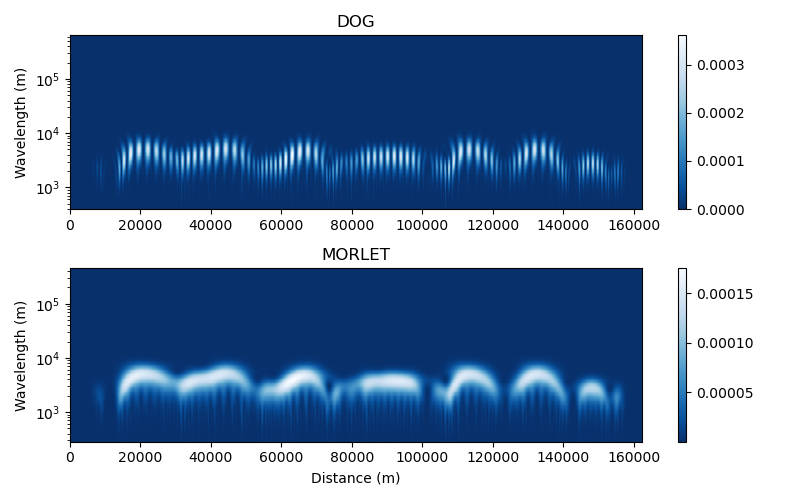

In [6]:
river_id = '0'
river = copy.deepcopy(rivers[river_id])

c = river.c
s = river.s
ds = np.diff(s)[0]

cwt_dog, wavelen_dog, scales_dog, gws_dog, _, coi_dog, params = WTFunc.calculate_cwt(c, ds, mother='DOG')
power_dog = np.abs(cwt_dog)**2
cwt_morlet, wavelen_morlet, scales_morlet, gws_morlet, _, coi_morlet, params = WTFunc.calculate_cwt(c, ds, mother='MORLET')
power_morlet = np.abs(cwt_morlet)**2

f, axs = plt.subplots(2, 1, figsize=(8, 5))
im = axs[0].pcolormesh(s, wavelen_dog, power_dog, shading='auto', cmap='Blues_r')
axs[0].set_yscale('log')
axs[0].set_ylim([np.min(wavelen_dog), np.max(wavelen_dog)])
axs[0].set_ylabel('Wavelength (m)')
axs[0].set_title('DOG')
# add colorbar
f.colorbar(im, ax=axs[0])

im = axs[1].pcolormesh(s, wavelen_morlet, power_morlet, shading='auto', cmap='Blues_r')
axs[1].set_yscale('log')
axs[1].set_ylim([np.min(wavelen_morlet), np.max(wavelen_morlet)])
axs[1].set_ylabel('Wavelength (m)')
axs[1].set_xlabel('Distance (m)')
axs[1].set_title('MORLET')
# add colorbar
f.colorbar(im, ax=axs[1])
plt.tight_layout()
plt.show()

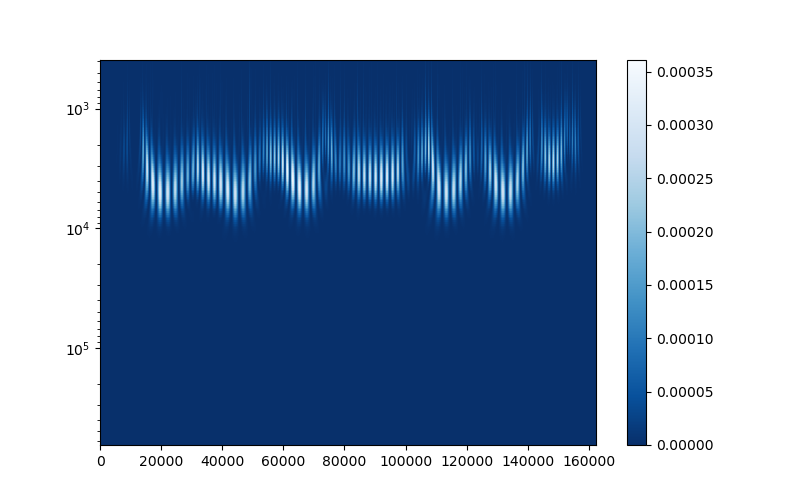

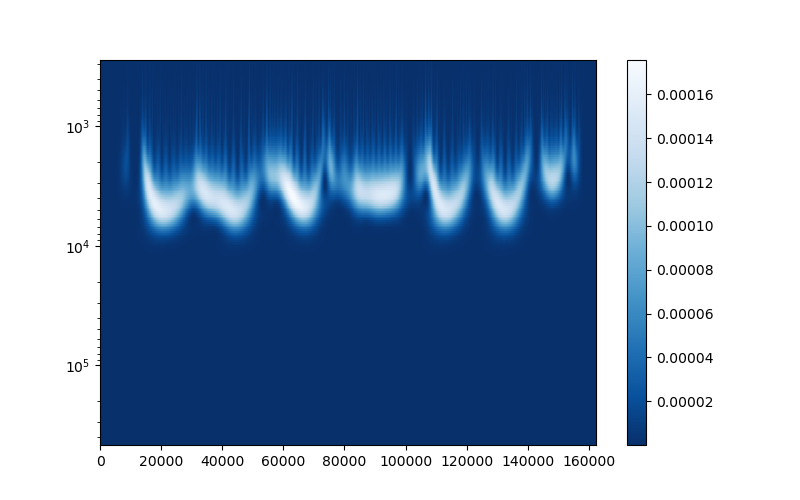

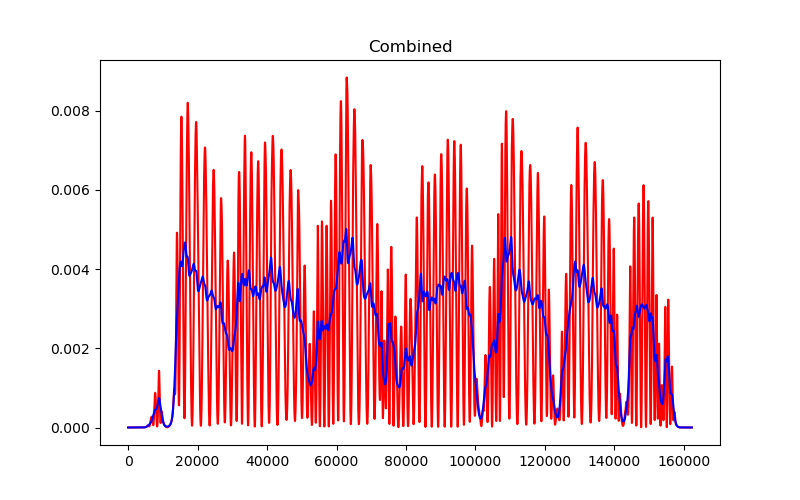

In [18]:

# Check morlet separation
wave_sum_dog = np.sum(power_dog, axis=0)
wave_sum_morlet = np.sum(power_morlet, axis=0)
plt.close('all')
plt.figure(figsize=(8, 5))
plt.pcolormesh(s, wavelen_dog, power_dog, shading='auto', cmap='Blues_r')
plt.gca().invert_yaxis()
plt.gca().set_yscale('log')
plt.colorbar()
plt.show()

plt.figure(figsize=(8, 5))
plt.pcolormesh(s, wavelen_morlet, power_morlet, shading='auto', cmap='Blues_r')
plt.gca().invert_yaxis()
plt.gca().set_yscale('log')
plt.colorbar()
plt.show()

plt.figure(figsize=(8, 5))
plt.title('Combined')
plt.plot(s, wave_sum_dog, color='r', label='DOG')
plt.plot(s, wave_sum_morlet, color='b', label='MORLET')
plt.show()

# plt.figure(figsize=(8, 5))
# plt.title('DOG')
# plt.plot(s, np.cumsum(wave_sum_morlet))
# plt.show()
# plt.figure(figsize=(8, 5))
# plt.title('MORLET')
# plt.plot(s, np.cumsum(wave_sum_morlet))
# plt.show()

# plt.figure(figsize=(8, 5))
# plt.plot(s, np.cumsum(wave_sum_morlet))
# plt.show()



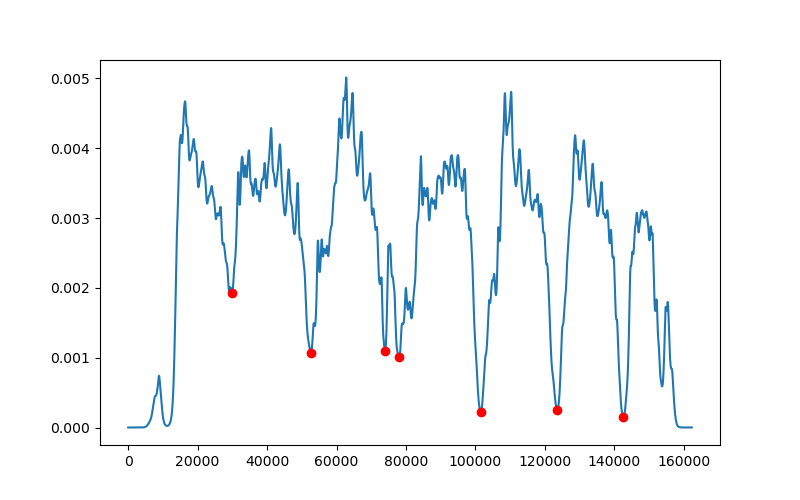

In [19]:
# Find peaks in morlet
from scipy.signal import find_peaks

peaks_min, _ = find_peaks(-wave_sum_morlet, prominence=np.std(wave_sum_morlet))

plt.figure(figsize=(8, 5))
plt.plot(s, wave_sum_morlet)
plt.plot(s[peaks_min], wave_sum_morlet[peaks_min], 'or')
plt.show()


### Estimate Reach metrics

The package contains routines that allow the characterization of metrics at a reach scale. All of the information related to the tree is store in the `River.tree_scales` attribute. 

c:\Users\danie\anaconda3\envs\pymeander_env\lib\site-packages\statsmodels\base\model.py:130: ValueWarning: unknown kwargs ['M']
  warnings.warn(msg, ValueWarning)


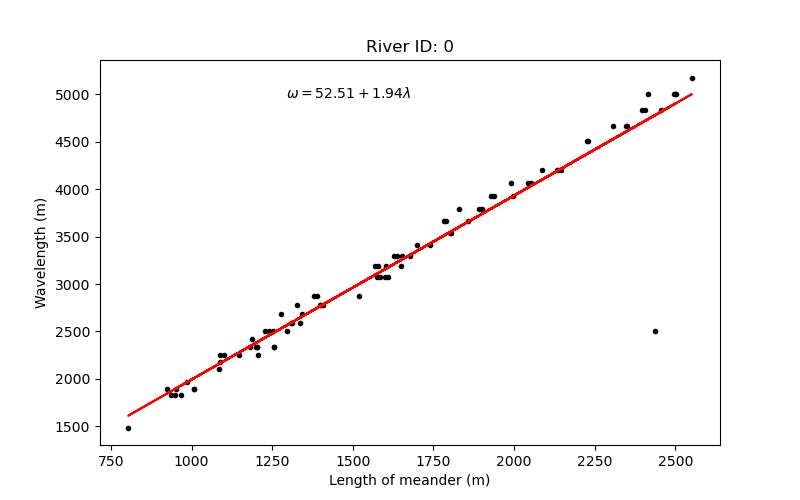

c:\Users\danie\anaconda3\envs\pymeander_env\lib\site-packages\statsmodels\base\model.py:130: ValueWarning: unknown kwargs ['M']
  warnings.warn(msg, ValueWarning)


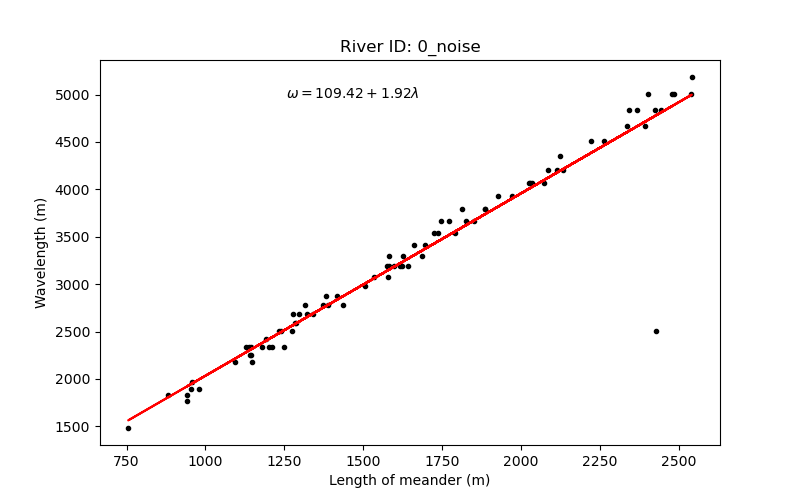

c:\Users\danie\anaconda3\envs\pymeander_env\lib\site-packages\statsmodels\base\model.py:130: ValueWarning: unknown kwargs ['M']
  warnings.warn(msg, ValueWarning)


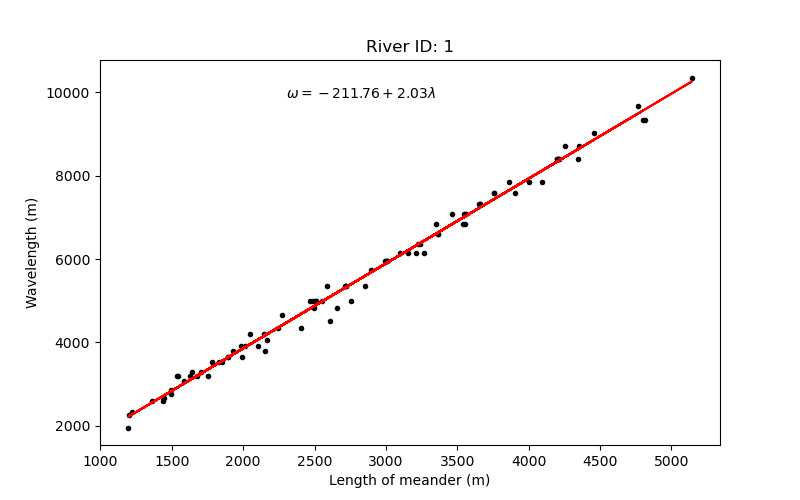

c:\Users\danie\anaconda3\envs\pymeander_env\lib\site-packages\statsmodels\base\model.py:130: ValueWarning: unknown kwargs ['M']
  warnings.warn(msg, ValueWarning)


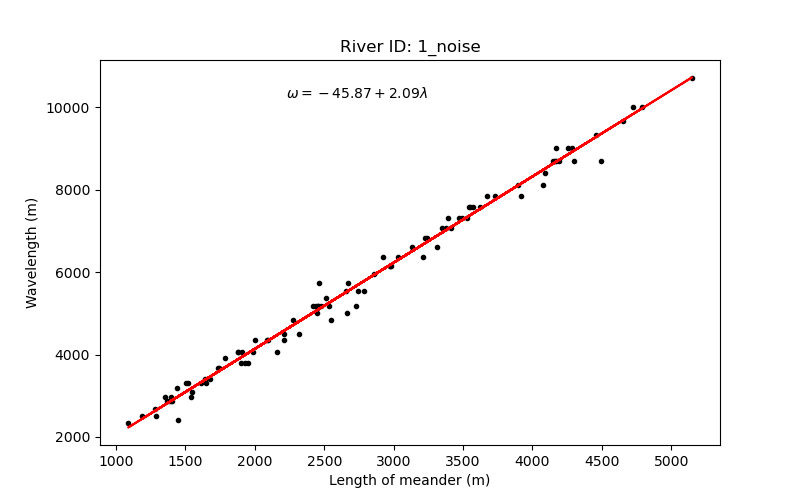

c:\Users\danie\anaconda3\envs\pymeander_env\lib\site-packages\statsmodels\base\model.py:130: ValueWarning: unknown kwargs ['M']
  warnings.warn(msg, ValueWarning)


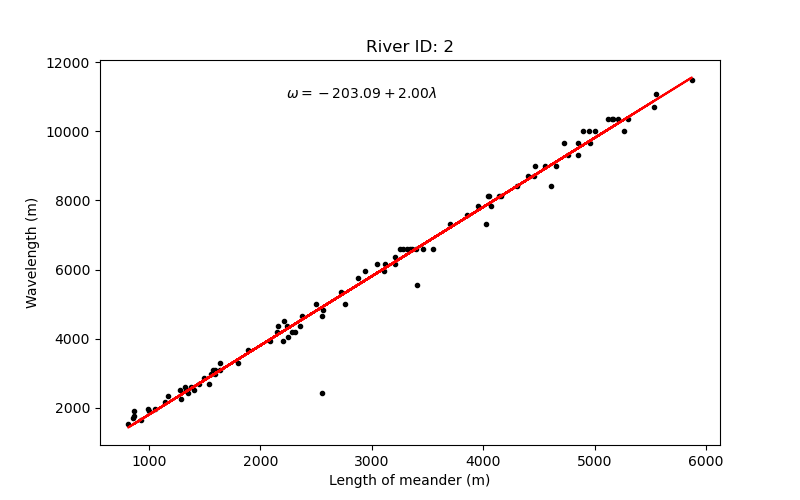

c:\Users\danie\anaconda3\envs\pymeander_env\lib\site-packages\statsmodels\base\model.py:130: ValueWarning: unknown kwargs ['M']
  warnings.warn(msg, ValueWarning)


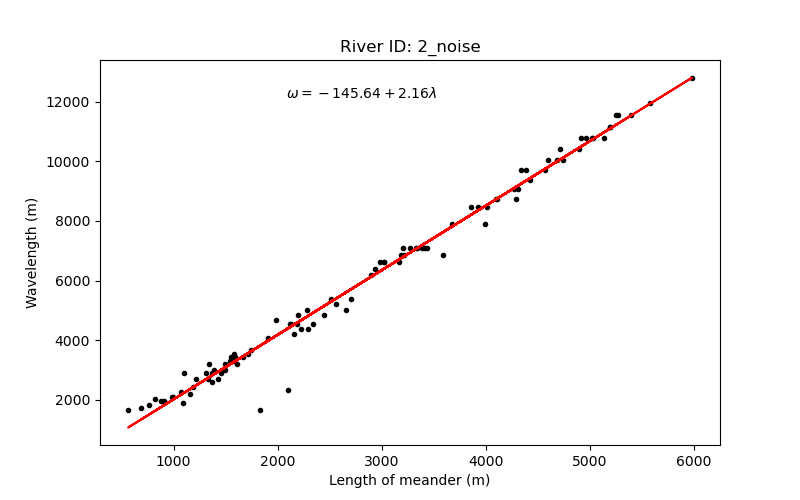

c:\Users\danie\anaconda3\envs\pymeander_env\lib\site-packages\statsmodels\base\model.py:130: ValueWarning: unknown kwargs ['M']
  warnings.warn(msg, ValueWarning)


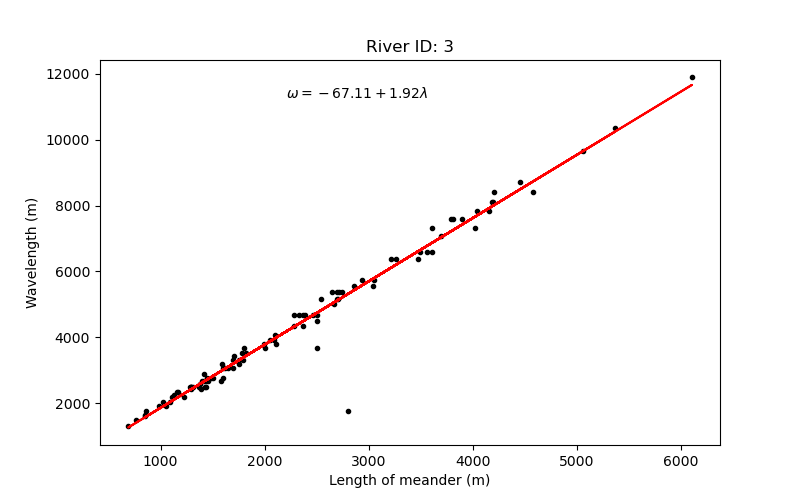

c:\Users\danie\anaconda3\envs\pymeander_env\lib\site-packages\statsmodels\base\model.py:130: ValueWarning: unknown kwargs ['M']
  warnings.warn(msg, ValueWarning)


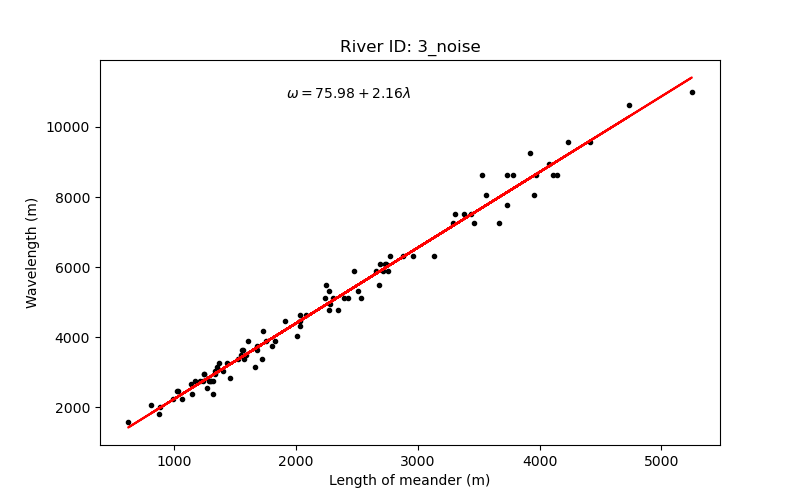

Done


In [42]:
# Look into relationships between wavelength and the length of the meander
river_ids = rivers['id_values']
plt.close('all')
for river_id in river_ids:
# river_id = '2'
    database_meander = rivers[river_id].tree_scales_database_meanders

    wavelength_c = database_meander['wavelength_c'].values
    lambda_value = database_meander['lambda_value'].values

    # Find line of with statsmodels
    import statsmodels.api as sm
    x = lambda_value
    y = wavelength_c
    res_sm_fit = sm.OLS(y, sm.add_constant(x), M=sm.robust.norms.HuberT()).fit()
    y_pred = res_sm_fit.params[0] + res_sm_fit.params[1]*x

    plt.figure(figsize=(8, 5))
    plt.title(f'River ID: {river_id}')
    plt.plot(x, y, '.k')
    plt.plot(lambda_value, y_pred, '-r')
    plt.xlabel('Length of meander (m)')
    plt.ylabel('Wavelength (m)')
    plt.text(
        0.3, 0.9,
        f'$\\omega = {res_sm_fit.params[0]:.2f}+{{{res_sm_fit.params[1]:.2f}}}\\lambda$',
        transform=plt.gca().transAxes)
    plt.show()

print('Done')

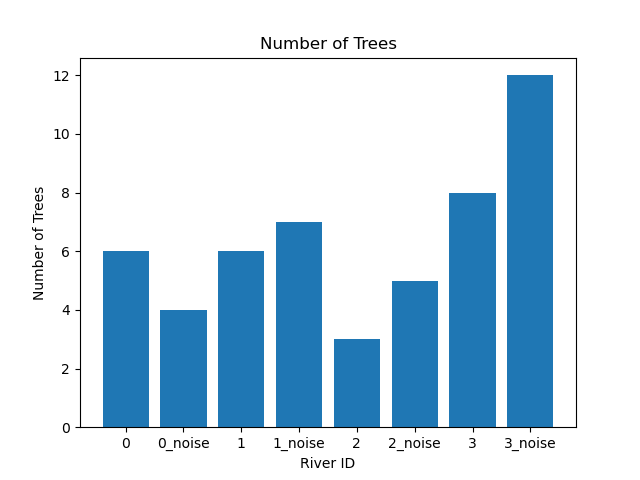

In [20]:
# Number of trees with respect to River
river_ids = rivers['id_values']
river_ids = np.sort(river_ids)
n_trees = []
for river_id in river_ids:
    n_trees.append(len(rivers[river_id].tree_scales.trees))

plt.figure()
plt.title('Number of Trees')
plt.bar(river_ids, n_trees)
plt.xlabel('River ID')
plt.ylabel('Number of Trees')
plt.savefig(f'synthetic_rivers/results/cwt/n_trees.png',
            dpi=300)
plt.show()

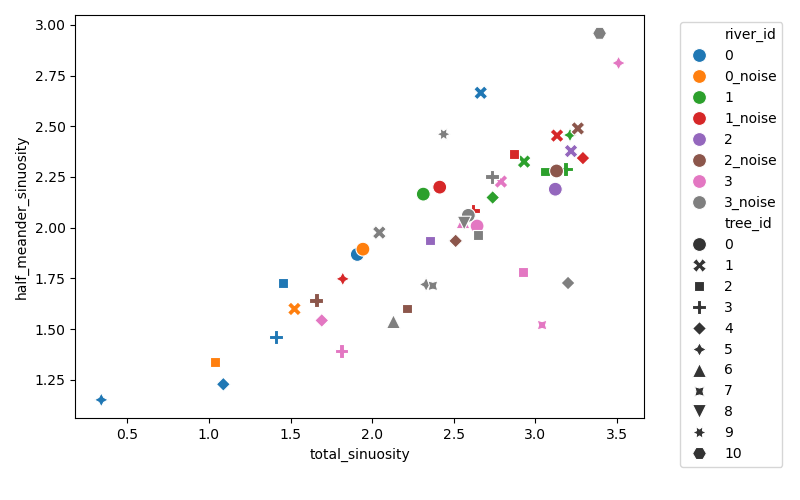

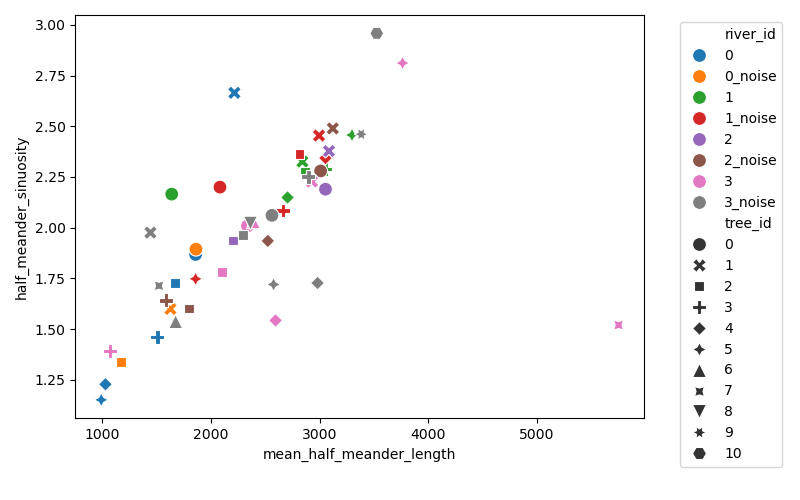

In [21]:
# Extract metrics with noise
river_ids = rivers['id_values']
river_ids = np.sort(river_ids)
variables = ['river_id', 'tree_id', 'total_sinuosity', 'half_meander_sinuosity',
             'full_meander_sinuosity','residual_meander_sinuosity',
             'mean_half_meander_length']
metrics = {v: [] for v in variables}
for river_id in river_ids:
    metrics_reach = rivers[river_id].metrics_reach
    river_id_r = [river_id] * len(metrics_reach['tree_id'])
    metrics['river_id'] += river_id_r
    for v in variables[1:]:
        metrics[v] += metrics_reach[v]

metrics = pd.DataFrame(metrics)
metrics.head()

fig = plt.figure(figsize=(8, 5))
sns.scatterplot(data=metrics, x='total_sinuosity', y='half_meander_sinuosity',
                hue='river_id', style='tree_id', s=100)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig(f'synthetic_rivers/results/cwt/sinuosity_comparison_1.png',
            dpi=300)
plt.show()

fig = plt.figure(figsize=(8, 5))
sns.scatterplot(data=metrics, x='mean_half_meander_length', y='half_meander_sinuosity',
                hue='river_id', style='tree_id', s=100)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig(f'synthetic_rivers/results/cwt/sinuosity_comparison_2.png',
            dpi=300)
plt.show()


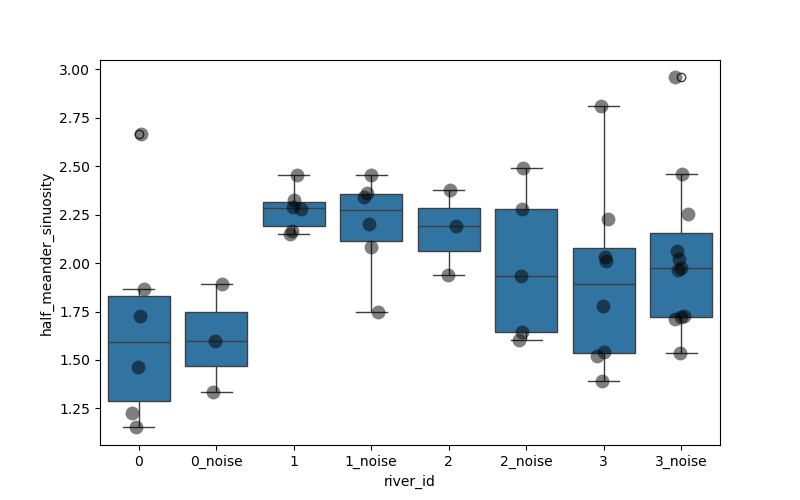

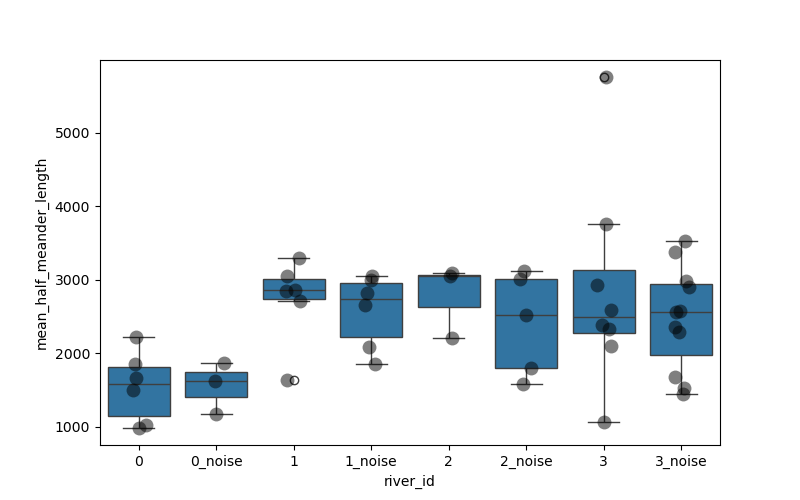

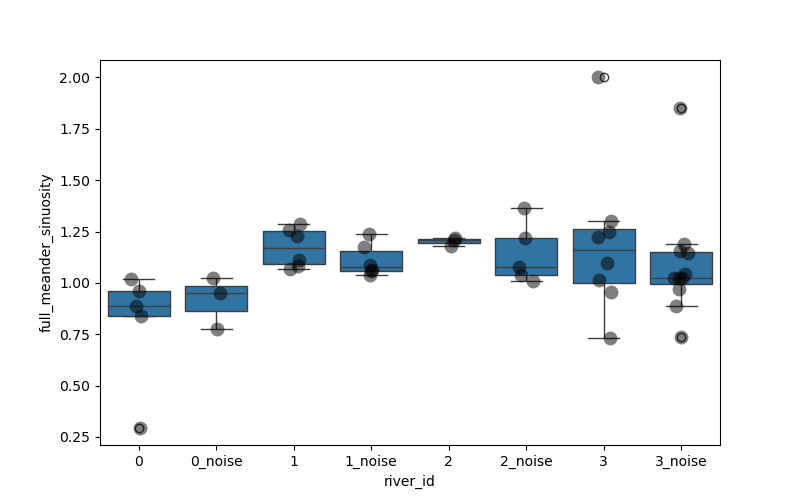

In [22]:

river_ids = rivers['id_values']
river_ids = np.sort(river_ids)
variables = ['river_id', 'tree_id', 'total_sinuosity', 'half_meander_sinuosity',
             'full_meander_sinuosity','residual_meander_sinuosity',
             'mean_half_meander_length']
metrics = {v: [] for v in variables}
for river_id in river_ids:
    metrics_reach = rivers[river_id].metrics_reach
    river_id_r = [river_id] * len(metrics_reach['tree_id'])
    metrics['river_id'] += river_id_r
    for v in variables[1:]:
        metrics[v] += metrics_reach[v]

metrics = pd.DataFrame(metrics)
metrics.head()

# plot boxplots using seabon
plt.figure(figsize=(8, 5))
sns.boxplot(data=metrics, x='river_id', y='half_meander_sinuosity',
            )
# add the amount of data points used to calculate the boxplot
sns.stripplot(data=metrics, x='river_id', y='half_meander_sinuosity',
              color='k', size=10, alpha=0.5)
plt.savefig(f'synthetic_rivers/results/cwt/sinuosity_comparison_3.png',
            dpi=300)
plt.show()

plt.figure(figsize=(8, 5))
sns.boxplot(data=metrics, x='river_id', y='mean_half_meander_length',
            )
# add the amount of data points used to calculate the boxplot
sns.stripplot(data=metrics, x='river_id', y='mean_half_meander_length',
              color='k', size=10, alpha=0.5)
plt.savefig(f'synthetic_rivers/results/cwt/sinuosity_comparison_4.png',
            dpi=300)
plt.show()

plt.figure(figsize=(8, 5))
sns.boxplot(data=metrics, x='river_id', y='full_meander_sinuosity',
            )
# add the amount of data points used to calculate the boxplot
sns.stripplot(data=metrics, x='river_id', y='full_meander_sinuosity',
              color='k', size=10, alpha=0.5)
plt.savefig(f'synthetic_rivers/results/cwt/sinuosity_comparison_5.png',
            dpi=300)
plt.show()



### Estimate Metrics for Meanders

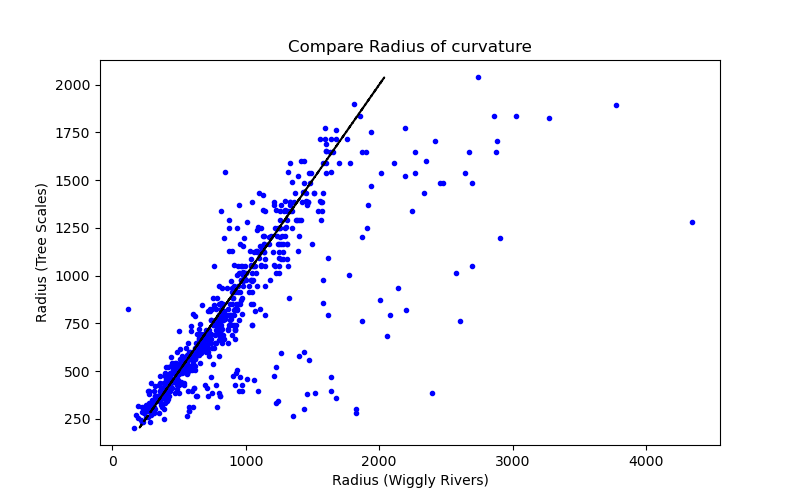

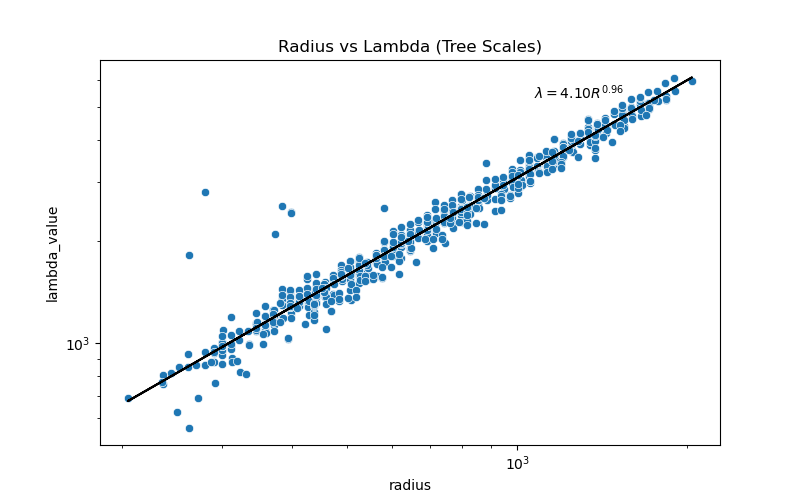

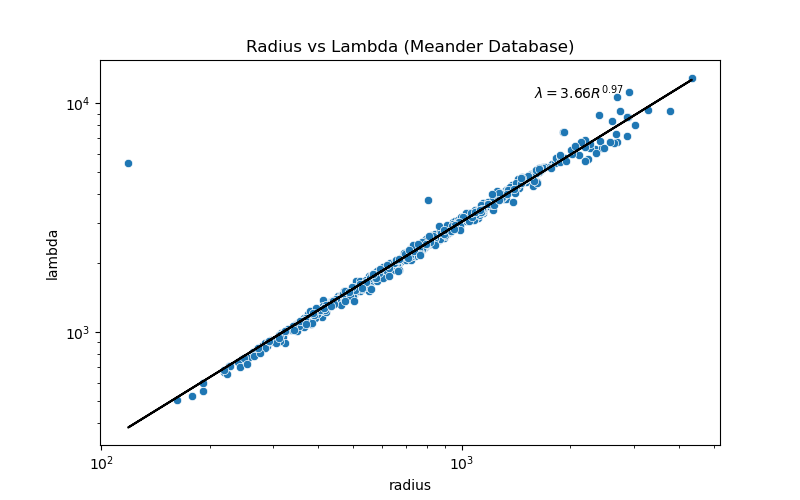

In [50]:
# Metrics for meanders
river_ids = rivers['id_values']
river_ids = np.sort(river_ids)
for river_id in river_ids:
    if river_id == '0':
        ts_database_meanders = rivers[river_id].tree_scales_database_meanders
    else:
        ts_database_meanders = pd.concat(
            [ts_database_meanders,
             rivers[river_id].tree_scales_database_meanders])

ts_database_meanders.reset_index(inplace=True, drop=True)
database = rivers.get_metric_databases()
database.head()

plt.close('all')
plt.figure(figsize=(8, 5))
plt.title('Compare Radius of curvature')
plt.plot(database['radius'], ts_database_meanders['radius'], '.b')
plt.plot(ts_database_meanders['radius'], ts_database_meanders['radius'], '--k')
plt.xlabel('Radius (Wiggly Rivers)')
plt.ylabel('Radius (Tree Scales)')
plt.savefig(f'synthetic_rivers/results/cwt/radius_comparison.png',
            dpi=300)
plt.show()

r = np.log10(ts_database_meanders['radius'].values)
lambda_value = np.log10(ts_database_meanders['lambda_value'].values)
res_sm_fit = sm.OLS(lambda_value, sm.add_constant(r)).fit()

plt.figure(figsize=(8, 5))
plt.title('Radius vs Lambda (Tree Scales)')
sns.scatterplot(data=ts_database_meanders, x='radius', y='lambda_value')
plt.plot(10**r, 10**(res_sm_fit.params[0] + res_sm_fit.params[1]*r), 'k-')
# plt.plot(10**r, 10**r, 'k-')
plt.gca().set_xscale('log')
plt.gca().set_yscale('log')
plt.text(
    0.7, 0.9,
    f'$\\lambda = {10**res_sm_fit.params[0]:.2f} R^{{{res_sm_fit.params[1]:.2f}}}$',
    transform=plt.gca().transAxes)
plt.savefig(f'synthetic_rivers/results/cwt/radius_vs_lambda_wavelets.png',
            dpi=300)
plt.show()

r = np.log10(database['radius'].values)
lambda_value = np.log10(database['lambda'].values)
res_sm_fit = sm.OLS(lambda_value, sm.add_constant(r)).fit()

plt.figure(figsize=(8, 5))
plt.title('Radius vs Lambda (Meander Database)')
sns.scatterplot(data=database, x='radius', y='lambda')
plt.plot(10**r, 10**(res_sm_fit.params[0] + res_sm_fit.params[1]*r), 'k-')
# plt.plot(10**r, 10**r, 'k-')
plt.text(
    0.7, 0.9,
    f'$\\lambda = {10**res_sm_fit.params[0]:.2f} R^{{{res_sm_fit.params[1]:.2f}}}$',
    transform=plt.gca().transAxes)
plt.gca().set_xscale('log')
plt.gca().set_yscale('log')
plt.savefig(f'synthetic_rivers/results/cwt/radius_vs_lambda_wiggly_rivers.png',
            dpi=300)
plt.show()

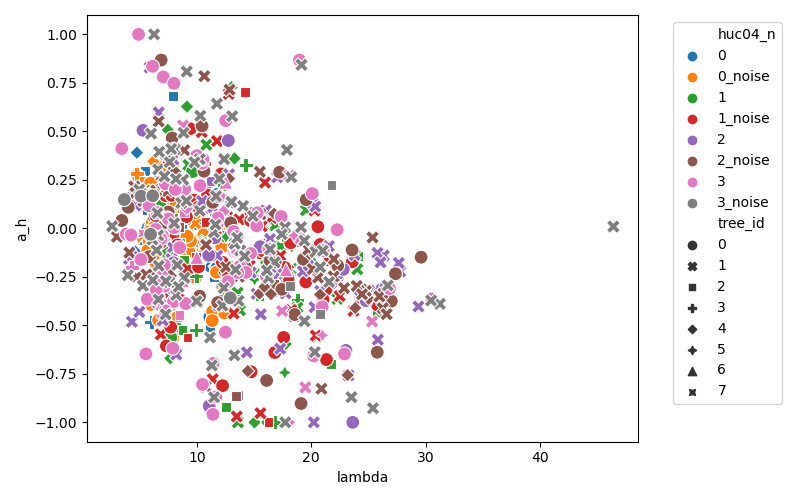

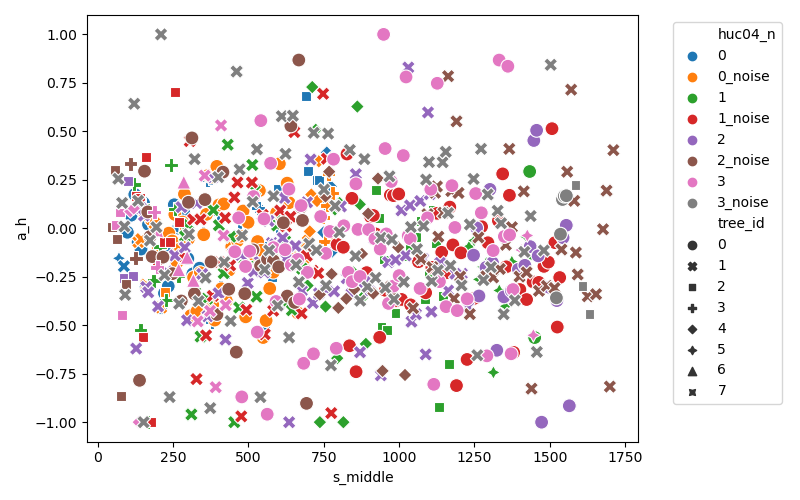

In [36]:
database = rivers.get_metric_databases()
plt.figure(figsize=(8, 5))
sns.scatterplot(data=database, x='lambda', y='a_h', hue='huc04_n',
                style='tree_id', s=100)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig(f'synthetic_rivers/results/cwt/lambda_vs_a_h.png',
            dpi=300)
plt.show()

plt.figure(figsize=(8, 5))
sns.scatterplot(data=database, x='s_middle', y='a_h', hue='huc04_n',
                style='tree_id', s=100)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig(f'synthetic_rivers/results/cwt/s_vs_a_h.png',
            dpi=300)
plt.show()


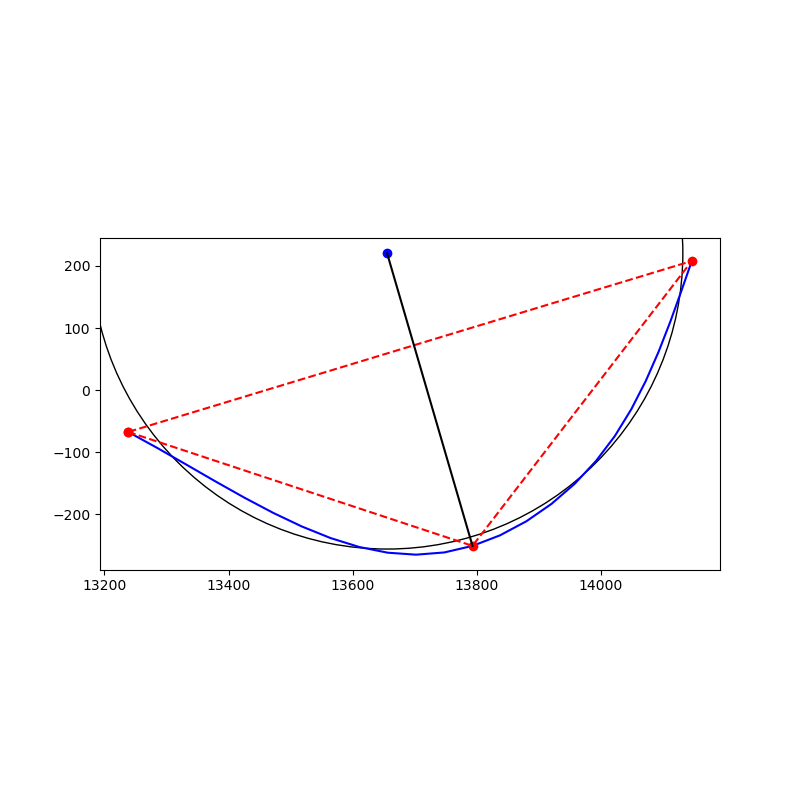

In [15]:
meander = rivers['0'].meanders[0]
fig = meander.plot_meander()
plt.show()

### Sparse data from the real river 

Create a river data that mimics the real data gathered from a river system.

2023-09-29 16:40:39,256[INFO] info: Start Logger in Rivers
2023-09-29 16:40:39,312[INFO] info: Resample calculated with `River.calculate_spline()`
2023-09-29 16:40:39,340[INFO] info: Resample calculated with `River.calculate_spline()`
2023-09-29 16:40:39,405[INFO] info: Resample calculated with `River.calculate_spline()`
2023-09-29 16:40:39,454[INFO] info: Resample calculated with `River.calculate_spline()`
2023-09-29 16:40:39,521[INFO] info: Resample calculated with `River.calculate_spline()`
2023-09-29 16:40:39,579[INFO] info: Resample calculated with `River.calculate_spline()`
2023-09-29 16:40:39,652[INFO] info: Resample calculated with `River.calculate_spline()`
2023-09-29 16:40:39,706[INFO] info: Resample calculated with `River.calculate_spline()`


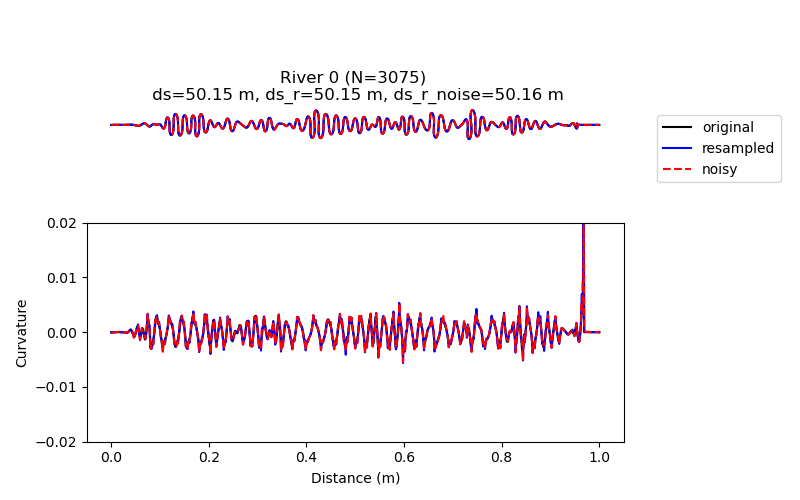

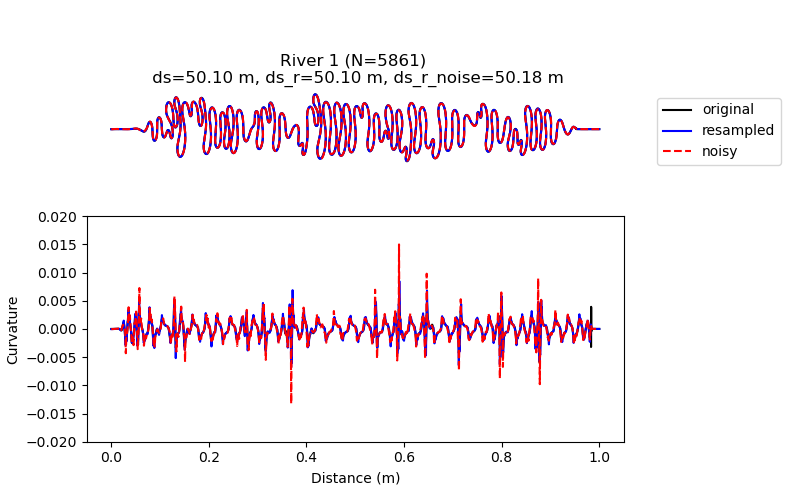

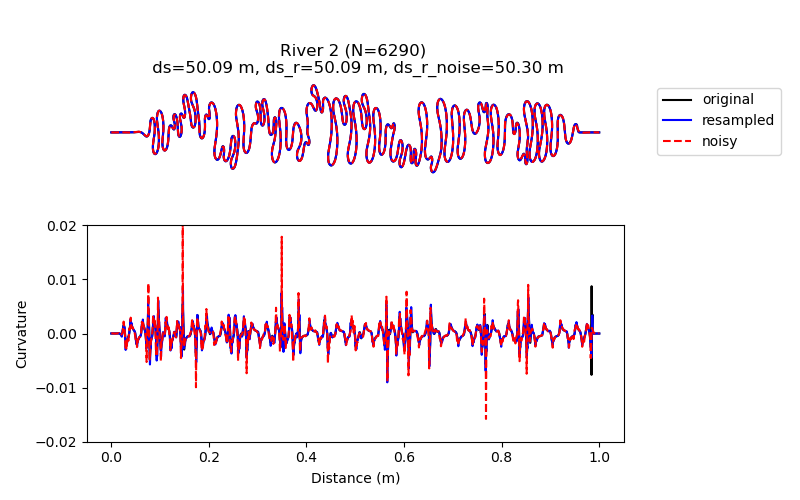

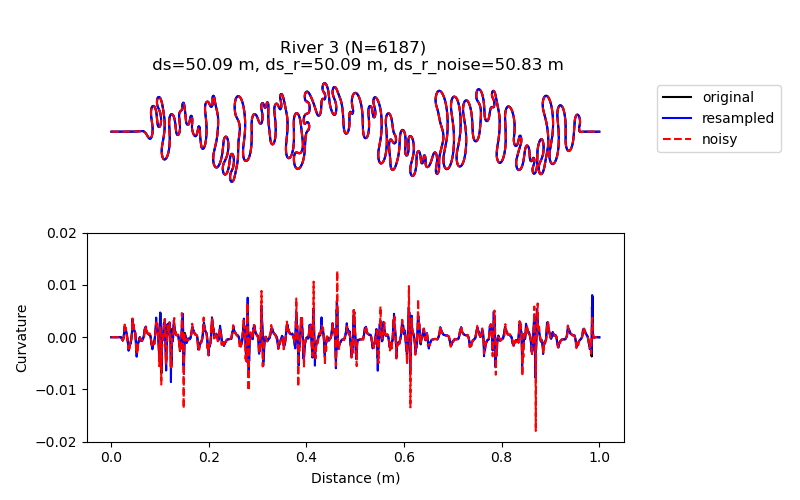

2023-09-29 16:40:41,029[INFO] info: Saving 0
2023-09-29 16:40:41,030[INFO] info: 0 No CWT poly or ZC lines extracted
2023-09-29 16:40:41,031[INFO] info: 0 No tree scales extracted
2023-09-29 16:40:41,031[INFO] info: 0 No meanders extracted to save
2023-09-29 16:40:41,031[INFO] info: Saving 0_noise
2023-09-29 16:40:41,032[INFO] info: 0_noise No CWT poly or ZC lines extracted
2023-09-29 16:40:41,032[INFO] info: 0_noise No tree scales extracted
2023-09-29 16:40:41,033[INFO] info: 0_noise No meanders extracted to save
2023-09-29 16:40:41,033[INFO] info: Saving 1
2023-09-29 16:40:41,034[INFO] info: 1 No CWT poly or ZC lines extracted
2023-09-29 16:40:41,034[INFO] info: 1 No tree scales extracted
2023-09-29 16:40:41,035[INFO] info: 1 No meanders extracted to save
2023-09-29 16:40:41,036[INFO] info: Saving 1_noise
2023-09-29 16:40:41,037[INFO] info: 1_noise No CWT poly or ZC lines extracted
2023-09-29 16:40:41,037[INFO] info: 1_noise No tree scales extracted
2023-09-29 16:40:41,038[INFO] info

In [ ]:
# Reset Figures
plt.close('all')
# Load river data
data = FM.load_data('synthetic_rivers/synthetic_rivers_w_noise.hdf5')
river_ids = list(data.keys())
# ------------------------------
# Arguments for the noise data
# ------------------------------
kwargs_resample = {
    '0':{'smooth': len(data['0']['x'])*1e2},
    '1':{'smooth': len(data['0']['x'])*1e2},
    '2':{'smooth': len(data['0']['x'])*1e2},
    '3':{'smooth': len(data['0']['x'])*1e2},
    '0_noise':{'smooth': len(data['0']['x'])*1e2},
    '1_noise':{'smooth': len(data['0']['x'])*1e3},
    '2_noise':{'smooth': len(data['0']['x'])*1e3},
    '3_noise':{'smooth': len(data['0']['x'])*1e3},
    }

# ------------------------------
# Create Rivers class
# ------------------------------
rivers = Rivers(logger=logger)
# ------------------------------
# Add Rives into class
# ------------------------------
i = 0
for river_id in river_ids:
    # ------------------------------
    # Add original river 
    # ------------------------------
    x_ch = data[river_id]['x']
    y_ch = data[river_id]['y']
    rivers.add_river(river_id, x_ch, y_ch, resample_flag=True,
                     kwargs_resample=kwargs_resample[river_id])
    # Calculate curvature
    rivers[river_id].calculate_curvature()
    # ------------------------------
    # Add noisy river 
    # ------------------------------
    x_ch_noise = data[river_id]['x_noise']
    y_ch_noise = data[river_id]['y_noise']
    rivers.add_river(
        f'{river_id}_noise', x_ch_noise, y_ch_noise, resample_flag=True,
        kwargs_resample=kwargs_resample[f'{river_id}_noise'])
    # Calculate cuvature
    rivers[f'{river_id}_noise'].calculate_curvature()

for river_id in river_ids:
    # ------------------------------
    # Plot
    # ------------------------------
    x_ch = data[river_id]['x']
    y_ch = data[river_id]['y']
    c_ch = data[river_id]['c']
    s_ch = data[river_id]['s']
    ds_ch = data[river_id]['ds']
    x = rivers[river_id].x
    y = rivers[river_id].y
    c = rivers[river_id].c
    s = rivers[river_id].s
    ds = rivers[river_id].ds
    x_noise = rivers[f'{river_id}_noise'].x
    y_noise = rivers[f'{river_id}_noise'].y
    c_noise = rivers[f'{river_id}_noise'].c
    s_noise = rivers[f'{river_id}_noise'].s
    ds_noise = rivers[f'{river_id}_noise'].ds

    f, ax = plt.subplots(2, 1, figsize=(8, 5))
    # Plot river
    ax[0].plot(x_ch, y_ch, '-k', label='original')
    ax[0].plot(x, y, '-b', label='resampled')
    ax[0].plot(x_noise, y_noise, '--r', label='noisy')
    ax[0].set_aspect(3, adjustable='box')
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].set_title(
        f'River {river_id} (N={len(x_ch)}) \n ds={np.mean(ds_ch):.2f} m, '
        f'ds_r={ds:.2f} m, '
        f'ds_r_noise={ds_noise:.2f} m')
    # Remove axis lines
    ax[0].spines['top'].set_visible(False)
    ax[0].spines['right'].set_visible(False)
    ax[0].spines['bottom'].set_visible(False)
    ax[0].spines['left'].set_visible(False)
    ax[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Curvature
    ax[1].plot(s_ch/np.max(s_ch), c_ch, '-k', label='original')
    ax[1].plot(s/np.max(s), c, '-b', label='resampled')
    ax[1].plot(s_noise/np.max(s_noise), c_noise, '--r', label='noisy')
    # if river_id == '0':
    ax[1].set_ylim([-0.02, 0.02])
    ax[1].set_xlabel('Distance (m)')
    ax[1].set_ylabel('Curvature')
    plt.tight_layout()
    utl.cr_folder('synthetic_rivers/results/')
    plt.savefig(f'synthetic_rivers/results/river_{river_id}_curvature.png',
                dpi=300)
    plt.show()

# ------------------------------
# Save Rivers
# ------------------------------
rivers.save_rivers(
    f'synthetic_rivers/rivers_class/',
    'river_network.hdf5', save_cwt_info=True)


1716.83891824203


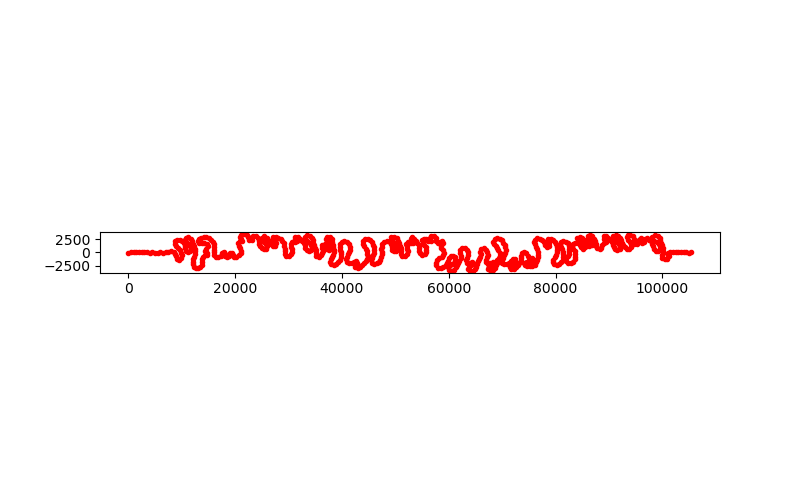

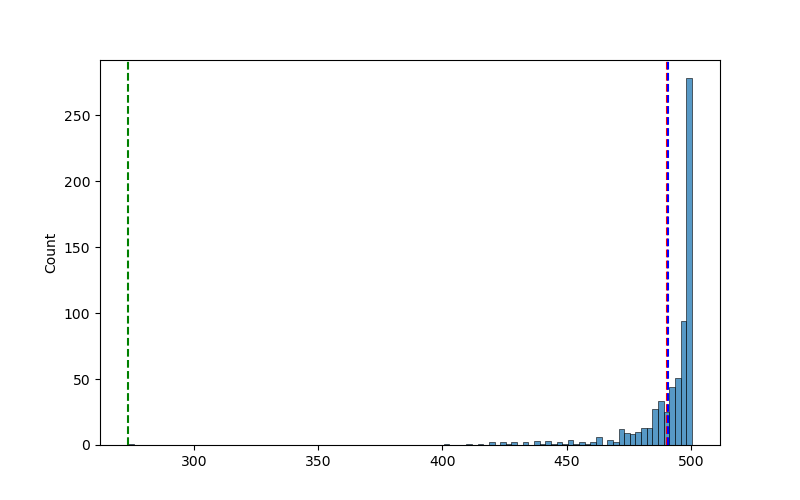

In [ ]:
# Reset figures
plt.close('all')
# Select a random seed for consistency
np.random.seed(123)

# -------------------
# Load river data
# -------------------
data = FM.load_data('test_meanderpy/test_meanderpy.hdf5')

# Select River to perform analysis
id_river = '3'

# Value for spacing
spacing = 10
indices = np.arange(0, len(data[id_river]['x']), spacing)

# Extract River Network
x_ch_o = data[id_river]['x']
y_ch_o = data[id_river]['y']
x_ch = data[id_river]['x'][indices]
y_ch = data[id_river]['y'][indices]
coords = np.array([x_ch, y_ch]).T
s_ch = RF.get_reach_distances(coords)
ds = np.diff(s_ch)
ds = np.append(ds[0], ds)
# Curvature original data
_, c_ch, _ = RF.calculate_curvature(s_ch, x_ch, y_ch)

# Fit line
line_model = sm.OLS(y_ch, x_ch).fit()
sd_resid = np.std(line_model.resid)
print(sd_resid)


sigma = sd_resid/100
x_ch_noise = x_ch + np.random.normal(0, sigma, size=len(x_ch))
y_ch_noise = y_ch + np.random.normal(0, sigma, size=len(y_ch))
coords = np.array([x_ch_noise, y_ch_noise]).T
s_ch_noise = RF.get_reach_distances(coords)
s_real = RF.get_reach_distances(np.array([x_ch_noise, y_ch_noise]).T)

plt.figure(figsize=(8, 5))
plt.plot(x_ch_o, y_ch_o, '-k', label='original')
plt.plot(x_ch, y_ch, '--b', label='Upsampled')
plt.plot(x_ch_noise, y_ch_noise, '.r')
plt.gca().set_aspect('equal', adjustable='box')
plt.show()



data_df = pd.DataFrame({'x': x_ch, 'y': y_ch, 's': s_ch, 'ds': ds})

geometric_mean_value = 10**np.mean(np.log10(ds))
mean_value = np.mean(ds)
min_value = np.min(ds)

plt.figure(figsize=(8, 5))
sns.histplot(x=ds, bins=100)
plt.axvline(geometric_mean_value, color='r', linestyle='--',
            label='Geometric Mean')
plt.axvline(mean_value, color='b', linestyle='--', label='Mean')
plt.axvline(min_value, color='g', linestyle='--', label='Min')

plt.show()


## References

Howard, A. D., & Knutson, T. R. (1984). Sufficient conditions for river meandering: A simulation approach. Water Resources Research, 20(11), 1659–1667. https://doi.org/10.1029/WR020i011p01659

Sylvester, Z. (2023, September 14). zsylvester/meanderpy. Python. Retrieved from https://github.com/zsylvester/meanderpy (Original work published November 21, 2018)
